In [ ]:
# Step 1: 挂载Drive
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import cv2
import numpy as np
from PIL import Image
!pip install qwen-vl-utils -q
import torch
import os
from transformers import Qwen2_5_VLForConditionalGeneration, AutoProcessor
import gc
from tqdm import tqdm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.3/36.3 MB 80.1 MB/s eta 0:00:00


In [ ]:


# Step 2: 加载模型并缓存到Drive

cache_dir = "/content/drive/MyDrive/models/qwen25vl3b"
os.makedirs(cache_dir, exist_ok=True)

print("加载Qwen2.5-VL-3B（缓存到Drive）...")
model = Qwen2_5_VLForConditionalGeneration.from_pretrained(
    "Qwen/Qwen2.5-VL-3B-Instruct",
    torch_dtype=torch.float16,
    device_map="auto",
    cache_dir=cache_dir
)

processor = AutoProcessor.from_pretrained(
    "Qwen/Qwen2.5-VL-3B-Instruct",
    cache_dir=cache_dir
)

print("✅ 模型已保存到Drive，下次直接加载不用重新下载")

# Step 3: 测试vision encoder
vision_encoder = model.model.visual
print(f"\nVision Encoder子模块：")
for name, module in vision_encoder.named_children():
    param_count = sum(p.numel() for p in module.parameters())
    print(f"  {name}: {type(module).__name__}, {param_count/1e6:.1f}M params")

加载Qwen2.5-VL-3B（缓存到Drive）...


config.json: 0.00B [00:00, ?B/s]

model.safetensors.index.json: 0.00B [00:00, ?B/s]

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/824 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/216 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

chat_template.json: 0.00B [00:00, ?B/s]

The image processor of type `Qwen2VLImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

✅ 模型已保存到Drive，下次直接加载不用重新下载

Vision Encoder子模块：
  patch_embed: Qwen2_5_VisionPatchEmbed, 1.5M params
  rotary_pos_emb: Qwen2_5_VisionRotaryEmbedding, 0.0M params
  blocks: ModuleList, 630.5M params
  merger: Qwen2_5_VLPatchMerger, 36.7M params


In [ ]:


DATA_ROOT = "/content/drive/MyDrive/utd_mhad"

# 读一帧视频
def get_one_frame(action=5, subject=1, trial=1):
    fname = f"a{action}_s{subject}_t{trial}_color.avi"
    for part in ['RGB-part1','RGB-part2','RGB-part3','RGB-part4']:
        p = f"{DATA_ROOT}/{part}/{fname}"
        import os
        if os.path.exists(p):
            cap = cv2.VideoCapture(p)
            ret, frame = cap.read()
            cap.release()
            if ret:
                frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                return Image.fromarray(frame)
    return None

img = get_one_frame()
print(f"图片大小: {img.size}")

# 用processor处理
from qwen_vl_utils import process_vision_info

messages = [{
    "role": "user",
    "content": [
        {"type": "image", "image": img},
        {"type": "text", "text": "describe"}
    ]
}]

text = processor.apply_chat_template(
    messages, tokenize=False, add_generation_prompt=True)
image_inputs, video_inputs = process_vision_info(messages)
inputs = processor(
    text=[text],
    images=image_inputs,
    videos=video_inputs,
    return_tensors="pt"
).to(model.device)

print(f"\nProcessor输出：")
for k, v in inputs.items():
    if isinstance(v, torch.Tensor):
        print(f"  {k}: shape={v.shape}, dtype={v.dtype}")

# 跑vision encoder
with torch.no_grad():
    pixel_values = inputs['pixel_values'].to(model.device)
    grid_thw = inputs.get('image_grid_thw', None)

    output = vision_encoder(pixel_values, grid_thw=grid_thw)

    # 看输出结构
    print(f"输出类型: {type(output)}")
    print(f"输出属性: {[k for k in dir(output) if not k.startswith('_')]}")

    # 试几种方式取tokens
    if hasattr(output, 'last_hidden_state'):
        tokens = output.last_hidden_state
        print(f"\n✅ last_hidden_state: {tokens.shape}")
    if hasattr(output, 'pooler_output'):
        pool = output.pooler_output
        print(f"✅ pooler_output: {pool.shape}")
    if isinstance(output, tuple):
        print(f"\n是tuple，长度={len(output)}")
        for i, o in enumerate(output):
            if hasattr(o, 'shape'):
                print(f"  [{i}]: {o.shape}")

图片大小: (640, 480)

Processor输出：
  input_ids: shape=torch.Size([1, 413]), dtype=torch.int64
  attention_mask: shape=torch.Size([1, 413]), dtype=torch.int64
  pixel_values: shape=torch.Size([1564, 1176]), dtype=torch.float32
  image_grid_thw: shape=torch.Size([1, 3]), dtype=torch.int64
输出类型: <class 'transformers.modeling_outputs.BaseModelOutputWithPooling'>
输出属性: ['attentions', 'clear', 'copy', 'fromkeys', 'get', 'hidden_states', 'items', 'keys', 'last_hidden_state', 'move_to_end', 'pooler_output', 'pop', 'popitem', 'setdefault', 'to_tuple', 'update', 'values']

✅ last_hidden_state: torch.Size([1564, 1280])
✅ pooler_output: torch.Size([391, 2048])


In [ ]:
# 试试缩小图片，看token数量会减少多少 可删除

for size in [(224, 224), (128, 128), (64, 64)]:
    img_resized = img.resize(size)

    messages = [{
        "role": "user",
        "content": [
            {"type": "image", "image": img_resized},
            {"type": "text", "text": "describe"}
        ]
    }]

    text = processor.apply_chat_template(
        messages, tokenize=False, add_generation_prompt=True)
    image_inputs, video_inputs = process_vision_info(messages)
    inputs = processor(
        text=[text], images=image_inputs,
        videos=video_inputs, return_tensors="pt"
    ).to(model.device)

    with torch.no_grad():
        output = vision_encoder(
            inputs['pixel_values'].to(model.device),
            grid_thw=inputs.get('image_grid_thw', None))

    print(f"图片{size}: "
          f"patches={output.last_hidden_state.shape[0]}, "
          f"merged={output.pooler_output.shape[0]}, "
          f"dim={output.pooler_output.shape[1]}")

图片(224, 224): patches=256, merged=64, dim=2048
图片(128, 128): patches=100, merged=25, dim=2048
图片(64, 64): patches=16, merged=4, dim=2048


In [ ]:

gc.collect()
torch.cuda.empty_cache()

total = torch.cuda.get_device_properties(0).total_memory
used = torch.cuda.memory_allocated()
print(f"显存: {used/1e9:.2f}GB / {total/1e9:.1f}GB")


frames = [img.resize((224, 224)) for _ in range(5)]
tokens_list = []

with torch.no_grad():
    for i, frame in enumerate(frames):
        messages = [{
            "role": "user",
            "content": [
                {"type": "image", "image": frame},
                {"type": "text", "text": "describe"}
            ]
        }]
        text = processor.apply_chat_template(
            messages, tokenize=False, add_generation_prompt=True)
        image_inputs, video_inputs = process_vision_info(messages)
        inputs = processor(
            text=[text], images=image_inputs,
            videos=video_inputs, return_tensors="pt"
        ).to(model.device)

        output = vision_encoder(
            inputs['pixel_values'].to(model.device),
            grid_thw=inputs.get('image_grid_thw', None))
        tokens_list.append(output.pooler_output.cpu())

        if i == 0:
            print(f"每帧tokens: {output.pooler_output.shape}")

all_tokens = torch.cat(tokens_list, dim=0)
used_after = torch.cuda.memory_allocated()
print(f"\n5帧拼接: {all_tokens.shape}")
print(f"60帧预计: ({60*64}, 2048)")
print(f"显存: {used_after/1e9:.2f}GB / {total/1e9:.1f}GB")
print(f"剩余: {(total - used_after)/1e9:.1f}GB")

显存: 7.54GB / 42.4GB
每帧tokens: torch.Size([64, 2048])

5帧拼接: torch.Size([320, 2048])
60帧预计: (3840, 2048)
显存: 7.54GB / 42.4GB
剩余: 34.9GB


#Step 3: Extract Vision Tokens from all 861 videos

In [ ]:

# Step 3: 提取所有UTD-MHAD视频的vision tokens
# 每个视频 → 60帧 × 224×224 → 每帧64个tokens × 2048维
# 保存到Drive，后续训练直接加载，不用重复提取


DATA_ROOT = "/content/drive/MyDrive/utd_mhad"
TARGET_FRAMES = 60
IMG_SIZE = 224

def find_video(action, subject, trial):
    fname = f"a{action}_s{subject}_t{trial}_color.avi"
    for part in ['RGB-part1','RGB-part2','RGB-part3','RGB-part4']:
        p = os.path.join(DATA_ROOT, part, fname)
        if os.path.exists(p):
            return p
    return None

def extract_video_frames(video_path, n_frames=TARGET_FRAMES):
    cap = cv2.VideoCapture(video_path)
    total = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    indices = np.linspace(0, total-1, n_frames, dtype=int)
    frames = []
    for idx in indices:
        cap.set(cv2.CAP_PROP_POS_FRAMES, idx)
        ret, frame = cap.read()
        if not ret:
            break
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frame = Image.fromarray(frame).resize((IMG_SIZE, IMG_SIZE))
        frames.append(frame)
    cap.release()
    if len(frames) < n_frames:
        return None
    return frames

def extract_vision_tokens(frames, batch_size=10):
    """分batch过vision encoder，避免OOM"""
    all_tokens = []

    for i in range(0, len(frames), batch_size):
        batch_frames = frames[i:i+batch_size]
        batch_tokens = []

        with torch.no_grad():
            for frame in batch_frames:
                messages = [{
                    "role": "user",
                    "content": [
                        {"type": "image", "image": frame},
                        {"type": "text", "text": "d"}
                    ]
                }]
                text = processor.apply_chat_template(
                    messages, tokenize=False,
                    add_generation_prompt=True)
                image_inputs, video_inputs = process_vision_info(messages)
                inputs = processor(
                    text=[text], images=image_inputs,
                    videos=video_inputs, return_tensors="pt"
                ).to(model.device)

                output = vision_encoder(
                    inputs['pixel_values'].to(model.device),
                    grid_thw=inputs.get('image_grid_thw', None))

                batch_tokens.append(output.pooler_output.cpu())

        all_tokens.extend(batch_tokens)

    # (60, 64, 2048) → 每帧64个tokens
    return torch.stack(all_tokens)

# ── 提取所有视频 ──
print("开始提取所有视频的vision tokens...")
print("每个视频: 60帧 × 64 tokens × 2048维\n")

vision_cache = {}
success, fail = 0, 0

for action in range(1, 28):
    for subject in range(1, 9):
        for trial in range(1, 5):
            vp = find_video(action, subject, trial)
            if vp is None:
                fail += 1
                continue

            frames = extract_video_frames(vp)
            if frames is None:
                fail += 1
                continue

            tokens = extract_vision_tokens(frames)
            vision_cache[(action, subject, trial)] = tokens
            success += 1

    print(f"  Action {action:2d}/27 完成, 成功={success}")

print(f"\n✅ 提取完成: {success}个视频")
print(f"❌ 失败: {fail}个")
print(f"每个视频tokens: {list(vision_cache.values())[0].shape}")

# 保存到Drive
save_path = "/content/drive/MyDrive/utd_mhad/vision_tokens_qwen25.pt"
torch.save(vision_cache, save_path)
print(f"\n💾 已保存到: {save_path}")
print(f"文件大小: {os.path.getsize(save_path)/1e9:.2f}GB")

开始提取所有视频的vision tokens...
每个视频: 60帧 × 64 tokens × 2048维

  Action  1/27 完成, 成功=32
  Action  2/27 完成, 成功=64
  Action  3/27 完成, 成功=96
  Action  4/27 完成, 成功=128
  Action  5/27 完成, 成功=160
  Action  6/27 完成, 成功=192
  Action  7/27 完成, 成功=224
  Action  8/27 完成, 成功=255
  Action  9/27 完成, 成功=287
  Action 10/27 完成, 成功=319
  Action 11/27 完成, 成功=351
  Action 12/27 完成, 成功=383
  Action 13/27 完成, 成功=415
  Action 14/27 完成, 成功=447
  Action 15/27 完成, 成功=479
  Action 16/27 完成, 成功=511
  Action 17/27 完成, 成功=543
  Action 18/27 完成, 成功=575
  Action 19/27 完成, 成功=607
  Action 20/27 完成, 成功=639
  Action 21/27 完成, 成功=671
  Action 22/27 完成, 成功=703
  Action 23/27 完成, 成功=734
  Action 24/27 完成, 成功=766
  Action 25/27 完成, 成功=798
  Action 26/27 完成, 成功=830
  Action 27/27 完成, 成功=861

✅ 提取完成: 861个视频
❌ 失败: 3个
每个视频tokens: torch.Size([60, 64, 2048])

💾 已保存到: /content/drive/MyDrive/utd_mhad/vision_tokens_qwen25.pt
文件大小: 13.54GB


视频 a5_s1_t1 (throw)
Tokens shape: torch.Size([60, 64, 2048])
  60帧, 每帧64个tokens, 每个token 2048维

数值统计:
  mean: -0.0153
  std:  1.4629
  min:  -42.1562
  max:  27.8438


/tmp/ipykernel_7044/2881199572.py:40: UserWarning: Glyph 32500 (\N{CJK UNIFIED IDEOGRAPH-7EF4}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_7044/2881199572.py:40: UserWarning: Glyph 24230 (\N{CJK UNIFIED IDEOGRAPH-5EA6}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_7044/2881199572.py:40: UserWarning: Glyph 21069 (\N{CJK UNIFIED IDEOGRAPH-524D}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_7044/2881199572.py:40: UserWarning: Glyph 24320 (\N{CJK UNIFIED IDEOGRAPH-5F00}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_7044/2881199572.py:40: UserWarning: Glyph 22987 (\N{CJK UNIFIED IDEOGRAPH-59CB}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_7044/2881199572.py:40: UserWarning: Glyph 20934 (\N{CJK UNIFIED IDEOGRAPH-51C6}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_7044/2881199572.py:40: UserWarning: Glyph 22791 (\N{CJK UNIFIED IDEOGRAPH-5907}

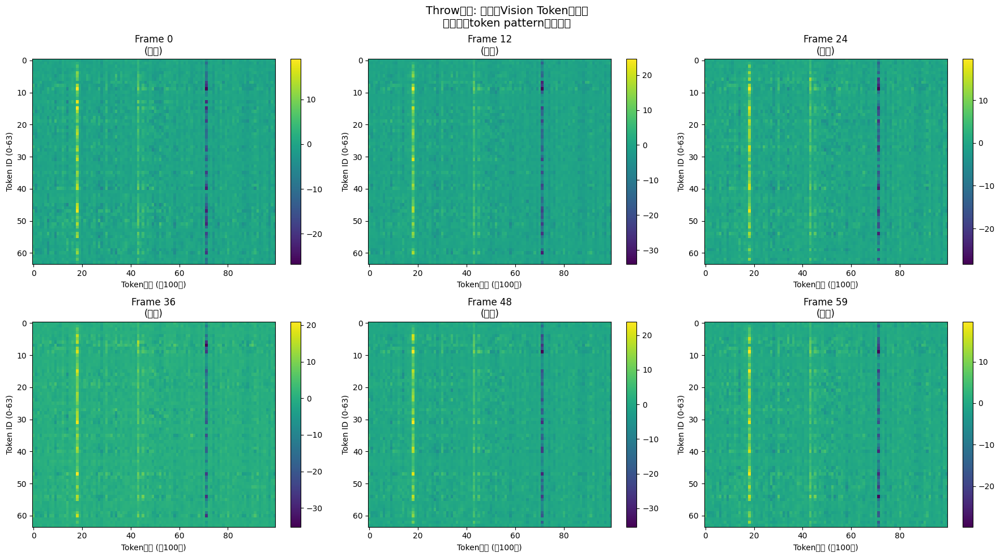

/tmp/ipykernel_7044/2881199572.py:58: UserWarning: Glyph 21160 (\N{CJK UNIFIED IDEOGRAPH-52A8}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_7044/2881199572.py:58: UserWarning: Glyph 20316 (\N{CJK UNIFIED IDEOGRAPH-4F5C}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_7044/2881199572.py:58: UserWarning: Glyph 24103 (\N{CJK UNIFIED IDEOGRAPH-5E27}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_7044/2881199572.py:58: UserWarning: Glyph 38388 (\N{CJK UNIFIED IDEOGRAPH-95F4}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_7044/2881199572.py:58: UserWarning: Glyph 30456 (\N{CJK UNIFIED IDEOGRAPH-76F8}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_7044/2881199572.py:58: UserWarning: Glyph 20284 (\N{CJK UNIFIED IDEOGRAPH-4F3C}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_7044/2881199572.py:58: UserWarning: Glyph 24230 (\N{CJK UNIFIED IDEOGRAPH-5EA6}

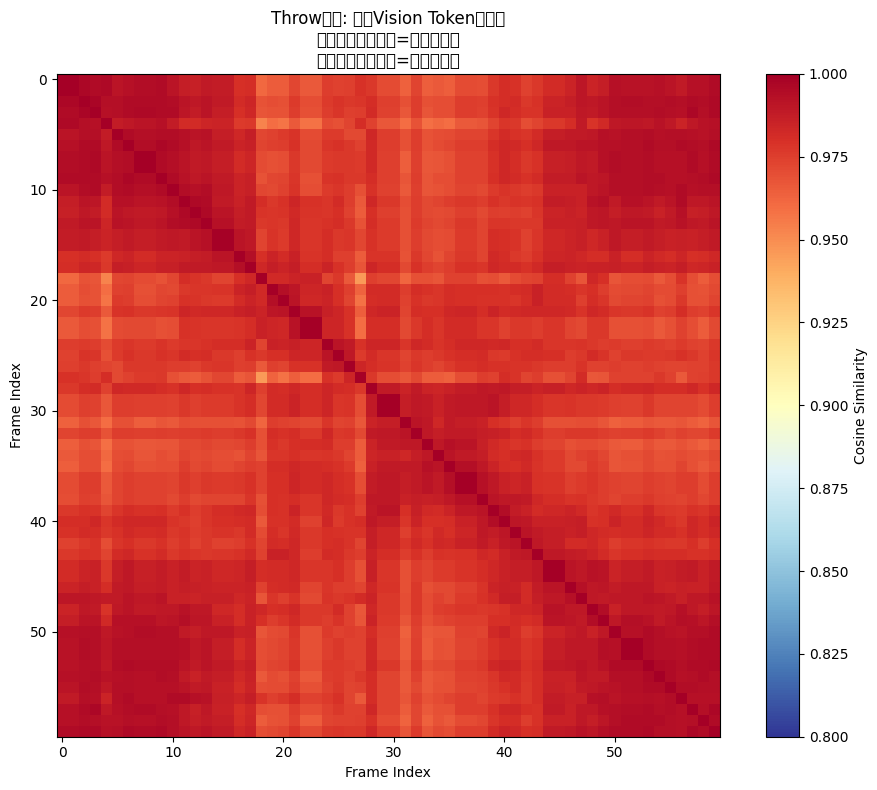

/tmp/ipykernel_7044/2881199572.py:84: UserWarning: Glyph 24320 (\N{CJK UNIFIED IDEOGRAPH-5F00}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_7044/2881199572.py:84: UserWarning: Glyph 22987 (\N{CJK UNIFIED IDEOGRAPH-59CB}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_7044/2881199572.py:84: UserWarning: Glyph 32467 (\N{CJK UNIFIED IDEOGRAPH-7ED3}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_7044/2881199572.py:84: UserWarning: Glyph 26463 (\N{CJK UNIFIED IDEOGRAPH-675F}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_7044/2881199572.py:84: UserWarning: Glyph 19981 (\N{CJK UNIFIED IDEOGRAPH-4E0D}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_7044/2881199572.py:84: UserWarning: Glyph 21516 (\N{CJK UNIFIED IDEOGRAPH-540C}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_7044/2881199572.py:84: UserWarning: Glyph 21160 (\N{CJK UNIFIED IDEOGRAPH-52A8}

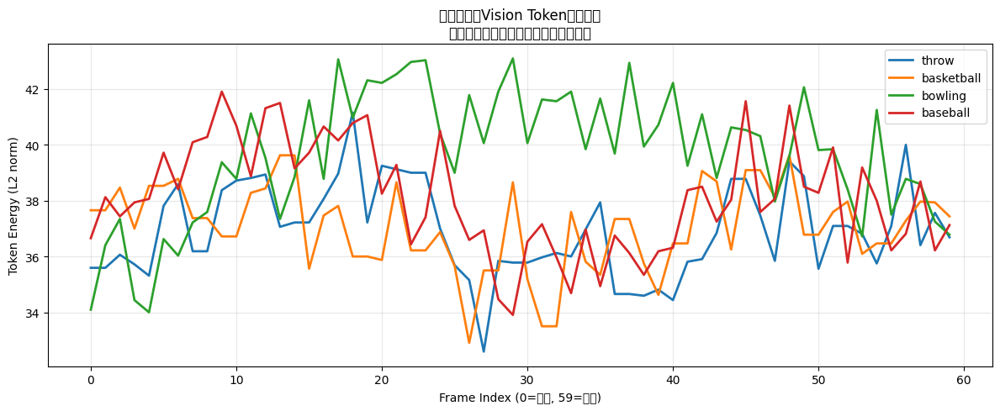

✅ 可视化完成


In [ ]:
# Step 3.5: 可视化Vision Tokens

import matplotlib.pyplot as plt
import numpy as np

# 取一个视频的tokens
sample_key = (5, 1, 1)  # throw动作
tokens = vision_cache[sample_key]  # (60, 64, 2048)
print(f"视频 a5_s1_t1 (throw)")
print(f"Tokens shape: {tokens.shape}")
print(f"  60帧, 每帧64个tokens, 每个token 2048维")

# ── 1. Token值的统计 ──
print(f"\n数值统计:")
print(f"  mean: {tokens.mean():.4f}")
print(f"  std:  {tokens.std():.4f}")
print(f"  min:  {tokens.min():.4f}")
print(f"  max:  {tokens.max():.4f}")

# ── 2. 可视化：每帧的token特征热力图 ──
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# 选6个关键帧
frame_indices = [0, 12, 24, 36, 48, 59]
frame_names = ['Frame 0\n(开始)', 'Frame 12\n(准备)', 'Frame 24\n(加速)',
               'Frame 36\n(冲击)', 'Frame 48\n(跟随)', 'Frame 59\n(结束)']

for idx, (fi, name) in enumerate(zip(frame_indices, frame_names)):
    ax = axes[idx//3][idx%3]
    # 取前100维展示 (64 tokens × 100 dims)
    frame_tokens = tokens[fi, :, :100].numpy()
    im = ax.imshow(frame_tokens, aspect='auto', cmap='viridis')
    ax.set_title(name, fontsize=12)
    ax.set_xlabel('Token维度 (前100维)')
    ax.set_ylabel('Token ID (0-63)')
    plt.colorbar(im, ax=ax)

plt.suptitle('Throw动作: 各帧的Vision Token热力图\n'
             '不同帧的token pattern应该不同', fontsize=14)
plt.tight_layout()
plt.savefig('vision_tokens_heatmap.png', dpi=150)
plt.show()

# ── 3. 帧间token相似度 ──
# 每帧mean pool成一个向量，然后算帧间余弦相似度
frame_means = tokens.mean(dim=1)  # (60, 2048)
frame_norms = frame_means / frame_means.norm(dim=1, keepdim=True)
similarity = (frame_norms @ frame_norms.T).numpy()  # (60, 60)

plt.figure(figsize=(10, 8))
plt.imshow(similarity, cmap='RdYlBu_r', vmin=0.8, vmax=1.0)
plt.colorbar(label='Cosine Similarity')
plt.xlabel('Frame Index')
plt.ylabel('Frame Index')
plt.title('Throw动作: 帧间Vision Token相似度\n'
          '对角线附近高相似=相邻帧相似\n'
          '远离对角线低相似=动作变化大')
plt.tight_layout()
plt.savefig('frame_similarity.png', dpi=150)
plt.show()

# ── 4. 不同动作的token对比 ──
actions_to_compare = {
    (5,1,1): 'throw',
    (7,1,1): 'basketball',
    (12,1,1): 'bowling',
    (14,1,1): 'baseball',
}

plt.figure(figsize=(12, 5))
for key, name in actions_to_compare.items():
    if key in vision_cache:
        t = vision_cache[key]
        # 每帧的token magnitude变化
        frame_energy = t.mean(dim=1).norm(dim=1).numpy()  # (60,)
        plt.plot(frame_energy, label=name, linewidth=2)

plt.xlabel('Frame Index (0=开始, 59=结束)')
plt.ylabel('Token Energy (L2 norm)')
plt.title('不同动作的Vision Token能量变化\n'
          '能量变化反映动作的视觉变化剧烈程度')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('token_energy_comparison.png', dpi=150)
plt.show()

print("✅ 可视化完成")

#Step4 Visualization of Tokens

Step 4: Vision Token Visualization (English)
Video a5_s1_t1 (throw)
  Tokens shape: torch.Size([60, 64, 2048])
  mean=-0.0153, std=1.4629
  min=-42.1562, max=27.8438


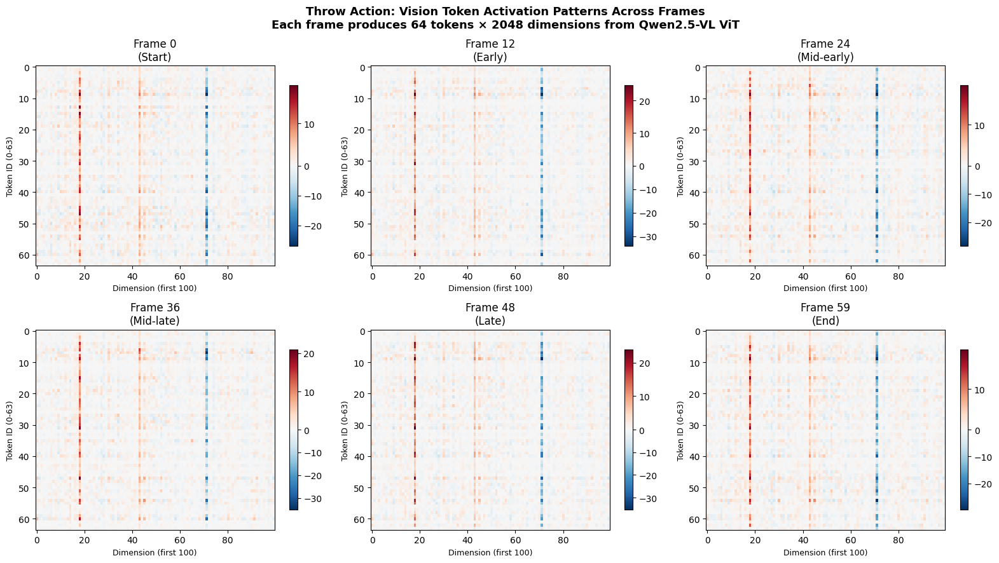

✅ Saved: fig_token_heatmap.png


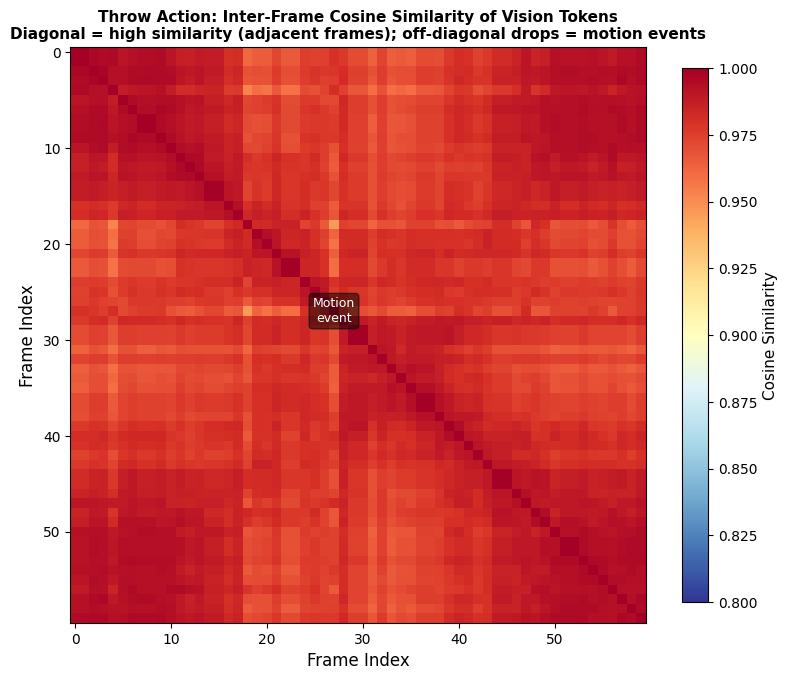

✅ Saved: fig_frame_similarity.png


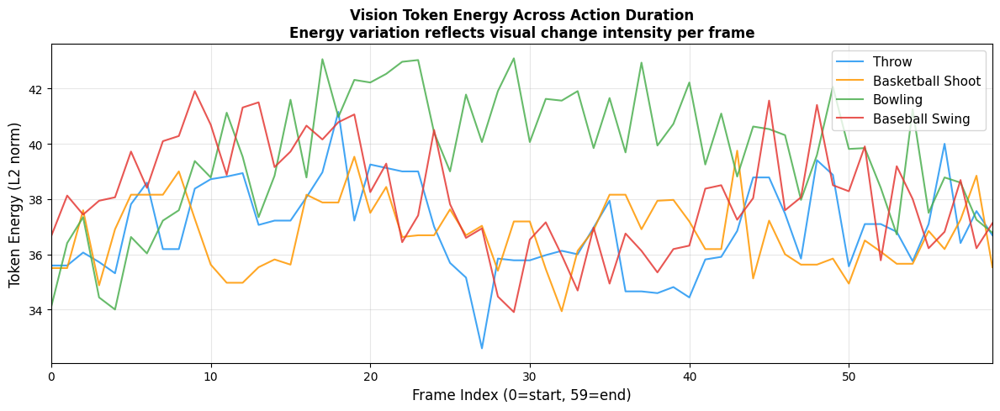

✅ Saved: fig_token_energy.png

✅ Step 4 完成: 3张可视化已保存
   fig_token_heatmap.png    → 报告Figure X
   fig_frame_similarity.png → 报告Figure X
   fig_token_energy.png     → 报告Figure X
   全部英文标签，可直接用于NeurIPS格式报告


In [ ]:
# ============================================================
# Step 4: Vision Token可视化 (English版，报告可用)
# 目的: 理解Qwen ViT tokens的特征质量
# 输入: vision_tokens_qwen25.pt
# 输出: 3张图 → 可直接放进NeurIPS报告
# ============================================================

import torch
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

# ── 加载tokens ──
print("Step 4: Vision Token Visualization (English)")
vision_cache = torch.load(
    "/content/drive/MyDrive/utd_mhad/vision_tokens_qwen25.pt",
    map_location='cpu', weights_only=False)

# 选一个throw视频
key = (5, 1, 1)  # a5_s1_t1 = throw
tokens = vision_cache[key]  # (60, 64, 2048)
print(f"Video a5_s1_t1 (throw)")
print(f"  Tokens shape: {tokens.shape}")
print(f"  mean={tokens.mean():.4f}, std={tokens.std():.4f}")
print(f"  min={tokens.min():.4f}, max={tokens.max():.4f}")

# ============================================================
# 图1: Token Activation Heatmap (6 key frames)
# ============================================================
fig, axes = plt.subplots(2, 3, figsize=(16, 9))
frame_indices = [0, 12, 24, 36, 48, 59]
frame_labels = [
    'Frame 0\n(Start)', 'Frame 12\n(Early)', 'Frame 24\n(Mid-early)',
    'Frame 36\n(Mid-late)', 'Frame 48\n(Late)', 'Frame 59\n(End)'
]

for i, (fi, label) in enumerate(zip(frame_indices, frame_labels)):
    ax = axes[i // 3, i % 3]
    data = tokens[fi].numpy()  # (64, 2048)
    # 只显示前100个维度，更清晰
    im = ax.imshow(data[:, :100], aspect='auto', cmap='RdBu_r',
                   norm=TwoSlopeNorm(vmin=data[:,:100].min(), vcenter=0,
                                     vmax=data[:,:100].max()))
    ax.set_title(label, fontsize=12)
    ax.set_ylabel('Token ID (0-63)', fontsize=9)
    ax.set_xlabel('Dimension (first 100)', fontsize=9)
    plt.colorbar(im, ax=ax, shrink=0.8)

fig.suptitle('Throw Action: Vision Token Activation Patterns Across Frames\n'
             'Each frame produces 64 tokens × 2048 dimensions from Qwen2.5-VL ViT',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('fig_token_heatmap.png', dpi=200, bbox_inches='tight')
plt.show()
print("✅ Saved: fig_token_heatmap.png")

# ============================================================
# 图2: Frame-to-Frame Cosine Similarity Matrix
# ============================================================
fig, ax = plt.subplots(figsize=(8, 7))

# 每帧: mean over 64 tokens → (60, 2048), 然后计算cosine similarity
frame_feats = tokens.mean(dim=1)  # (60, 2048)
norms = frame_feats.norm(dim=1, keepdim=True)
frame_feats_normed = frame_feats / norms
sim_matrix = (frame_feats_normed @ frame_feats_normed.T).numpy()

im = ax.imshow(sim_matrix, cmap='RdYlBu_r', vmin=0.80, vmax=1.0)
ax.set_xlabel('Frame Index', fontsize=12)
ax.set_ylabel('Frame Index', fontsize=12)
ax.set_title('Throw Action: Inter-Frame Cosine Similarity of Vision Tokens\n'
             'Diagonal = high similarity (adjacent frames); off-diagonal drops = motion events',
             fontsize=11, fontweight='bold')
cbar = plt.colorbar(im, ax=ax, shrink=0.85)
cbar.set_label('Cosine Similarity', fontsize=11)

# 标注动作区域
ax.annotate('Motion\nevent', xy=(27, 27), fontsize=9, color='white',
            ha='center', va='center',
            bbox=dict(boxstyle='round,pad=0.3', facecolor='black', alpha=0.5))

plt.tight_layout()
plt.savefig('fig_frame_similarity.png', dpi=200, bbox_inches='tight')
plt.show()
print("✅ Saved: fig_frame_similarity.png")

# ============================================================
# 图3: Token Energy (L2 norm) Across Frames for Different Actions
# ============================================================
fig, ax = plt.subplots(figsize=(12, 5))

action_names = {
    (5,1,1): 'Throw', (6,1,1): 'Basketball Shoot',
    (12,1,1): 'Bowling', (14,1,1): 'Baseball Swing'
}
colors = ['#2196F3', '#FF9800', '#4CAF50', '#E53935']

for (key, name), color in zip(action_names.items(), colors):
    if key not in vision_cache:
        # 尝试其他subject
        for s in range(1, 9):
            alt_key = (key[0], s, 1)
            if alt_key in vision_cache:
                key = alt_key
                break

    if key in vision_cache:
        t = vision_cache[key]  # (60, 64, 2048)
        energy = t.mean(dim=1).norm(dim=1).numpy()  # (60,)
        ax.plot(range(60), energy, label=name, color=color, linewidth=1.5, alpha=0.85)

ax.set_xlabel('Frame Index (0=start, 59=end)', fontsize=12)
ax.set_ylabel('Token Energy (L2 norm)', fontsize=12)
ax.set_title('Vision Token Energy Across Action Duration\n'
             'Energy variation reflects visual change intensity per frame',
             fontsize=12, fontweight='bold')
ax.legend(fontsize=11, loc='upper right')
ax.grid(True, alpha=0.3)
ax.set_xlim(0, 59)

plt.tight_layout()
plt.savefig('fig_token_energy.png', dpi=200, bbox_inches='tight')
plt.show()
print("✅ Saved: fig_token_energy.png")

print(f"\n{'='*50}")
print("✅ Step 4 完成: 3张可视化已保存")
print("   fig_token_heatmap.png    → 报告Figure X")
print("   fig_frame_similarity.png → 报告Figure X")
print("   fig_token_energy.png     → 报告Figure X")
print("   全部英文标签，可直接用于NeurIPS格式报告")

Loaded key: (5, 1, 1)
Token shape: T=60, N=64, D=2048
Mean=-0.0153, Std=1.4629
Min=-42.1562, Max=27.8438
Saved PDF: ./pogmoe_figures/figure1_pogmoe_token_snapshots_onerow.pdf
Saved SVG: ./pogmoe_figures/figure1_pogmoe_token_snapshots_onerow.svg
Saved PNG: ./pogmoe_figures/figure1_pogmoe_token_snapshots_onerow.png


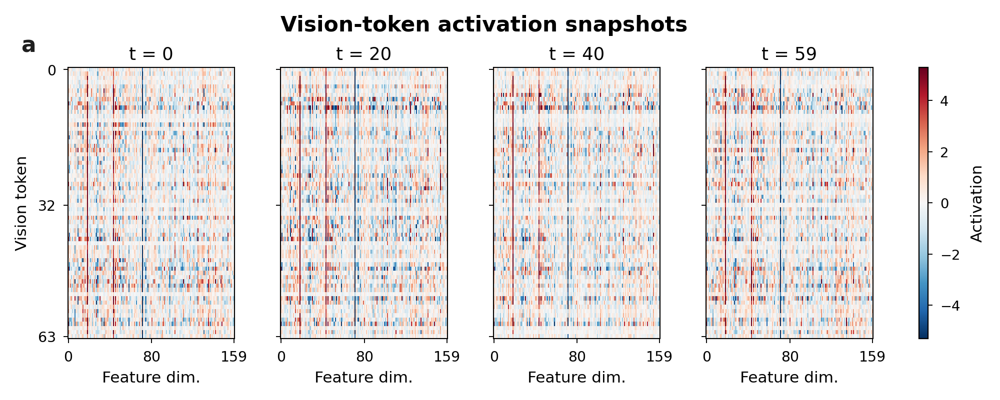

Saved PDF: ./pogmoe_figures/figure2_pogmoe_representation_dynamics.pdf
Saved SVG: ./pogmoe_figures/figure2_pogmoe_representation_dynamics.svg
Saved PNG: ./pogmoe_figures/figure2_pogmoe_representation_dynamics.png


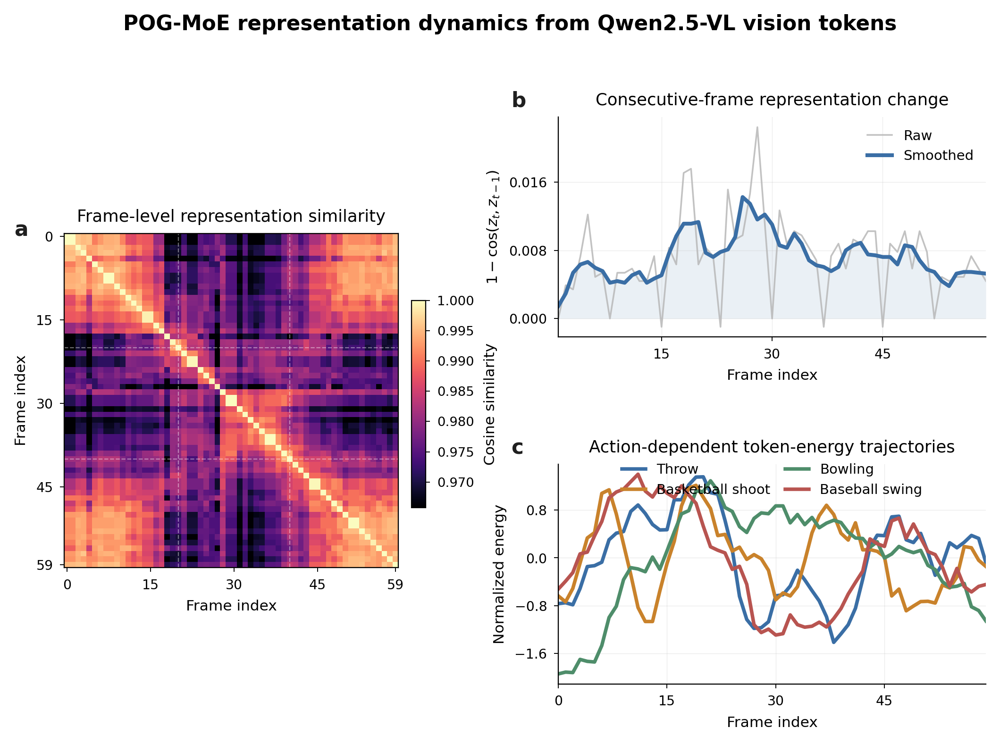


Finished POG-MoE visualization.
Figures saved to: ./pogmoe_figures


In [ ]:
# ============================================================
# POG-MoE Vision Token Analysis
# NeurIPS / Nature / AI-paper style
#
# Scheme A:
#   Figure 1: Vision token activation snapshots
#   Figure 2: Representation dynamics analysis
#
# Input:
#   vision_tokens_qwen25.pt
#
# Output:
#   figure1_pogmoe_token_snapshots.pdf / svg / png
#   figure2_pogmoe_representation_dynamics.pdf / svg / png
# ============================================================

import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from matplotlib.ticker import MaxNLocator
from mpl_toolkits.axes_grid1.inset_locator import inset_axes


# ============================================================
# Output directory
# ============================================================

OUT_DIR = "./pogmoe_figures"
os.makedirs(OUT_DIR, exist_ok=True)


# ============================================================
# Global publication style
# ============================================================

plt.rcParams.update({
    "font.family": "DejaVu Sans",

    # Smaller, cleaner paper typography
    "font.size": 7.5,
    "axes.titlesize": 8.5,
    "axes.labelsize": 7.5,
    "xtick.labelsize": 6.8,
    "ytick.labelsize": 6.8,
    "legend.fontsize": 7.0,

    # Thin lines
    "axes.linewidth": 0.55,
    "xtick.major.width": 0.45,
    "ytick.major.width": 0.45,
    "xtick.major.size": 2.2,
    "ytick.major.size": 2.2,

    # Vector-safe fonts
    "pdf.fonttype": 42,
    "ps.fonttype": 42,
    "svg.fonttype": "none",

    # High-res raster backup
    "figure.dpi": 300,
    "savefig.dpi": 600,
})


# ============================================================
# Color palette
# ============================================================

COLORS = {
    "blue":   "#3A6EA5",
    "orange": "#C9822B",
    "green":  "#4E8D6A",
    "red":    "#B85450",
    "gray":   "#6C6C6C",
    "lightgray": "#B8B8B8",
    "dark":   "#1F1F1F",
}

LINE_COLORS = [
    COLORS["blue"],
    COLORS["orange"],
    COLORS["green"],
    COLORS["red"],
]


# ============================================================
# Utility functions
# ============================================================

def save_figure(fig, name):
    """Save one figure in vector and high-res raster formats."""
    pdf_path = os.path.join(OUT_DIR, f"{name}.pdf")
    svg_path = os.path.join(OUT_DIR, f"{name}.svg")
    png_path = os.path.join(OUT_DIR, f"{name}.png")

    fig.savefig(pdf_path, bbox_inches="tight", pad_inches=0.04)
    fig.savefig(svg_path, bbox_inches="tight", pad_inches=0.04)
    fig.savefig(png_path, dpi=600, bbox_inches="tight", pad_inches=0.04)

    print(f"Saved PDF: {pdf_path}")
    print(f"Saved SVG: {svg_path}")
    print(f"Saved PNG: {png_path}")


def clean_axis(ax):
    """Minimal paper-style axis."""
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.tick_params(direction="out")


def panel_label(ax, label, x=-0.10, y=1.08):
    """Add panel label such as a, b, c."""
    ax.text(
        x, y, label,
        transform=ax.transAxes,
        fontsize=10.5,
        fontweight="bold",
        ha="left",
        va="top",
        color=COLORS["dark"]
    )


def smooth_curve(x, window=5):
    """Simple moving average smoothing."""
    if window <= 1:
        return x

    pad = window // 2
    x_pad = np.pad(x, (pad, pad), mode="edge")
    kernel = np.ones(window) / window
    return np.convolve(x_pad, kernel, mode="valid")


def get_existing_key(vision_cache, action_id, trial=1, max_subject=8):
    """Find an available subject key for a given action."""
    for subject in range(1, max_subject + 1):
        key = (action_id, subject, trial)
        if key in vision_cache:
            return key
    return None


# ============================================================
# Load vision tokens
# ============================================================

vision_cache = torch.load(
    "/content/drive/MyDrive/utd_mhad/vision_tokens_qwen25.pt",
    map_location="cpu",
    weights_only=False
)

main_key = (5, 1, 1)  # Throw
tokens = vision_cache[main_key]  # (60, 64, 2048)

T, N, D = tokens.shape

print(f"Loaded key: {main_key}")
print(f"Token shape: T={T}, N={N}, D={D}")
print(f"Mean={tokens.mean():.4f}, Std={tokens.std():.4f}")
print(f"Min={tokens.min():.4f}, Max={tokens.max():.4f}")


# ============================================================
# Shared pre-computation
# ============================================================

# Frame-level representation by mean pooling over vision tokens
frame_feats = tokens.mean(dim=1)  # (T, D)
frame_feats = frame_feats / (frame_feats.norm(dim=1, keepdim=True) + 1e-8)

# Frame-to-frame cosine similarity matrix
sim_matrix = (frame_feats @ frame_feats.T).numpy()
sim_vmin = np.percentile(sim_matrix, 3)
sim_vmax = np.percentile(sim_matrix, 99.5)

# Consecutive-frame representation change
temporal_delta = []
for i in range(1, T):
    cos = torch.nn.functional.cosine_similarity(
        frame_feats[i].unsqueeze(0),
        frame_feats[i - 1].unsqueeze(0)
    )
    temporal_delta.append(1 - cos.item())

temporal_delta = np.array(temporal_delta)
temporal_delta_smooth = smooth_curve(temporal_delta, window=5)

# Action-dependent token energy
actions = [
    (5,  "Throw"),
    (6,  "Basketball shoot"),
    (12, "Bowling"),
    (14, "Baseball swing"),
]

energy_curves = []

for action_id, action_name in actions:
    key = get_existing_key(vision_cache, action_id)

    if key is None:
        print(f"Warning: action {action_id} not found.")
        continue

    t = vision_cache[key]  # (T, N, D)

    frame_repr = t.mean(dim=1)
    energy = frame_repr.norm(dim=1).numpy()

    # Normalize within each sequence for shape comparison
    energy = (energy - energy.mean()) / (energy.std() + 1e-8)
    energy = smooth_curve(energy, window=5)

    energy_curves.append((action_name, energy))


# ============================================================
# Figure 1: Token activation snapshots
# ============================================================


def make_figure_1_token_snapshots():
    """
    Figure 1:
    Standalone one-row token activation snapshots.
    Keep the real token-feature aspect ratio: 64 tokens × 160 feature dimensions.
    """

    frame_indices = [0, 20, 40, 59]
    dim_end = 160

    selected = torch.stack(
        [tokens[i, :, :dim_end] for i in frame_indices],
        dim=0
    ).numpy()

    vmax = np.percentile(np.abs(selected), 98.5)
    norm = TwoSlopeNorm(vmin=-vmax, vcenter=0.0, vmax=vmax)

    fig = plt.figure(figsize=(7.4, 2.35), facecolor="white")

    gs = fig.add_gridspec(
        nrows=1,
        ncols=5,
        width_ratios=[1, 1, 1, 1, 0.055],
        wspace=0.34
    )

    axes = [fig.add_subplot(gs[0, i]) for i in range(4)]
    cax = fig.add_subplot(gs[0, 4])

    for idx, (ax, fi) in enumerate(zip(axes, frame_indices)):
        data = tokens[fi, :, :dim_end].numpy()

        im = ax.imshow(
            data,
            aspect="auto",
            cmap="RdBu_r",
            norm=norm,
            interpolation="nearest",
            rasterized=True
        )

        ax.set_title(f"t = {fi}", pad=4, fontsize=8.5)

        ax.set_xticks([0, 80, 159])
        ax.set_yticks([0, 32, 63])

        ax.set_xlabel("Feature dim.", labelpad=3)

        if idx == 0:
            ax.set_ylabel("Vision token", labelpad=4)
            ax.text(
                -0.28, 1.12,
                "a",
                transform=ax.transAxes,
                fontsize=10.5,
                fontweight="bold",
                ha="left",
                va="top",
                color=COLORS["dark"]
            )
        else:
            ax.set_yticklabels([])

        for spine in ax.spines.values():
            spine.set_linewidth(0.5)

    cb = fig.colorbar(im, cax=cax)
    cb.set_label("Activation", labelpad=5)
    cb.ax.tick_params(labelsize=6.6, width=0.45, length=2.2)

    fig.suptitle(
        "Vision-token activation snapshots",
        y=1.03,
        fontsize=10.2,
        fontweight="bold"
    )

    save_figure(fig, "figure1_pogmoe_token_snapshots_onerow")
    plt.show()


# ============================================================
# Figure 2: Representation dynamics
# ============================================================

def make_figure_2_representation_dynamics():
    """
    Figure 2:
    Representation dynamics analysis.
    Contains:
      a. frame-level cosine similarity matrix
      b. consecutive-frame representation change
      c. action-dependent token-energy trajectories
    """

    fig = plt.figure(figsize=(8.4, 5.2), facecolor="white")

    outer = fig.add_gridspec(
        nrows=2,
        ncols=2,
        width_ratios=[1.0, 1.28],
        height_ratios=[1, 1],
        wspace=0.42,
        hspace=0.58
    )

    # --------------------------------------------------------
    # Panel a: temporal similarity matrix
    # --------------------------------------------------------
    ax_a = fig.add_subplot(outer[:, 0])

    im = ax_a.imshow(
        sim_matrix,
        cmap="magma",
        vmin=sim_vmin,
        vmax=sim_vmax,
        interpolation="nearest",
        rasterized=True
    )

    ax_a.set_title("Frame-level representation similarity", pad=6)
    ax_a.set_xlabel("Frame index", labelpad=4)
    ax_a.set_ylabel("Frame index", labelpad=4)

    ax_a.set_xticks([0, 15, 30, 45, 59])
    ax_a.set_yticks([0, 15, 30, 45, 59])

    # Subtle phase guides
    for boundary in [20, 40]:
        ax_a.axvline(
            boundary,
            color="white",
            linewidth=0.55,
            linestyle="--",
            alpha=0.42
        )
        ax_a.axhline(
            boundary,
            color="white",
            linewidth=0.55,
            linestyle="--",
            alpha=0.42
        )

    panel_label(ax_a, "a", x=-0.15, y=1.04)

    # Colorbar inside the similarity panel, not between panels
    cax = inset_axes(
        ax_a,
        width="4.2%",
        height="62%",
        loc="lower left",
        bbox_to_anchor=(1.04, 0.18, 1, 1),
        bbox_transform=ax_a.transAxes,
        borderpad=0
    )

    cb = fig.colorbar(im, cax=cax)
    cb.set_label("Cosine similarity", labelpad=5)
    cb.ax.tick_params(labelsize=6.6, width=0.45, length=2.2)

    # --------------------------------------------------------
    # Panel b: temporal representation change
    # --------------------------------------------------------
    ax_b = fig.add_subplot(outer[0, 1])

    x_delta = np.arange(1, T)

    ax_b.plot(
        x_delta,
        temporal_delta,
        color=COLORS["lightgray"],
        linewidth=0.85,
        alpha=0.85,
        label="Raw"
    )

    ax_b.plot(
        x_delta,
        temporal_delta_smooth,
        color=COLORS["blue"],
        linewidth=1.95,
        label="Smoothed"
    )

    ax_b.fill_between(
        x_delta,
        temporal_delta_smooth,
        0,
        color=COLORS["blue"],
        alpha=0.10,
        linewidth=0
    )

    ax_b.set_title("Consecutive-frame representation change", pad=6)
    ax_b.set_xlabel("Frame index", labelpad=4)
    ax_b.set_ylabel(r"$1-\cos(z_t,z_{t-1})$", labelpad=4)

    ax_b.set_xlim(1, 59)
    ax_b.xaxis.set_major_locator(MaxNLocator(integer=True, nbins=5))
    ax_b.yaxis.set_major_locator(MaxNLocator(nbins=4))

    ax_b.grid(True, linewidth=0.35, alpha=0.22)
    clean_axis(ax_b)

    ax_b.legend(
        frameon=False,
        loc="upper right",
        handlelength=1.8
    )

    panel_label(ax_b, "b", x=-0.11, y=1.12)

    # --------------------------------------------------------
    # Panel c: action-dependent token energy
    # --------------------------------------------------------
    ax_c = fig.add_subplot(outer[1, 1])

    for idx, (action_name, energy) in enumerate(energy_curves):
        x = np.arange(len(energy))

        ax_c.plot(
            x,
            energy,
            linewidth=1.8,
            color=LINE_COLORS[idx % len(LINE_COLORS)],
            label=action_name
        )

    ax_c.set_title("Action-dependent token-energy trajectories", pad=6)
    ax_c.set_xlabel("Frame index", labelpad=4)
    ax_c.set_ylabel("Normalized energy", labelpad=4)

    ax_c.set_xlim(0, 59)
    ax_c.xaxis.set_major_locator(MaxNLocator(integer=True, nbins=5))
    ax_c.yaxis.set_major_locator(MaxNLocator(nbins=5))

    ax_c.grid(True, linewidth=0.35, alpha=0.22)
    clean_axis(ax_c)

    ax_c.legend(
        frameon=False,
        ncol=2,
        loc="upper center",
        bbox_to_anchor=(0.5, 1.06),
        columnspacing=1.1,
        handlelength=1.7
    )

    panel_label(ax_c, "c", x=-0.11, y=1.12)

    fig.suptitle(
        "POG-MoE representation dynamics from Qwen2.5-VL vision tokens",
        y=1.02,
        fontsize=10.5,
        fontweight="bold"
    )

    save_figure(fig, "figure2_pogmoe_representation_dynamics")
    plt.show()


# ============================================================
# Run
# ============================================================

make_figure_1_token_snapshots()
make_figure_2_representation_dynamics()

print("\n" + "=" * 70)
print("Finished POG-MoE visualization.")
print(f"Figures saved to: {OUT_DIR}")
print("=" * 70)

Step 4b: Patch Visualization
Video: a5_s1_t1 (throw)
Tokens shape: torch.Size([60, 64, 2048])
64 tokens = 8×8 patch grid


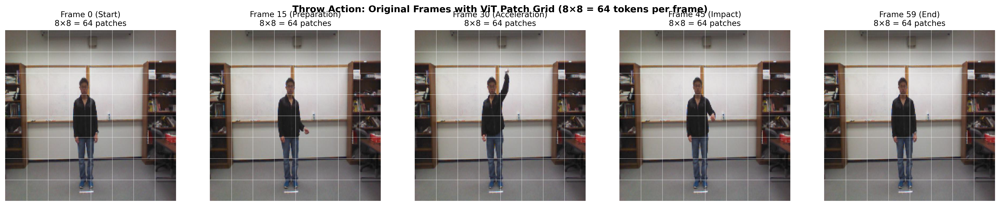

✅ Saved: fig_patch_grid.png


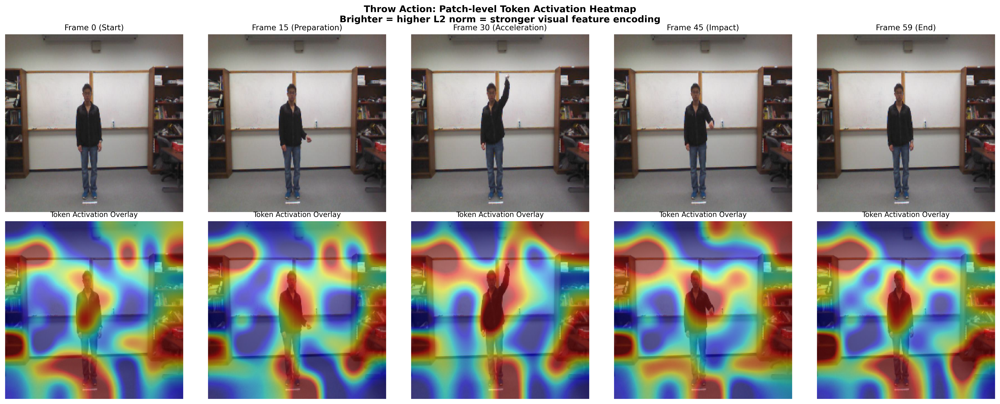

✅ Saved: fig_patch_activation.png


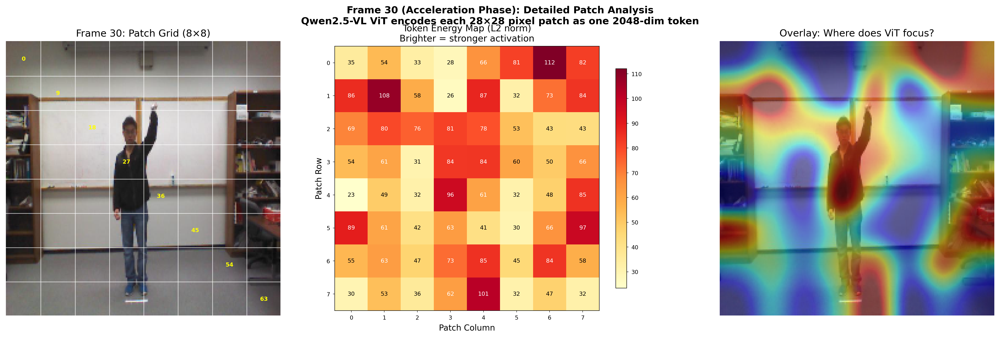

✅ Saved: fig_patch_detail.png

✅ Step 4b 完成: 3张patch可视化已保存
   fig_patch_grid.png       → 展示ViT的patch切分方式
   fig_patch_activation.png → 5帧的激活热力图对比
   fig_patch_detail.png     → 单帧详细分析


In [ ]:
# ============================================================
# Step 4b: Patch可视化 - 展示ViT如何把一帧切成64个patch
# 目的: 理解每个token对应图片哪个区域，哪些区域激活最强
# 输入: 一个视频的原始帧 + 对应的vision tokens
# 输出: 原始帧 + patch网格 + 激活热力图叠加
# ============================================================

import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import cv2
from PIL import Image as PILImage

print("Step 4b: Patch Visualization")
print("="*50)

# ── resize辅助函数 ──
def resize_heatmap(energy_map_8x8, target_size=224):
    """把8×8的energy map放大到224×224"""
    img = PILImage.fromarray(energy_map_8x8.astype(np.float32))
    img = img.resize((target_size, target_size), PILImage.BICUBIC)
    return np.array(img)

# ── 加载vision tokens ──
vision_cache = torch.load(
    "/content/drive/MyDrive/utd_mhad/vision_tokens_qwen25.pt",
    map_location='cpu', weights_only=False)

# ── 读取原始视频帧 ──
DATA_ROOT = "/content/drive/MyDrive/utd_mhad"
import os

def find_video(action, subject, trial):
    fname = f"a{action}_s{subject}_t{trial}_color.avi"
    for part in ['RGB-part1','RGB-part2','RGB-part3','RGB-part4']:
        p = f"{DATA_ROOT}/{part}/{fname}"
        if os.path.exists(p):
            return p
    return None

def get_frame(video_path, frame_idx, total_frames=60):
    """提取视频的指定帧"""
    cap = cv2.VideoCapture(video_path)
    total = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    indices = np.linspace(0, total-1, total_frames, dtype=int)
    target = indices[frame_idx]
    cap.set(cv2.CAP_PROP_POS_FRAMES, target)
    ret, frame = cap.read()
    cap.release()
    if ret:
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        return frame
    return None

# ── 选择throw动作的关键帧 ──
action, subject, trial = 5, 1, 1  # throw
video_path = find_video(action, subject, trial)
tokens = vision_cache[(action, subject, trial)]  # (60, 64, 2048)

frame_indices = [0, 15, 30, 45, 59]
frame_labels = ['Start', 'Preparation', 'Acceleration', 'Impact', 'End']

print(f"Video: a{action}_s{subject}_t{trial} (throw)")
print(f"Tokens shape: {tokens.shape}")
print(f"64 tokens = 8×8 patch grid")

# ============================================================
# 图1: 原始帧 + patch网格叠加
# ============================================================
fig, axes = plt.subplots(1, 5, figsize=(20, 4))

for i, (fi, label) in enumerate(zip(frame_indices, frame_labels)):
    frame = get_frame(video_path, fi)
    if frame is None:
        continue

    ax = axes[i]
    frame_resized = cv2.resize(frame, (224, 224))
    ax.imshow(frame_resized)

    patch_size = 224 // 8
    for row in range(1, 8):
        ax.axhline(y=row * patch_size, color='white', linewidth=0.5, alpha=0.6)
    for col in range(1, 8):
        ax.axvline(x=col * patch_size, color='white', linewidth=0.5, alpha=0.6)

    ax.set_title(f'Frame {fi} ({label})\n8×8 = 64 patches', fontsize=11)
    ax.axis('off')

fig.suptitle('Throw Action: Original Frames with ViT Patch Grid (8×8 = 64 tokens per frame)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('fig_patch_grid.png', dpi=200, bbox_inches='tight')
plt.show()
print("✅ Saved: fig_patch_grid.png")

# ============================================================
# 图2: Patch激活热力图 - 哪些patch区域token激活最强
# ============================================================
fig, axes = plt.subplots(2, 5, figsize=(20, 8))

for i, (fi, label) in enumerate(zip(frame_indices, frame_labels)):
    frame = get_frame(video_path, fi)
    if frame is None:
        continue
    frame_resized = cv2.resize(frame, (224, 224))

    axes[0, i].imshow(frame_resized)
    axes[0, i].set_title(f'Frame {fi} ({label})', fontsize=11)
    axes[0, i].axis('off')

    token_energy = tokens[fi].norm(dim=1).numpy()  # (64,)
    energy_map = token_energy.reshape(8, 8)
    energy_resized = resize_heatmap(energy_map)

    axes[1, i].imshow(frame_resized)
    im = axes[1, i].imshow(energy_resized, cmap='jet', alpha=0.5,
                            vmin=np.percentile(token_energy, 10),
                            vmax=np.percentile(token_energy, 90))
    axes[1, i].set_title(f'Token Activation Overlay', fontsize=10)
    axes[1, i].axis('off')

axes[0, 0].set_ylabel('Original Frame', fontsize=12, fontweight='bold')
axes[1, 0].set_ylabel('Token Energy\nOverlay', fontsize=12, fontweight='bold')

fig.suptitle('Throw Action: Patch-level Token Activation Heatmap\n'
             'Brighter = higher L2 norm = stronger visual feature encoding',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('fig_patch_activation.png', dpi=200, bbox_inches='tight')
plt.show()
print("✅ Saved: fig_patch_activation.png")

# ============================================================
# 图3: 单帧详细展示 - 每个patch的能量值标注
# ============================================================
fig, axes = plt.subplots(1, 3, figsize=(18, 5.5))

fi = 30
frame = get_frame(video_path, fi)
frame_resized = cv2.resize(frame, (224, 224))
token_energy = tokens[fi].norm(dim=1).numpy()
energy_map = token_energy.reshape(8, 8)

# 左: 原始帧 + patch网格
axes[0].imshow(frame_resized)
patch_size = 28
for r in range(1, 8):
    axes[0].axhline(y=r*patch_size, color='white', linewidth=0.8, alpha=0.7)
for c in range(1, 8):
    axes[0].axvline(x=c*patch_size, color='white', linewidth=0.8, alpha=0.7)
for r in range(8):
    for c in range(8):
        pid = r * 8 + c
        if pid % 9 == 0:
            axes[0].text(c*patch_size + patch_size//2, r*patch_size + patch_size//2,
                        f'{pid}', ha='center', va='center', fontsize=7,
                        color='yellow', fontweight='bold')
axes[0].set_title(f'Frame {fi}: Patch Grid (8×8)', fontsize=12)
axes[0].axis('off')

# 中: 能量热力图 (8×8 grid)
im = axes[1].imshow(energy_map, cmap='YlOrRd', interpolation='nearest')
for r in range(8):
    for c in range(8):
        axes[1].text(c, r, f'{energy_map[r,c]:.0f}', ha='center', va='center',
                    fontsize=7, color='black' if energy_map[r,c] < np.median(energy_map) else 'white')
axes[1].set_title(f'Token Energy Map (L2 norm)\nBrighter = stronger activation', fontsize=11)
axes[1].set_xlabel('Patch Column', fontsize=10)
axes[1].set_ylabel('Patch Row', fontsize=10)
plt.colorbar(im, ax=axes[1], shrink=0.8)

# 右: 叠加
energy_resized = resize_heatmap(energy_map)
axes[2].imshow(frame_resized)
axes[2].imshow(energy_resized, cmap='jet', alpha=0.45,
               vmin=np.percentile(token_energy, 5),
               vmax=np.percentile(token_energy, 95))
axes[2].set_title(f'Overlay: Where does ViT focus?', fontsize=12)
axes[2].axis('off')

fig.suptitle(f'Frame {fi} (Acceleration Phase): Detailed Patch Analysis\n'
             f'Qwen2.5-VL ViT encodes each 28×28 pixel patch as one 2048-dim token',
             fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig('fig_patch_detail.png', dpi=200, bbox_inches='tight')
plt.show()
print("✅ Saved: fig_patch_detail.png")

print(f"\n{'='*50}")
print("✅ Step 4b 完成: 3张patch可视化已保存")
print("   fig_patch_grid.png       → 展示ViT的patch切分方式")
print("   fig_patch_activation.png → 5帧的激活热力图对比")
print("   fig_patch_detail.png     → 单帧详细分析")

Step 4e: ViT Patch Anatomy (complete)
Frame 30 of throw (a5_s1_t1)
  Head: patch #19 (row=2, col=3), L2=81.4
  Upper body: patch #27 (row=3, col=3), L2=83.5
  Background: patch #0 (row=0, col=0), L2=35.4


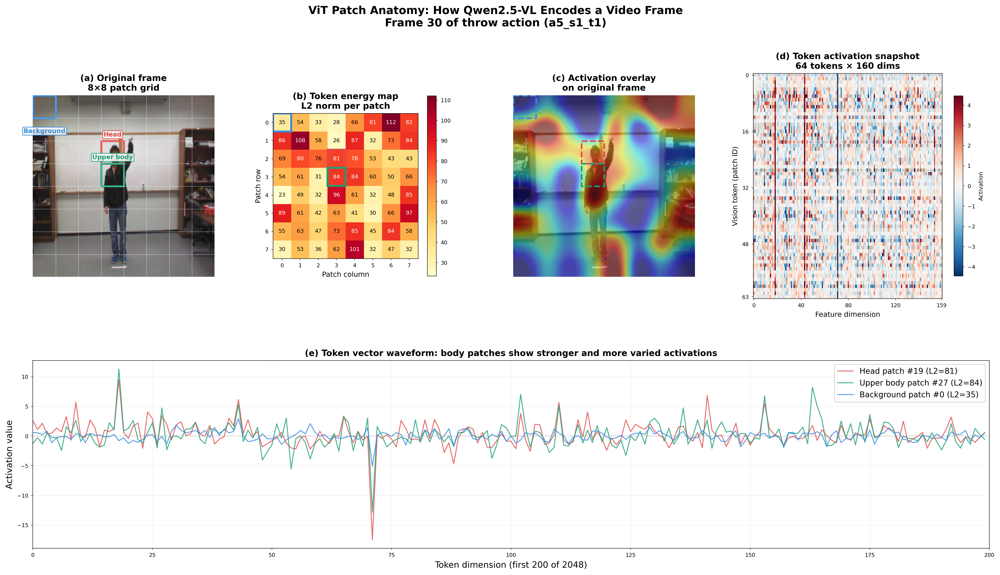

✅ Saved: fig_patch_anatomy_v2.png


In [ ]:
# ============================================================
# Step 4e: ViT Patch Anatomy (完整版)
# 上排: 原始帧+patch网格 | 8×8能量热力图 | 激活叠加 | token噪音图(64×160)
# 下排: 3个patch的token向量line plot对比
# ============================================================

import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.colors import TwoSlopeNorm
import cv2
from PIL import Image as PILImage
import os

print("Step 4e: ViT Patch Anatomy (complete)")
print("="*50)

def resize_heatmap(energy_map_8x8, target_size=224):
    img = PILImage.fromarray(energy_map_8x8.astype(np.float32))
    img = img.resize((target_size, target_size), PILImage.BICUBIC)
    return np.array(img)

vision_cache = torch.load(
    "/content/drive/MyDrive/utd_mhad/vision_tokens_qwen25.pt",
    map_location='cpu', weights_only=False)

DATA_ROOT = "/content/drive/MyDrive/utd_mhad"

def find_video(action, subject, trial):
    fname = f"a{action}_s{subject}_t{trial}_color.avi"
    for part in ['RGB-part1','RGB-part2','RGB-part3','RGB-part4']:
        p = f"{DATA_ROOT}/{part}/{fname}"
        if os.path.exists(p):
            return p
    return None

def get_frame(video_path, frame_idx, total_frames=60):
    cap = cv2.VideoCapture(video_path)
    total = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    indices = np.linspace(0, total-1, total_frames, dtype=int)
    cap.set(cv2.CAP_PROP_POS_FRAMES, indices[frame_idx])
    ret, frame = cap.read()
    cap.release()
    if ret:
        return cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    return None

# ── 数据准备 ──
action, subject, trial = 5, 1, 1  # throw
video_path = find_video(action, subject, trial)
tokens = vision_cache[(action, subject, trial)]  # (60, 64, 2048)
fi = 30  # acceleration phase

frame = get_frame(video_path, fi)
frame_resized = cv2.resize(frame, (224, 224))
frame_tokens = tokens[fi]  # (64, 2048)
token_energy = frame_tokens.norm(dim=1).numpy()  # (64,)
energy_map = token_energy.reshape(8, 8)
patch_size = 28

# ── 手动选人体上的3个patch ──
# 从frame 30的throw动作来看:
# 人站在画面中间偏左, 手举起在上方
# row1 col3 ≈ 头部区域 → patch 11
# row2 col3 ≈ 上身/手臂 → patch 19
# row0 col0 ≈ 左上背景(白墙) → patch 0

patches = [
    (19, 'Head', '#E24B4A'),       # row1, col3
    (27, 'Upper body', '#1D9E75'),  # row2, col3
    (0,  'Background', '#378ADD'),  # row0, col0
]

print(f"Frame {fi} of throw (a5_s1_t1)")
for pid, name, _ in patches:
    r, c = pid // 8, pid % 8
    print(f"  {name}: patch #{pid} (row={r}, col={c}), L2={token_energy[pid]:.1f}")

# ============================================================
# 布局: 2行
# 上排: [原始帧+grid] [8×8热力图] [叠加] [token噪音图64×160]
# 下排: [3个patch的token向量 line plot, 占满宽度]
# ============================================================

fig = plt.figure(figsize=(22, 11))
gs = gridspec.GridSpec(2, 4, height_ratios=[1.2, 1], hspace=0.3, wspace=0.3,
                        width_ratios=[1, 1, 1, 1.3])

# ═══════════════════════════════════════════════
# 上排左: 原始帧 + patch网格 + 3个patch标注
# ═══════════════════════════════════════════════
ax1 = fig.add_subplot(gs[0, 0])
ax1.imshow(frame_resized)

for r in range(1, 8):
    ax1.axhline(y=r*patch_size, color='white', linewidth=0.5, alpha=0.5)
for c in range(1, 8):
    ax1.axvline(x=c*patch_size, color='white', linewidth=0.5, alpha=0.5)

for pid, name, color in patches:
    r, c = pid // 8, pid % 8
    rect = plt.Rectangle((c*patch_size, r*patch_size), patch_size, patch_size,
                          linewidth=2.5, edgecolor=color, facecolor='none')
    ax1.add_patch(rect)
    # 标签放在patch上方或下方
    ty = r*patch_size - 4 if r > 0 else (r+1)*patch_size + 12
    va = 'bottom' if r > 0 else 'top'
    ax1.text(c*patch_size + patch_size//2, ty, f'{name}',
             ha='center', va=va, fontsize=8, color=color, fontweight='bold',
             bbox=dict(boxstyle='round,pad=0.15', facecolor='white', alpha=0.85, edgecolor=color))

ax1.set_title('(a) Original frame\n8×8 patch grid', fontsize=11, fontweight='bold')
ax1.axis('off')

# ═══════════════════════════════════════════════
# 上排中左: 8×8能量热力图
# ═══════════════════════════════════════════════
ax2 = fig.add_subplot(gs[0, 1])
im = ax2.imshow(energy_map, cmap='YlOrRd', interpolation='nearest')

for r in range(8):
    for c in range(8):
        val = energy_map[r, c]
        color_txt = 'white' if val > np.percentile(token_energy, 70) else 'black'
        ax2.text(c, r, f'{val:.0f}', ha='center', va='center', fontsize=7, color=color_txt)

for pid, name, color in patches:
    r, c = pid // 8, pid % 8
    rect = plt.Rectangle((c-0.5, r-0.5), 1, 1, linewidth=2.5,
                          edgecolor=color, facecolor='none')
    ax2.add_patch(rect)

ax2.set_title('(b) Token energy map\nL2 norm per patch', fontsize=11, fontweight='bold')
ax2.set_xlabel('Patch column', fontsize=9)
ax2.set_ylabel('Patch row', fontsize=9)
plt.colorbar(im, ax=ax2, shrink=0.8)

# ═══════════════════════════════════════════════
# 上排中右: 热力图叠加
# ═══════════════════════════════════════════════
ax3 = fig.add_subplot(gs[0, 2])
energy_resized = resize_heatmap(energy_map)
ax3.imshow(frame_resized)
ax3.imshow(energy_resized, cmap='jet', alpha=0.45,
           vmin=np.percentile(token_energy, 5),
           vmax=np.percentile(token_energy, 95))

for pid, name, color in patches:
    r, c = pid // 8, pid % 8
    rect = plt.Rectangle((c*patch_size, r*patch_size), patch_size, patch_size,
                          linewidth=2, edgecolor=color, facecolor='none', linestyle='--')
    ax3.add_patch(rect)

ax3.set_title('(c) Activation overlay\non original frame', fontsize=11, fontweight='bold')
ax3.axis('off')

# ═══════════════════════════════════════════════
# 上排右: Token激活噪音图 (64 tokens × 160 dims)
# ═══════════════════════════════════════════════
ax4 = fig.add_subplot(gs[0, 3])

DIMS_SHOW = 160
token_data = frame_tokens[:, :DIMS_SHOW].numpy()  # (64, 160)
vmax = np.percentile(np.abs(token_data), 98)
norm = TwoSlopeNorm(vmin=-vmax, vcenter=0, vmax=vmax)

im4 = ax4.imshow(token_data, aspect='auto', cmap='RdBu_r', norm=norm,
                  interpolation='nearest')

# 标注3个patch在y轴上的位置
for pid, name, color in patches:
    ax4.annotate(name, xy=(-2, pid), xytext=(-25, pid),
                 fontsize=8, color=color, fontweight='bold', va='center', ha='right',
                 arrowprops=dict(arrowstyle='-', color=color, lw=1.5))
    # 水平线标注
    ax4.axhline(y=pid, color=color, linewidth=1, alpha=0.5, linestyle='--')

ax4.set_title('(d) Token activation snapshot\n64 tokens × 160 dims', fontsize=11, fontweight='bold')
ax4.set_xlabel('Feature dimension', fontsize=9)
ax4.set_ylabel('Vision token (patch ID)', fontsize=9)
ax4.set_yticks([0, 16, 32, 48, 63])
ax4.set_xticks([0, 40, 80, 120, 159])
plt.colorbar(im4, ax=ax4, shrink=0.8, label='Activation')

# ═══════════════════════════════════════════════
# 下排: 3个patch的token向量 line plot
# ═══════════════════════════════════════════════
ax5 = fig.add_subplot(gs[1, :])

dims_plot = 200
x = np.arange(dims_plot)

for pid, name, color in patches:
    vec = frame_tokens[pid, :dims_plot].numpy()
    ax5.plot(x, vec, color=color, alpha=0.8, linewidth=1.2,
             label=f'{name} patch #{pid} (L2={token_energy[pid]:.0f})')

ax5.axhline(y=0, color='gray', linewidth=0.5, alpha=0.5)
ax5.set_xlabel('Token dimension (first 200 of 2048)', fontsize=11)
ax5.set_ylabel('Activation value', fontsize=11)
ax5.set_title('(e) Token vector waveform: body patches show stronger and more varied activations',
              fontsize=11, fontweight='bold')
ax5.legend(fontsize=10, loc='upper right')
ax5.set_xlim(0, dims_plot)
ax5.grid(True, alpha=0.15)

fig.suptitle('ViT Patch Anatomy: How Qwen2.5-VL Encodes a Video Frame\n'
             'Frame 30 of throw action (a5_s1_t1)',
             fontsize=14, fontweight='bold', y=0.99)

plt.savefig('fig_patch_anatomy_v2.png', dpi=200, bbox_inches='tight')
plt.show()
print("✅ Saved: fig_patch_anatomy_v2.png")

Step 4f: ResNet3D Vision Expert Visualization (优化版)
Loaded 861 videos
Model loaded. best_acc = 89.3%

Figure 1: Grad-CAM (layer3, 14×14)...
  Saved: figure1_gradcam (pdf/svg/png)


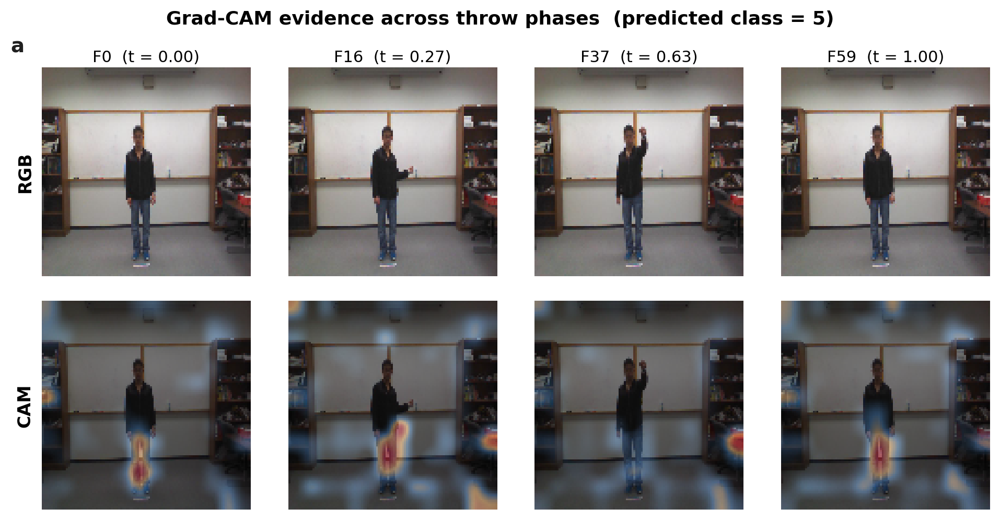


Figure 2: Temporal dynamics...
  Saved: figure2_temporal (pdf/svg/png)


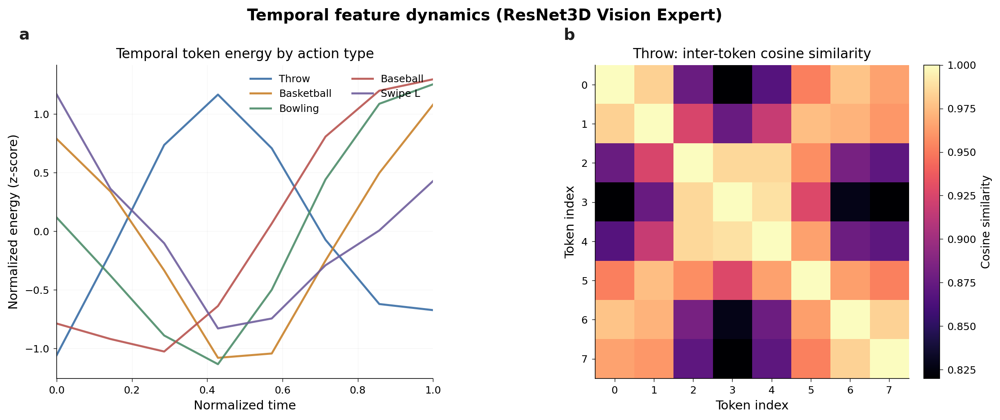


Figure 3: t-SNE... (约1-2分钟)
  200/861
  400/861
  600/861
  800/861
  Feature matrix: (861, 256)


/tmp/ipykernel_7044/1354586546.py:345: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("tab20", 27)


  Saved: figure3_tsne (pdf/svg/png)


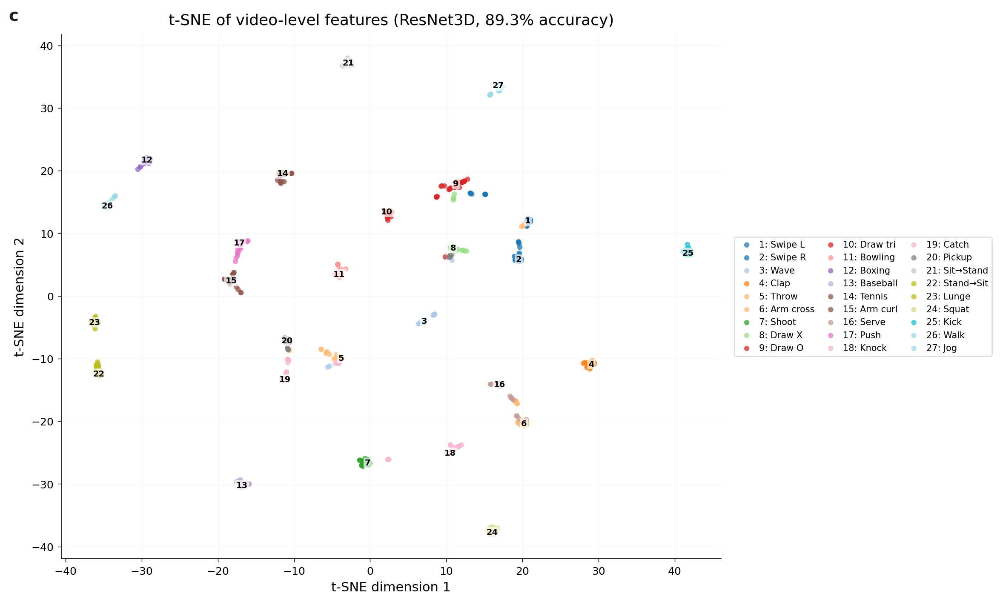


All figures saved to: ./pogmoe_resnet3d_figures


In [ ]:
# ============================================================
# Step 4f: ResNet3D Vision Expert Visualization (优化版)
# 优化: 图更大、文字更清晰、间距更合理、标签不重叠
# ============================================================

import os
import cv2
import torch
import torch.nn as nn
import torchvision
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image as PILImage
from sklearn.manifold import TSNE
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.ticker import MaxNLocator

print("Step 4f: ResNet3D Vision Expert Visualization (优化版)")
print("=" * 60)

DATA_ROOT = "/content/drive/MyDrive/utd_mhad"
OUT_DIR = "./pogmoe_resnet3d_figures"
os.makedirs(OUT_DIR, exist_ok=True)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

plt.rcParams.update({
    "font.family": "DejaVu Sans",
    "font.size": 10,
    "axes.titlesize": 12,
    "axes.labelsize": 11,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "legend.fontsize": 9,
    "axes.linewidth": 0.6,
    "xtick.major.width": 0.5,
    "ytick.major.width": 0.5,
    "xtick.major.size": 3.0,
    "ytick.major.size": 3.0,
    "pdf.fonttype": 42,
    "ps.fonttype": 42,
    "svg.fonttype": "none",
    "figure.dpi": 200,
    "savefig.dpi": 300,
})

COLORS = {
    "blue": "#3A6EA5",
    "orange": "#C9822B",
    "green": "#4E8D6A",
    "red": "#B85450",
    "purple": "#6F5E9C",
    "gray": "#6C6C6C",
    "lightgray": "#B8B8B8",
    "dark": "#1F1F1F",
}

ACTION_COLORS = {
    "Throw": "#3A6EA5",
    "Basketball": "#C9822B",
    "Bowling": "#4E8D6A",
    "Baseball": "#B85450",
    "Swipe L": "#6F5E9C",
}


def save_figure(fig, name):
    for ext in ['pdf', 'svg', 'png']:
        path = os.path.join(OUT_DIR, f"{name}.{ext}")
        dpi = 300 if ext == 'png' else None
        fig.savefig(path, bbox_inches="tight", pad_inches=0.08,
                    dpi=dpi if dpi else 'figure')
    print(f"  Saved: {name} (pdf/svg/png)")


def clean_axis(ax):
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.tick_params(direction="out")


def panel_label(ax, label, x=-0.10, y=1.12):
    ax.text(x, y, label, transform=ax.transAxes,
            fontsize=14, fontweight="bold", ha="left", va="top",
            color=COLORS["dark"])


def smooth_curve(x, window=5):
    if window <= 1:
        return x
    pad = window // 2
    x_pad = np.pad(x, (pad, pad), mode="edge")
    kernel = np.ones(window) / window
    return np.convolve(x_pad, kernel, mode="valid")


def to_uint8_frame(frame):
    frame = frame.detach().cpu().numpy() if torch.is_tensor(frame) else frame
    if frame.max() <= 1.0:
        frame = frame * 255.0
    return np.clip(frame, 0, 255).astype(np.uint8)


gradcam_cmap = LinearSegmentedColormap.from_list(
    "soft_gradcam",
    [(0.0, "#000000"), (0.35, "#3A6EA5"), (0.65, "#F2B56B"), (1.0, "#B2182B")]
)

# ── 加载数据和模型 ──
rgb_data = torch.load(f"{DATA_ROOT}/rgb_frames_112.pt",
                       map_location="cpu", weights_only=False)
print(f"Loaded {len(rgb_data)} videos")


class ResNet3DExpert(nn.Module):
    def __init__(self, d_model=256, num_classes=27, dropout=0.3):
        super().__init__()
        backbone = torchvision.models.video.r3d_18(
            weights=torchvision.models.video.R3D_18_Weights.DEFAULT)
        self.features = nn.Sequential(
            backbone.stem, backbone.layer1, backbone.layer2,
            backbone.layer3, backbone.layer4)
        self.spatial_pool = nn.AdaptiveAvgPool3d((None, 1, 1))
        self.proj = nn.Sequential(
            nn.Linear(512, d_model), nn.GELU(), nn.Dropout(dropout))
        self.cls_token = nn.Parameter(torch.randn(1, 1, d_model) * 0.02)
        self.pos_embed = nn.Parameter(torch.randn(1, 65, d_model) * 0.02)
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model, nhead=8, dim_feedforward=d_model * 4,
            dropout=dropout, activation="gelu", batch_first=True)
        self.temporal_transformer = nn.TransformerEncoder(encoder_layer, num_layers=2)
        self.head = nn.Sequential(
            nn.LayerNorm(d_model), nn.Dropout(dropout), nn.Linear(d_model, num_classes))

    def forward(self, x, return_tokens=False):
        B = x.shape[0]
        feat = self.features(x)
        feat = self.spatial_pool(feat).squeeze(-1).squeeze(-1).permute(0, 2, 1)
        T_out = feat.shape[1]
        feat = self.proj(feat)
        cls = self.cls_token.expand(B, -1, -1)
        feat = torch.cat([cls, feat], dim=1)
        feat = feat + self.pos_embed[:, :T_out + 1, :]
        feat = self.temporal_transformer(feat)
        if return_tokens:
            return feat[:, 1:, :]
        return self.head(feat[:, 0, :])


model = ResNet3DExpert().to(device)
ckpt = torch.load(f"{DATA_ROOT}/resnet3d_vision_expert.pt",
                   map_location=device, weights_only=False)
model.load_state_dict(ckpt["model_state"])
model.eval()
print(f"Model loaded. best_acc = {ckpt['best_acc']:.1%}")


# ============================================================
# Figure 1: Grad-CAM (layer3 = 14×14 更精细)
# ============================================================
def make_figure_1_gradcam():
    print("\nFigure 1: Grad-CAM (layer3, 14×14)...")

    activation, gradient = {}, {}

    def fwd_hook(m, inp, out):
        activation["value"] = out.detach()
    def bwd_hook(m, gi, go):
        gradient["value"] = go[0].detach()

    # layer3 = index 3, 输出14×14
    h1 = model.features[3].register_forward_hook(fwd_hook)
    h2 = model.features[3].register_full_backward_hook(bwd_hook)

    key = (5, 1, 1)
    frames = rgb_data[key].float().permute(3, 0, 1, 2).unsqueeze(0).to(device)
    frames.requires_grad_(True)

    output = model(frames)
    pred_class = output.argmax(dim=1).item()
    model.zero_grad()
    output[0, pred_class].backward()

    grads = gradient["value"]
    acts = activation["value"]
    weights = grads.mean(dim=[2, 3, 4], keepdim=True)
    cam = torch.relu((weights * acts).sum(dim=1, keepdim=True))
    cam = cam.squeeze().detach().cpu().numpy()

    h1.remove()
    h2.remove()

    T_cam = cam.shape[0]
    cam_to_frame = np.linspace(0, 59, T_cam, dtype=int)
    cam_indices = np.linspace(0, T_cam - 1, 4, dtype=int)

    fig, axes = plt.subplots(2, 4, figsize=(12, 5.5))
    fig.subplots_adjust(wspace=0.06, hspace=0.12)

    for i, ci in enumerate(cam_indices):
        fi = cam_to_frame[ci]
        orig = to_uint8_frame(rgb_data[key][fi])

        cam_slice = cam[ci]
        cam_norm = (cam_slice - cam_slice.min()) / (cam_slice.max() - cam_slice.min() + 1e-8)
        cam_resized = np.array(
            PILImage.fromarray(cam_norm.astype(np.float32)).resize((112, 112), PILImage.BICUBIC))

        # 上排: 原始帧
        axes[0, i].imshow(orig)
        axes[0, i].set_title(f'F{fi}  (t = {fi/59:.2f})', fontsize=11, pad=4)
        axes[0, i].axis("off")

        # 下排: Grad-CAM
        axes[1, i].imshow(orig)
        axes[1, i].imshow(cam_resized, cmap=gradcam_cmap, alpha=0.50, vmin=0, vmax=1)
        axes[1, i].axis("off")

    # 行标签
    axes[0, 0].text(-0.08, 0.5, "RGB", transform=axes[0, 0].transAxes,
                     rotation=90, va="center", ha="center",
                     fontsize=12, fontweight="bold")
    axes[1, 0].text(-0.08, 0.5, "CAM", transform=axes[1, 0].transAxes,
                     rotation=90, va="center", ha="center",
                     fontsize=12, fontweight="bold")

    panel_label(axes[0, 0], "a", x=-0.15, y=1.15)

    fig.suptitle(f'Grad-CAM evidence across throw phases  (predicted class = {pred_class+1})',
                 fontsize=13, fontweight="bold", y=0.98)

    save_figure(fig, "figure1_gradcam")
    plt.show()


# ============================================================
# Figure 2: Temporal feature dynamics
# ============================================================
def make_figure_2_temporal():
    print("\nFigure 2: Temporal dynamics...")

    action_list = {5: "Throw", 6: "Basketball", 12: "Bowling",
                   14: "Baseball", 1: "Swipe L"}

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    fig.subplots_adjust(wspace=0.35)

    # ── (a) Temporal energy ──
    ax = axes[0]
    for act, name in action_list.items():
        k = (act, 1, 1)
        if k not in rgb_data:
            continue
        x = rgb_data[k].float().permute(3, 0, 1, 2).unsqueeze(0).to(device)
        with torch.no_grad():
            tok = model(x, return_tokens=True).squeeze().cpu()
        energy = tok.norm(dim=1).numpy()
        energy_norm = (energy - energy.mean()) / (energy.std() + 1e-8)
        energy_smooth = smooth_curve(energy_norm, window=3)
        t_axis = np.linspace(0, 1, len(energy_smooth))
        ax.plot(t_axis, energy_smooth, label=name,
                color=ACTION_COLORS.get(name, COLORS["gray"]),
                linewidth=1.8, alpha=0.9)

    ax.set_title("Temporal token energy by action type", fontsize=12, pad=6)
    ax.set_xlabel("Normalized time")
    ax.set_ylabel("Normalized energy (z-score)")
    ax.set_xlim(0, 1)
    ax.grid(True, linewidth=0.3, alpha=0.2)
    ax.legend(frameon=False, loc="upper right", ncol=2)
    clean_axis(ax)
    panel_label(ax, "a")

    # ── (b) Cosine similarity matrix ──
    ax = axes[1]
    k = (5, 1, 1)
    x = rgb_data[k].float().permute(3, 0, 1, 2).unsqueeze(0).to(device)
    with torch.no_grad():
        tok = model(x, return_tokens=True).squeeze().cpu()
    tok_n = tok / (tok.norm(dim=1, keepdim=True) + 1e-8)
    sim = (tok_n @ tok_n.T).numpy()

    im = ax.imshow(sim, cmap="magma",
                    vmin=np.percentile(sim, 3), vmax=np.percentile(sim, 99.5),
                    interpolation="nearest")
    ax.set_title("Throw: inter-token cosine similarity", fontsize=12, pad=6)
    ax.set_xlabel("Token index")
    ax.set_ylabel("Token index")
    ax.set_aspect("equal")

    cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label("Cosine similarity", fontsize=10)
    cbar.ax.tick_params(labelsize=9)
    clean_axis(ax)
    panel_label(ax, "b")

    fig.suptitle("Temporal feature dynamics (ResNet3D Vision Expert)",
                 fontsize=14, fontweight="bold", y=1.02)

    save_figure(fig, "figure2_temporal")
    plt.show()


# ============================================================
# Figure 3: t-SNE
# ============================================================
def make_figure_3_tsne():
    print("\nFigure 3: t-SNE... (约1-2分钟)")

    features_list, labels_list = [], []
    with torch.no_grad():
        for i, ((action, subject, trial), frames) in enumerate(rgb_data.items()):
            x = frames.float().permute(3, 0, 1, 2).unsqueeze(0).to(device)
            tok = model(x, return_tokens=True).squeeze().cpu()
            features_list.append(tok.mean(dim=0).numpy())
            labels_list.append(action)
            if (i + 1) % 200 == 0:
                print(f"  {i+1}/{len(rgb_data)}")

    features_np = np.array(features_list)
    labels_np = np.array(labels_list)
    print(f"  Feature matrix: {features_np.shape}")

    try:
        tsne = TSNE(n_components=2, perplexity=30, random_state=42,
                     init="pca", learning_rate="auto", max_iter=1000)
    except TypeError:
        tsne = TSNE(n_components=2, perplexity=30, random_state=42,
                     init="pca", learning_rate="auto", n_iter=1000)

    embedded = tsne.fit_transform(features_np)

    action_short = {
        1: "Swipe L", 2: "Swipe R", 3: "Wave", 4: "Clap", 5: "Throw",
        6: "Arm cross", 7: "Shoot", 8: "Draw X", 9: "Draw O",
        10: "Draw tri", 11: "Bowling", 12: "Boxing", 13: "Baseball",
        14: "Tennis", 15: "Arm curl", 16: "Serve", 17: "Push",
        18: "Knock", 19: "Catch", 20: "Pickup", 21: "Sit→Stand",
        22: "Stand→Sit", 23: "Lunge", 24: "Squat", 25: "Kick",
        26: "Walk", 27: "Jog",
    }

    fig, ax = plt.subplots(figsize=(10, 8))
    cmap = plt.cm.get_cmap("tab20", 27)

    for act in range(1, 28):
        mask = labels_np == act
        if mask.sum() == 0:
            continue
        ax.scatter(embedded[mask, 0], embedded[mask, 1],
                   s=20, alpha=0.75, color=cmap(act - 1), edgecolors="none",
                   label=f"{act}: {action_short.get(act, f'A{act}')}")

        # 聚类中心标号
        cx, cy = np.median(embedded[mask, 0]), np.median(embedded[mask, 1])
        ax.text(cx, cy, str(act), fontsize=7, fontweight="bold",
                ha="center", va="center", color="black",
                bbox=dict(boxstyle="round,pad=0.15", facecolor="white",
                          edgecolor="none", alpha=0.7))

    ax.set_title("t-SNE of video-level features (ResNet3D, 89.3% accuracy)",
                 fontsize=13, pad=8)
    ax.set_xlabel("t-SNE dimension 1", fontsize=11)
    ax.set_ylabel("t-SNE dimension 2", fontsize=11)
    ax.grid(True, linewidth=0.3, alpha=0.15)
    clean_axis(ax)

    ax.legend(fontsize=7.5, ncol=3, loc="center left",
              bbox_to_anchor=(1.02, 0.5), borderaxespad=0,
              frameon=True, framealpha=0.9, edgecolor="#ddd",
              handletextpad=0.4, columnspacing=0.8)

    panel_label(ax, "c", x=-0.08, y=1.05)

    save_figure(fig, "figure3_tsne")
    plt.show()


# ============================================================
# Run all
# ============================================================
make_figure_1_gradcam()
make_figure_2_temporal()
make_figure_3_tsne()

print("\n" + "=" * 60)
print(f"All figures saved to: {OUT_DIR}")
print("=" * 60)

Step 4g: ResNet3D Extra Visualizations
Loaded 861 videos
Model loaded.

Figure 4: Multi-action Grad-CAM comparison...
Saved PDF: ./pogmoe_resnet3d_extra_figures/figure4_resnet3d_gradcam_multi_compact.pdf
Saved SVG: ./pogmoe_resnet3d_extra_figures/figure4_resnet3d_gradcam_multi_compact.svg
Saved PNG: ./pogmoe_resnet3d_extra_figures/figure4_resnet3d_gradcam_multi_compact.png


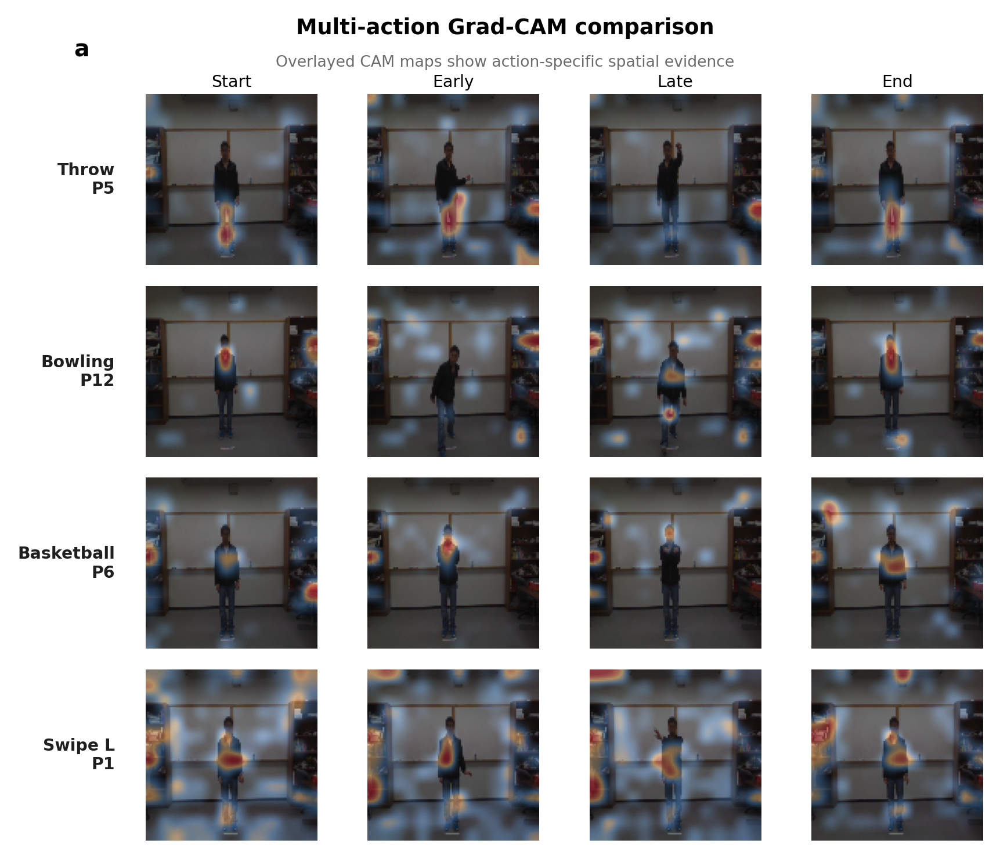


Figure 5: Same action, different subjects...
Saved PDF: ./pogmoe_resnet3d_extra_figures/figure5_resnet3d_subject_consistency_compact.pdf
Saved SVG: ./pogmoe_resnet3d_extra_figures/figure5_resnet3d_subject_consistency_compact.svg
Saved PNG: ./pogmoe_resnet3d_extra_figures/figure5_resnet3d_subject_consistency_compact.png


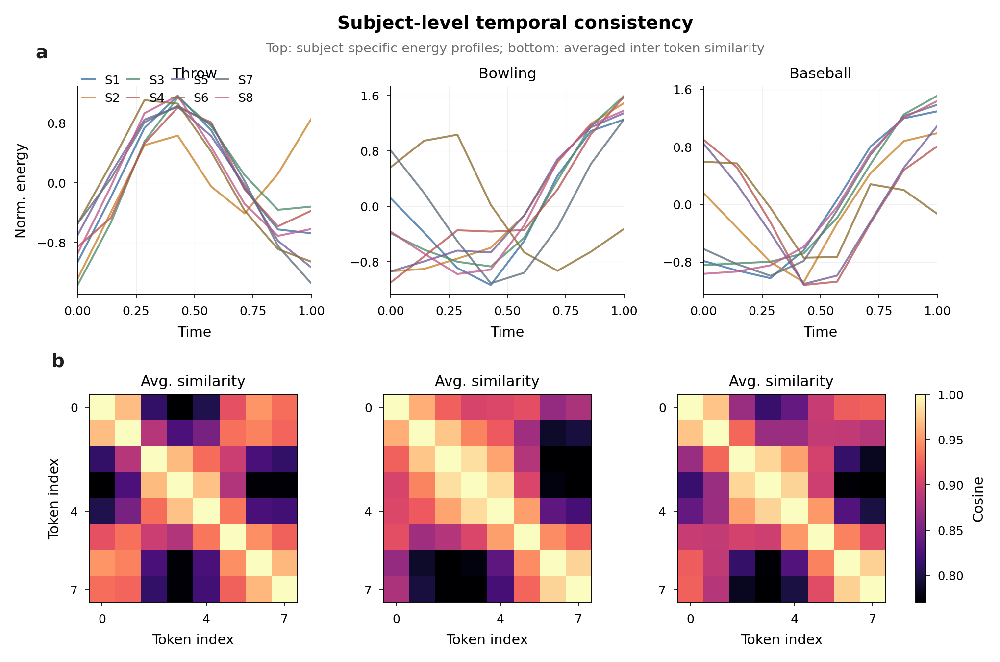


Finished Step 4g: ResNet3D extra visualizations
Figures saved to: ./pogmoe_resnet3d_extra_figures


In [ ]:
# ============================================================
# Step 4g: ResNet3D Extra Visualizations
# Publication-style compact version
#
# Figure 4: Multi-action Grad-CAM comparison
# Figure 5: Subject-level temporal consistency
# ============================================================

import os
import torch
import torch.nn as nn
import torchvision
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image as PILImage
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.ticker import MaxNLocator

print("Step 4g: ResNet3D Extra Visualizations")
print("=" * 60)

DATA_ROOT = "/content/drive/MyDrive/utd_mhad"
OUT_DIR = "./pogmoe_resnet3d_extra_figures"
os.makedirs(OUT_DIR, exist_ok=True)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


# ============================================================
# Compact publication style
# ============================================================

plt.rcParams.update({
    "font.family": "DejaVu Sans",

    "font.size": 6.6,
    "axes.titlesize": 7.2,
    "axes.labelsize": 6.8,
    "xtick.labelsize": 6.0,
    "ytick.labelsize": 6.0,
    "legend.fontsize": 6.0,

    "axes.linewidth": 0.45,
    "xtick.major.width": 0.4,
    "ytick.major.width": 0.4,
    "xtick.major.size": 2.0,
    "ytick.major.size": 2.0,

    "pdf.fonttype": 42,
    "ps.fonttype": 42,
    "svg.fonttype": "none",

    "figure.dpi": 300,
    "savefig.dpi": 600,
})

COLORS = {
    "blue": "#3A6EA5",
    "orange": "#C9822B",
    "green": "#4E8D6A",
    "red": "#B85450",
    "purple": "#6F5E9C",
    "gray": "#6C6C6C",
    "lightgray": "#B8B8B8",
    "dark": "#1F1F1F",
}

SUBJECT_COLORS = {
    1: "#3A6EA5",
    2: "#C9822B",
    3: "#4E8D6A",
    4: "#B85450",
    5: "#6F5E9C",
    6: "#8C6D31",
    7: "#5F6F7A",
    8: "#C05A8A",
}

# Softer than jet, more paper-like
gradcam_cmap = LinearSegmentedColormap.from_list(
    "soft_gradcam",
    [
        (0.00, "#000000"),
        (0.35, "#3A6EA5"),
        (0.65, "#F2B56B"),
        (1.00, "#B2182B"),
    ]
)


def save_figure(fig, name):
    pdf_path = os.path.join(OUT_DIR, f"{name}.pdf")
    svg_path = os.path.join(OUT_DIR, f"{name}.svg")
    png_path = os.path.join(OUT_DIR, f"{name}.png")

    fig.savefig(pdf_path, bbox_inches="tight", pad_inches=0.035)
    fig.savefig(svg_path, bbox_inches="tight", pad_inches=0.035)
    fig.savefig(png_path, dpi=600, bbox_inches="tight", pad_inches=0.035)

    print(f"Saved PDF: {pdf_path}")
    print(f"Saved SVG: {svg_path}")
    print(f"Saved PNG: {png_path}")


def clean_axis(ax):
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.tick_params(direction="out")


def panel_label(ax, label, x=-0.10, y=1.12):
    ax.text(
        x, y, label,
        transform=ax.transAxes,
        fontsize=9.0,
        fontweight="bold",
        ha="left",
        va="top",
        color=COLORS["dark"]
    )


def smooth_curve(x, window=3):
    if window <= 1:
        return x
    pad = window // 2
    x_pad = np.pad(x, (pad, pad), mode="edge")
    kernel = np.ones(window) / window
    return np.convolve(x_pad, kernel, mode="valid")


def to_uint8_frame(frame):
    frame = frame.detach().cpu().numpy() if torch.is_tensor(frame) else frame
    if frame.max() <= 1.0:
        frame = frame * 255.0
    return np.clip(frame, 0, 255).astype(np.uint8)


def get_existing_key(data, action, trial=1, max_subject=8):
    for subject in range(1, max_subject + 1):
        key = (action, subject, trial)
        if key in data:
            return key
    return None


# ============================================================
# Load data and model
# ============================================================

rgb_data = torch.load(
    f"{DATA_ROOT}/rgb_frames_112.pt",
    map_location="cpu",
    weights_only=False
)

print(f"Loaded {len(rgb_data)} videos")


class ResNet3DExpert(nn.Module):
    def __init__(self, d_model=256, num_classes=27, dropout=0.3):
        super().__init__()

        backbone = torchvision.models.video.r3d_18(
            weights=torchvision.models.video.R3D_18_Weights.DEFAULT
        )

        self.features = nn.Sequential(
            backbone.stem,
            backbone.layer1,
            backbone.layer2,
            backbone.layer3,
            backbone.layer4,
        )

        self.spatial_pool = nn.AdaptiveAvgPool3d((None, 1, 1))

        self.proj = nn.Sequential(
            nn.Linear(512, d_model),
            nn.GELU(),
            nn.Dropout(dropout)
        )

        self.cls_token = nn.Parameter(torch.randn(1, 1, d_model) * 0.02)
        self.pos_embed = nn.Parameter(torch.randn(1, 65, d_model) * 0.02)

        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model,
            nhead=8,
            dim_feedforward=d_model * 4,
            dropout=dropout,
            activation="gelu",
            batch_first=True
        )

        self.temporal_transformer = nn.TransformerEncoder(
            encoder_layer,
            num_layers=2
        )

        self.head = nn.Sequential(
            nn.LayerNorm(d_model),
            nn.Dropout(dropout),
            nn.Linear(d_model, num_classes)
        )

    def forward(self, x, return_tokens=False):
        B = x.shape[0]

        feat = self.features(x)
        feat = self.spatial_pool(feat).squeeze(-1).squeeze(-1).permute(0, 2, 1)

        T_out = feat.shape[1]

        feat = self.proj(feat)

        cls = self.cls_token.expand(B, -1, -1)
        feat = torch.cat([cls, feat], dim=1)
        feat = feat + self.pos_embed[:, :T_out + 1, :]

        feat = self.temporal_transformer(feat)

        if return_tokens:
            return feat[:, 1:, :]

        return self.head(feat[:, 0, :])


model = ResNet3DExpert().to(device)

ckpt = torch.load(
    f"{DATA_ROOT}/resnet3d_vision_expert.pt",
    map_location=device,
    weights_only=False
)

model.load_state_dict(ckpt["model_state"])
model.eval()

print("Model loaded.")


# ============================================================
# Grad-CAM utility
# ============================================================

def get_gradcam(model, frames_tensor, layer_idx=3):
    """
    layer_idx:
      3 = layer3, higher spatial resolution
      4 = layer4, more semantic but lower resolution
    """
    activation = {}
    gradient = {}

    def fwd_hook(m, inp, out):
        activation["value"] = out.detach()

    def bwd_hook(m, gi, go):
        gradient["value"] = go[0].detach()

    h1 = model.features[layer_idx].register_forward_hook(fwd_hook)
    h2 = model.features[layer_idx].register_full_backward_hook(bwd_hook)

    x = frames_tensor.clone().requires_grad_(True)

    out = model(x)
    pred = out.argmax(dim=1).item()

    model.zero_grad()
    out[0, pred].backward()

    grads = gradient["value"]
    acts = activation["value"]

    weights = grads.mean(dim=[2, 3, 4], keepdim=True)
    cam = torch.relu((weights * acts).sum(dim=1, keepdim=True))
    cam = cam.squeeze().detach().cpu().numpy()

    h1.remove()
    h2.remove()

    return cam, pred


# ============================================================
# Figure 4: Multi-action Grad-CAM comparison
# ============================================================

def make_figure_4_multi_action_gradcam():
    print("\nFigure 4: Multi-action Grad-CAM comparison...")

    actions_to_show = [
        (5, "Throw"),
        (12, "Bowling"),
        (6, "Basketball"),
        (1, "Swipe L"),
    ]

    phase_names = ["Start", "Early", "Late", "End"]

    # Compact: 4 actions × 4 phases, overlay only
    fig, axes = plt.subplots(
        len(actions_to_show),
        4,
        figsize=(5.9, 5.2),
        facecolor="white"
    )

    fig.subplots_adjust(
        left=0.13,
        right=0.985,
        top=0.88,
        bottom=0.055,
        wspace=0.045,
        hspace=0.12
    )

    for row, (act, act_name) in enumerate(actions_to_show):
        key = get_existing_key(rgb_data, act)

        if key is None:
            print(f"Warning: action {act} not found.")
            continue

        frames = rgb_data[key]
        x = frames.float().permute(3, 0, 1, 2).unsqueeze(0).to(device)

        cam, pred = get_gradcam(model, x, layer_idx=3)

        T_cam = cam.shape[0]
        cam_indices = np.linspace(0, T_cam - 1, 4, dtype=int)
        frame_indices = np.linspace(0, 59, T_cam, dtype=int)

        for col, (ci, phase) in enumerate(zip(cam_indices, phase_names)):
            fi = frame_indices[ci]

            orig = to_uint8_frame(frames[fi])

            cam_slice = cam[ci]
            cam_norm = (cam_slice - cam_slice.min()) / (
                cam_slice.max() - cam_slice.min() + 1e-8
            )

            cam_resized = np.array(
                PILImage.fromarray(cam_norm.astype(np.float32)).resize(
                    (112, 112),
                    PILImage.BICUBIC
                )
            )

            ax = axes[row, col]

            ax.imshow(orig)
            ax.imshow(
                cam_resized,
                cmap=gradcam_cmap,
                alpha=0.52,
                vmin=0,
                vmax=1
            )

            ax.axis("off")

            if row == 0:
                ax.set_title(phase, fontsize=6.8, pad=3)

        # row label
        axes[row, 0].text(
            -0.18,
            0.5,
            f"{act_name}\nP{pred + 1}",
            transform=axes[row, 0].transAxes,
            va="center",
            ha="right",
            fontsize=6.8,
            fontweight="bold",
            color=COLORS["dark"]
        )

    axes[0, 0].text(
        -0.42,
        1.22,
        "a",
        transform=axes[0, 0].transAxes,
        fontsize=9.5,
        fontweight="bold"
    )

    fig.suptitle(
        "Multi-action Grad-CAM comparison",
        y=0.965,
        fontsize=8.8,
        fontweight="bold"
    )

    fig.text(
        0.5,
        0.915,
        "Overlayed CAM maps show action-specific spatial evidence",
        ha="center",
        va="center",
        fontsize=6.4,
        color=COLORS["gray"]
    )

    save_figure(fig, "figure4_resnet3d_gradcam_multi_compact")
    plt.show()


# ============================================================
# Figure 5: Same action, different subjects
# ============================================================

def make_figure_5_subject_consistency():
    print("\nFigure 5: Same action, different subjects...")

    actions_compare = [
        (5, "Throw"),
        (12, "Bowling"),
        (14, "Baseball"),
    ]

    fig, axes = plt.subplots(
        2,
        3,
        figsize=(7.0, 4.65),
        facecolor="white"
    )

    fig.subplots_adjust(
        left=0.075,
        right=0.91,
        top=0.86,
        bottom=0.105,
        wspace=0.34,
        hspace=0.48
    )

    last_im = None

    for col, (act, act_name) in enumerate(actions_compare):

        # ----------------------------------------------------
        # Top row: temporal energy profiles across subjects
        # ----------------------------------------------------
        ax = axes[0, col]

        for subj in range(1, 9):
            key = (act, subj, 1)

            if key not in rgb_data:
                continue

            x = rgb_data[key].float().permute(3, 0, 1, 2).unsqueeze(0).to(device)

            with torch.no_grad():
                tok = model(x, return_tokens=True).squeeze().cpu()

            energy = tok.norm(dim=1).numpy()

            # Normalize per subject for shape consistency comparison
            energy = (energy - energy.mean()) / (energy.std() + 1e-8)
            energy = smooth_curve(energy, window=3)

            t_axis = np.linspace(0, 1, len(energy))

            ax.plot(
                t_axis,
                energy,
                color=SUBJECT_COLORS[subj],
                linewidth=0.95,
                alpha=0.78,
                label=f"S{subj}"
            )

        ax.set_title(act_name, pad=4)
        ax.set_xlabel("Time")
        if col == 0:
            ax.set_ylabel("Norm. energy")
        else:
            ax.set_ylabel("")

        ax.set_xlim(0, 1)
        ax.xaxis.set_major_locator(MaxNLocator(nbins=4))
        ax.yaxis.set_major_locator(MaxNLocator(nbins=4))

        ax.grid(True, linewidth=0.28, alpha=0.18)
        clean_axis(ax)

        # Only show legend once to avoid clutter
        if col == 0:
            ax.legend(
                frameon=False,
                ncol=4,
                loc="upper left",
                bbox_to_anchor=(0.0, 1.08),
                handlelength=1.0,
                columnspacing=0.55,
                borderaxespad=0.0
            )

        # ----------------------------------------------------
        # Bottom row: averaged inter-token similarity
        # ----------------------------------------------------
        ax = axes[1, col]

        all_sims = []

        for subj in range(1, 9):
            key = (act, subj, 1)

            if key not in rgb_data:
                continue

            x = rgb_data[key].float().permute(3, 0, 1, 2).unsqueeze(0).to(device)

            with torch.no_grad():
                tok = model(x, return_tokens=True).squeeze().cpu()

            tok_n = tok / (tok.norm(dim=1, keepdim=True) + 1e-8)
            sim = (tok_n @ tok_n.T).numpy()
            all_sims.append(sim)

        if all_sims:
            min_t = min(s.shape[0] for s in all_sims)
            aligned = [s[:min_t, :min_t] for s in all_sims]
            avg_sim = np.mean(aligned, axis=0)

            vmin = np.percentile(avg_sim, 3)
            vmax = np.percentile(avg_sim, 99.5)

            last_im = ax.imshow(
                avg_sim,
                cmap="magma",
                vmin=vmin,
                vmax=vmax,
                interpolation="nearest",
                rasterized=True
            )

        ax.set_xlabel("Token index")
        if col == 0:
            ax.set_ylabel("Token index")
        else:
            ax.set_ylabel("")

        ax.set_title("Avg. similarity", pad=4)

        if all_sims:
            ax.set_xticks([0, min_t // 2, min_t - 1])
            ax.set_yticks([0, min_t // 2, min_t - 1])

        ax.set_box_aspect(1)

    # Panel labels
    panel_label(axes[0, 0], "a", x=-0.18, y=1.20)
    panel_label(axes[1, 0], "b", x=-0.18, y=1.20)

    # Shared colorbar for all bottom heatmaps
    if last_im is not None:
        cbar = fig.colorbar(
            last_im,
            ax=axes[1, :],
            fraction=0.025,
            pad=0.035
        )
        cbar.set_label("Cosine", labelpad=4)
        cbar.ax.tick_params(labelsize=5.8, width=0.4, length=2.0)

    fig.suptitle(
        "Subject-level temporal consistency",
        y=0.965,
        fontsize=8.8,
        fontweight="bold"
    )

    fig.text(
        0.5,
        0.915,
        "Top: subject-specific energy profiles; bottom: averaged inter-token similarity",
        ha="center",
        va="center",
        fontsize=6.4,
        color=COLORS["gray"]
    )

    save_figure(fig, "figure5_resnet3d_subject_consistency_compact")
    plt.show()


# ============================================================
# Run
# ============================================================

make_figure_4_multi_action_gradcam()
make_figure_5_subject_consistency()

print("\n" + "=" * 70)
print("Finished Step 4g: ResNet3D extra visualizations")
print(f"Figures saved to: {OUT_DIR}")
print("=" * 70)

#Step5 验证Vision Tokens质量（分类测试，看是否>72.8%）


In [ ]:
# ============================================================
# Step 4: Vision Token质量验证 - 分类测试
# 目的: 用冻结的Qwen vision tokens + 简单classifier测试分类准确率
# 输入: vision_tokens_qwen25.pt (Step 3生成)
# 期望: 应该 > midterm的ResNet3D 72.8%
# ============================================================

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import accuracy_score, confusion_matrix
import numpy as np

# ── 加载缓存的vision tokens ──
print("Step 4: 加载vision tokens...")
vision_cache = torch.load(
    "/content/drive/MyDrive/utd_mhad/vision_tokens_qwen25.pt",
    map_location='cpu', weights_only=False)
print(f"  加载了 {len(vision_cache)} 个视频")
sample = list(vision_cache.values())[0]
print(f"  每个视频: {sample.shape}")  # (60, 64, 2048)

# ── Dataset ──
class VisionTokenDataset(Dataset):
    def __init__(self, vision_cache, train=True):
        self.samples = []
        train_subjects = {1, 3, 5, 7}
        test_subjects = {2, 4, 6, 8}
        allowed = train_subjects if train else test_subjects

        for (action, subject, trial), tokens in vision_cache.items():
            if subject not in allowed:
                continue
            # tokens: (60, 64, 2048)
            # 方案1: 对每帧的64个tokens取mean → (60, 2048) → 再对60帧取mean → (2048,)
            feat = tokens.mean(dim=1).mean(dim=0)  # (2048,)
            self.samples.append((feat, action - 1))

        print(f"  {'Train' if train else 'Test'}: {len(self.samples)} samples")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        feat, label = self.samples[idx]
        return feat.float(), label

# ── 分类器: 简单MLP ──
class TokenClassifier(nn.Module):
    def __init__(self, d_in=2048, num_classes=27):
        super().__init__()
        self.net = nn.Sequential(
            nn.LayerNorm(d_in),
            nn.Linear(d_in, 512),
            nn.GELU(),
            nn.Dropout(0.3),
            nn.Linear(512, 256),
            nn.GELU(),
            nn.Dropout(0.2),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        return self.net(x)

# ── 训练 ──
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

train_ds = VisionTokenDataset(vision_cache, train=True)
test_ds = VisionTokenDataset(vision_cache, train=False)

train_loader = DataLoader(train_ds, batch_size=32, shuffle=True)
test_loader = DataLoader(test_ds, batch_size=64, shuffle=False)

model = TokenClassifier().to(device)
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3, weight_decay=0.05)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=100)
criterion = nn.CrossEntropyLoss()

print(f"\n开始训练 (设备: {device})")
print(f"可训练参数: {sum(p.numel() for p in model.parameters() if p.requires_grad):,}")

best_acc = 0
for epoch in range(100):
    # Train
    model.train()
    total_loss = 0
    for feats, labels in train_loader:
        feats, labels = feats.to(device), labels.to(device)
        logits = model(feats)
        loss = criterion(logits, labels)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    scheduler.step()

    # Eval
    if (epoch + 1) % 10 == 0:
        model.eval()
        all_preds, all_labels = [], []
        with torch.no_grad():
            for feats, labels in test_loader:
                feats = feats.to(device)
                preds = model(feats).argmax(dim=1).cpu()
                all_preds.extend(preds.numpy())
                all_labels.extend(labels.numpy())

        acc = accuracy_score(all_labels, all_preds)
        if acc > best_acc:
            best_acc = acc
        print(f"  Epoch {epoch+1:3d} | Loss: {total_loss/len(train_loader):.4f} | "
              f"Test Acc: {acc:.1%} | Best: {best_acc:.1%}")

print(f"\n{'='*50}")
print(f"✅ Step 4 结果: Vision Token分类准确率 = {best_acc:.1%}")
print(f"   对比 Midterm ResNet3D: 72.8%")
print(f"   {'🎉 超过了！' if best_acc > 0.728 else '⚠️ 低于预期，可能需要更好的pooling'}")

# ── 方案2测试: 保留时序的Temporal Pooling ──
print(f"\n{'='*50}")
print("测试方案2: Temporal Attention Pooling...")

class TemporalAttentionClassifier(nn.Module):
    """不是简单mean，而是用attention选择重要的帧"""
    def __init__(self, d_in=2048, num_classes=27, n_frames=60):
        super().__init__()
        self.token_pool = nn.Linear(d_in, d_in)  # 64 tokens → 1
        self.temporal_attn = nn.Sequential(
            nn.Linear(d_in, 128),
            nn.Tanh(),
            nn.Linear(128, 1)
        )
        self.classifier = nn.Sequential(
            nn.LayerNorm(d_in),
            nn.Linear(d_in, 512),
            nn.GELU(),
            nn.Dropout(0.3),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        # x: (B, 60, 2048) - 已经对64个token取了mean
        attn_scores = self.temporal_attn(x)  # (B, 60, 1)
        attn_weights = torch.softmax(attn_scores, dim=1)  # (B, 60, 1)
        pooled = (x * attn_weights).sum(dim=1)  # (B, 2048)
        return self.classifier(pooled), attn_weights

class VisionTokenDatasetTemporal(Dataset):
    def __init__(self, vision_cache, train=True):
        self.samples = []
        allowed = {1,3,5,7} if train else {2,4,6,8}
        for (action, subject, trial), tokens in vision_cache.items():
            if subject not in allowed:
                continue
            # tokens: (60, 64, 2048)
            feat = tokens.mean(dim=1)  # (60, 2048) - 保留时序！
            self.samples.append((feat, action - 1))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        feat, label = self.samples[idx]
        return feat.float(), label

train_ds2 = VisionTokenDatasetTemporal(vision_cache, train=True)
test_ds2 = VisionTokenDatasetTemporal(vision_cache, train=False)
train_loader2 = DataLoader(train_ds2, batch_size=32, shuffle=True)
test_loader2 = DataLoader(test_ds2, batch_size=64, shuffle=False)

model2 = TemporalAttentionClassifier().to(device)
optimizer2 = torch.optim.AdamW(model2.parameters(), lr=1e-3, weight_decay=0.05)
scheduler2 = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer2, T_max=100)

best_acc2 = 0
for epoch in range(100):
    model2.train()
    total_loss = 0
    for feats, labels in train_loader2:
        feats, labels = feats.to(device), labels.to(device)
        logits, _ = model2(feats)
        loss = criterion(logits, labels)
        optimizer2.zero_grad()
        loss.backward()
        optimizer2.step()
        total_loss += loss.item()
    scheduler2.step()

    if (epoch + 1) % 10 == 0:
        model2.eval()
        all_preds, all_labels = [], []
        with torch.no_grad():
            for feats, labels in test_loader2:
                feats = feats.to(device)
                preds, _ = model2(feats)
                preds = preds.argmax(dim=1).cpu()
                all_preds.extend(preds.numpy())
                all_labels.extend(labels.numpy())

        acc = accuracy_score(all_labels, all_preds)
        if acc > best_acc2:
            best_acc2 = acc
        print(f"  Epoch {epoch+1:3d} | Loss: {total_loss/len(train_loader2):.4f} | "
              f"Test Acc: {acc:.1%} | Best: {best_acc2:.1%}")

print(f"\n{'='*50}")
print(f"📊 Step 4 最终对比:")
print(f"  方案1 (Global Mean Pool):      {best_acc:.1%}")
print(f"  方案2 (Temporal Attention):     {best_acc2:.1%}")
print(f"  Midterm ResNet3D baseline:      72.8%")
print(f"\n→ 选择更好的方案作为Vision Expert进入Step 5")

Step 4: 加载vision tokens...
  加载了 861 个视频
  每个视频: torch.Size([60, 64, 2048])
  Train: 431 samples
  Test: 430 samples

开始训练 (设备: cuda)
可训练参数: 1,191,451
  Epoch  10 | Loss: 2.6989 | Test Acc: 14.0% | Best: 14.0%
  Epoch  20 | Loss: 1.7853 | Test Acc: 21.2% | Best: 21.2%
  Epoch  30 | Loss: 1.2310 | Test Acc: 28.1% | Best: 28.1%
  Epoch  40 | Loss: 0.9893 | Test Acc: 23.5% | Best: 28.1%
  Epoch  50 | Loss: 0.7524 | Test Acc: 23.5% | Best: 28.1%
  Epoch  60 | Loss: 0.6948 | Test Acc: 24.4% | Best: 28.1%
  Epoch  70 | Loss: 0.6330 | Test Acc: 24.9% | Best: 28.1%
  Epoch  80 | Loss: 0.5317 | Test Acc: 22.8% | Best: 28.1%
  Epoch  90 | Loss: 0.5723 | Test Acc: 23.5% | Best: 28.1%
  Epoch 100 | Loss: 0.5371 | Test Acc: 23.5% | Best: 28.1%

✅ Step 4 结果: Vision Token分类准确率 = 28.1%
   对比 Midterm ResNet3D: 72.8%
   ⚠️ 低于预期，可能需要更好的pooling

测试方案2: Temporal Attention Pooling...
  Epoch  10 | Loss: 1.2453 | Test Acc: 48.4% | Best: 48.4%
  Epoch  20 | Loss: 0.5879 | Test Acc: 49.8% | Best: 49.8%
  Epoch

#Step 6: Vision Temporal Transformer

In [ ]:
# ============================================================
# Step 6: Vision Temporal Transformer
# 目的: 用temporal self-attention提升vision-only准确率
# 输入: vision_tokens_qwen25.pt (60, 64, 2048)
# 输出模型: 投影2048→256 + temporal transformer → (B, 60, 256)
# 这个模块后续直接作为PG-MoE的Vision Expert
# ============================================================

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import accuracy_score
import numpy as np

print("Step 6: Vision Temporal Transformer")
print("="*50)

# ── 加载tokens ──
vision_cache = torch.load(
    "/content/drive/MyDrive/utd_mhad/vision_tokens_qwen25.pt",
    map_location='cpu', weights_only=False)
print(f"加载了 {len(vision_cache)} 个视频")

D_MODEL = 256  # 统一维度，和IMU对齐

# ── Dataset ──
class VisionTokenDataset(Dataset):
    def __init__(self, vision_cache, train=True):
        self.samples = []
        allowed = {1,3,5,7} if train else {2,4,6,8}
        for (action, subject, trial), tokens in vision_cache.items():
            if subject not in allowed:
                continue
            # (60, 64, 2048) → spatial mean → (60, 2048)
            feat = tokens.mean(dim=1)
            self.samples.append((feat, action - 1))
        print(f"  {'Train' if train else 'Test'}: {len(self.samples)} samples")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        feat, label = self.samples[idx]
        return feat.float(), label

# ── Vision Temporal Transformer模型 ──
class VisionTemporalTransformer(nn.Module):
    """
    Qwen ViT tokens (60, 2048) → 投影256 → temporal self-attention → 分类

    这个模型有两个用途:
    1. 现在: vision-only分类，验证temporal transformer的效果
    2. 后续: 去掉classifier head，作为PG-MoE的Vision Expert
           输出 (B, 60, 256) 给Cross-Modal Attention
    """
    def __init__(self, d_in=2048, d_model=256, n_frames=60,
                 nhead=8, num_layers=3, dropout=0.2, num_classes=27):
        super().__init__()

        # 投影: 2048 → 256
        self.proj = nn.Sequential(
            nn.LayerNorm(d_in),
            nn.Linear(d_in, d_model),
            nn.GELU(),
            nn.Dropout(dropout)
        )

        # CLS token
        self.cls_token = nn.Parameter(torch.randn(1, 1, d_model) * 0.02)

        # Positional encoding (learnable)
        self.pos_embed = nn.Parameter(torch.randn(1, n_frames + 1, d_model) * 0.02)

        # Temporal Transformer
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model,
            nhead=nhead,
            dim_feedforward=d_model * 4,
            dropout=dropout,
            activation='gelu',
            batch_first=True
        )
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

        # Classification head
        self.head = nn.Sequential(
            nn.LayerNorm(d_model),
            nn.Dropout(dropout),
            nn.Linear(d_model, num_classes)
        )

    def forward(self, x, return_tokens=False):
        """
        x: (B, 60, 2048)
        return_tokens: if True, 返回 (B, 60, 256) 用于cross-modal attention
        """
        B = x.shape[0]

        # 投影
        x = self.proj(x)  # (B, 60, 256)

        # 加CLS token
        cls = self.cls_token.expand(B, -1, -1)  # (B, 1, 256)
        x = torch.cat([cls, x], dim=1)  # (B, 61, 256)

        # 加positional encoding
        x = x + self.pos_embed

        # Temporal self-attention
        x = self.transformer(x)  # (B, 61, 256)

        if return_tokens:
            # 返回60帧的tokens (去掉CLS)，给后续cross-modal attention用
            return x[:, 1:, :]  # (B, 60, 256)

        # 分类: 用CLS token
        cls_out = x[:, 0, :]  # (B, 256)
        return self.head(cls_out)

# ── 训练 ──
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

train_ds = VisionTokenDataset(vision_cache, train=True)
test_ds = VisionTokenDataset(vision_cache, train=False)
train_loader = DataLoader(train_ds, batch_size=32, shuffle=True)
test_loader = DataLoader(test_ds, batch_size=64, shuffle=False)

model = VisionTemporalTransformer().to(device)
total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"\n模型参数: {total_params:,}")
print(f"设备: {device}")
print(f"架构: Qwen ViT (frozen) → proj(2048→256) → 3-layer Transformer → CLS → 27类")

optimizer = torch.optim.AdamW(model.parameters(), lr=5e-4, weight_decay=0.05)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=150)
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)

print(f"\n{'Epoch':>6} | {'Train Loss':>10} | {'Test Acc':>8} | {'Best':>6}")
print("-" * 45)

best_acc = 0
best_state = None

for epoch in range(150):
    # Train
    model.train()
    total_loss = 0
    for feats, labels in train_loader:
        feats, labels = feats.to(device), labels.to(device)
        logits = model(feats)
        loss = criterion(logits, labels)
        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        total_loss += loss.item()
    scheduler.step()

    # Eval every 10 epochs
    if (epoch + 1) % 10 == 0:
        model.eval()
        all_preds, all_labels = [], []
        with torch.no_grad():
            for feats, labels in test_loader:
                feats = feats.to(device)
                preds = model(feats).argmax(dim=1).cpu()
                all_preds.extend(preds.numpy())
                all_labels.extend(labels.numpy())

        acc = accuracy_score(all_labels, all_preds)
        marker = ""
        if acc > best_acc:
            best_acc = acc
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
            marker = " ★"

        print(f"  {epoch+1:4d}  | {total_loss/len(train_loader):10.4f} | {acc:7.1%} | {best_acc:.1%}{marker}")

# ── 保存最佳模型 ──
save_path = "/content/drive/MyDrive/utd_mhad/vision_temporal_transformer.pt"
torch.save({
    'model_state': best_state,
    'd_model': D_MODEL,
    'best_acc': best_acc,
}, save_path)

print(f"\n{'='*50}")
print(f"✅ Step 6 完成!")
print(f"   Vision Temporal Transformer: {best_acc:.1%}")
print(f"   对比 Step 5 Temporal Attention: 53.3%")
print(f"   对比 Midterm ResNet3D: 72.8%")
print(f"   模型已保存: {save_path}")
print(f"\n   后续用法:")
print(f"   model.forward(x, return_tokens=True) → (B, 60, 256)")
print(f"   直接作为Vision Expert输入Cross-Modal Attention")

Step 6: Vision Temporal Transformer
加载了 861 个视频
  Train: 431 samples
  Test: 430 samples

模型参数: 2,921,243
设备: cuda
架构: Qwen ViT (frozen) → proj(2048→256) → 3-layer Transformer → CLS → 27类

 Epoch | Train Loss | Test Acc |   Best
---------------------------------------------
    10  |     3.3858 |    3.7% | 3.7% ★
    20  |     2.1555 |   27.9% | 27.9% ★
    30  |     1.3419 |   40.7% | 40.7% ★
    40  |     0.9478 |   50.9% | 50.9% ★
    50  |     0.8424 |   53.7% | 53.7% ★
    60  |     0.7414 |   47.2% | 53.7%
    70  |     0.6668 |   52.1% | 53.7%
    80  |     0.6524 |   53.0% | 53.7%
    90  |     0.6451 |   57.4% | 57.4% ★
   100  |     0.6436 |   57.2% | 57.4%
   110  |     0.6426 |   58.6% | 58.6% ★
   120  |     0.6422 |   55.1% | 58.6%
   130  |     0.6424 |   55.6% | 58.6%
   140  |     0.6416 |   56.7% | 58.6%
   150  |     0.6419 |   56.3% | 58.6%

✅ Step 6 完成!
   Vision Temporal Transformer: 58.6%
   对比 Step 5 Temporal Attention: 53.3%
   对比 Midterm ResNet3D: 72.8%
   模型已

In [ ]:
# ============================================================
# Step 6b: Vision Temporal Transformer (改进版)
# 改进点:
#   1. Spatial Attention Pooling (不再粗暴mean 64 tokens)
#   2. Temporal数据增强 (shift + drop + scale)
#   3. 超参调优 (2层transformer防过拟合, warmup)
#   4. Mixup正则化
# 输入: vision_tokens_qwen25.pt (60, 64, 2048)
# ============================================================

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import accuracy_score
import numpy as np

print("Step 6b: Vision Temporal Transformer (改进版)")
print("="*50)

# ── 加载tokens ──
vision_cache = torch.load(
    "/content/drive/MyDrive/utd_mhad/vision_tokens_qwen25.pt",
    map_location='cpu', weights_only=False)
print(f"加载了 {len(vision_cache)} 个视频")

D_MODEL = 256

# ── Dataset: 保留spatial tokens + 数据增强 ──
class VisionTokenDatasetV2(Dataset):
    def __init__(self, vision_cache, train=True):
        self.train = train
        self.samples = []
        allowed = {1,3,5,7} if train else {2,4,6,8}
        for (action, subject, trial), tokens in vision_cache.items():
            if subject not in allowed:
                continue
            # 保留完整 (60, 64, 2048)，spatial pooling在模型里做
            self.samples.append((tokens, action - 1))
        print(f"  {'Train' if train else 'Test'}: {len(self.samples)} samples")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        feat, label = self.samples[idx]  # (60, 64, 2048)
        feat = feat.float()

        if self.train:
            # 增强1: 随机temporal shift (±3帧)
            shift = np.random.randint(-3, 4)
            feat = torch.roll(feat, shifts=shift, dims=0)

            # 增强2: 随机drop 5帧 (设为0)
            if np.random.random() > 0.5:
                drop_idx = np.random.choice(60, size=5, replace=False)
                feat[drop_idx] = 0

            # 增强3: 随机drop部分spatial tokens
            if np.random.random() > 0.5:
                drop_spatial = np.random.choice(64, size=16, replace=False)
                feat[:, drop_spatial] = 0

            # 增强4: 高斯噪声
            if np.random.random() > 0.5:
                noise = torch.randn_like(feat) * 0.1
                feat = feat + noise

        return feat, label

# ── Spatial Attention Pooling ──
class SpatialAttentionPool(nn.Module):
    """学习哪些spatial tokens更重要，替代粗暴mean"""
    def __init__(self, d_in=2048):
        super().__init__()
        self.attn = nn.Sequential(
            nn.Linear(d_in, 256),
            nn.Tanh(),
            nn.Linear(256, 1)
        )

    def forward(self, x):
        # x: (B, 60, 64, 2048)
        scores = self.attn(x)           # (B, 60, 64, 1)
        weights = torch.softmax(scores, dim=2)  # softmax over 64 tokens
        pooled = (x * weights).sum(dim=2)       # (B, 60, 2048)
        return pooled

# ── 改进版Vision Temporal Transformer ──
class VisionTemporalTransformerV2(nn.Module):
    def __init__(self, d_in=2048, d_model=256, n_frames=60,
                 nhead=8, num_layers=2, dropout=0.3, num_classes=27):
        super().__init__()

        # Spatial attention pooling (替代mean)
        self.spatial_pool = SpatialAttentionPool(d_in)

        # 投影: 2048 → 256
        self.proj = nn.Sequential(
            nn.LayerNorm(d_in),
            nn.Linear(d_in, d_model),
            nn.GELU(),
            nn.Dropout(dropout)
        )

        # CLS token
        self.cls_token = nn.Parameter(torch.randn(1, 1, d_model) * 0.02)

        # Positional encoding
        self.pos_embed = nn.Parameter(torch.randn(1, n_frames + 1, d_model) * 0.02)

        # Temporal Transformer (2层，防过拟合)
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model,
            nhead=nhead,
            dim_feedforward=d_model * 4,
            dropout=dropout,
            activation='gelu',
            batch_first=True
        )
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

        # Classification head
        self.head = nn.Sequential(
            nn.LayerNorm(d_model),
            nn.Dropout(0.4),
            nn.Linear(d_model, num_classes)
        )

    def forward(self, x, return_tokens=False):
        """
        x: (B, 60, 64, 2048)
        """
        B = x.shape[0]

        # Spatial attention pooling
        x = self.spatial_pool(x)  # (B, 60, 2048)

        # 投影
        x = self.proj(x)  # (B, 60, 256)

        # CLS token
        cls = self.cls_token.expand(B, -1, -1)
        x = torch.cat([cls, x], dim=1)  # (B, 61, 256)
        x = x + self.pos_embed

        # Temporal transformer
        x = self.transformer(x)  # (B, 61, 256)

        if return_tokens:
            return x[:, 1:, :]  # (B, 60, 256)

        cls_out = x[:, 0, :]
        return self.head(cls_out)

# ── Mixup ──
def mixup_data(x, y, alpha=0.2):
    lam = np.random.beta(alpha, alpha) if alpha > 0 else 1
    B = x.size(0)
    index = torch.randperm(B).to(x.device)
    mixed_x = lam * x + (1 - lam) * x[index]
    y_a, y_b = y, y[index]
    return mixed_x, y_a, y_b, lam

def mixup_criterion(criterion, pred, y_a, y_b, lam):
    return lam * criterion(pred, y_a) + (1 - lam) * criterion(pred, y_b)

# ── 训练 ──
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

train_ds = VisionTokenDatasetV2(vision_cache, train=True)
test_ds = VisionTokenDatasetV2(vision_cache, train=False)

# batch_size降到16 (因为保留了64个spatial tokens，显存更大)
train_loader = DataLoader(train_ds, batch_size=16, shuffle=True, num_workers=2)
test_loader = DataLoader(test_ds, batch_size=32, shuffle=False, num_workers=2)

model = VisionTemporalTransformerV2().to(device)
total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"\n模型参数: {total_params:,}")
print(f"设备: {device}")
print(f"改进: Spatial Attn Pool + 数据增强 + Mixup + 2层Transformer")

optimizer = torch.optim.AdamW(model.parameters(), lr=3e-4, weight_decay=0.05)
scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=50, T_mult=2)
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)

print(f"\n{'Epoch':>6} | {'Train Loss':>10} | {'Test Acc':>8} | {'Best':>6}")
print("-" * 45)

best_acc = 0
best_state = None

for epoch in range(200):
    # Train with mixup
    model.train()
    total_loss = 0
    for feats, labels in train_loader:
        feats, labels = feats.to(device), labels.to(device)

        # Mixup
        feats_mix, y_a, y_b, lam = mixup_data(feats, labels, alpha=0.2)
        logits = model(feats_mix)
        loss = mixup_criterion(criterion, logits, y_a, y_b, lam)

        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        total_loss += loss.item()
    scheduler.step()

    # Eval every 10 epochs
    if (epoch + 1) % 10 == 0:
        model.eval()
        all_preds, all_labels = [], []
        with torch.no_grad():
            for feats, labels in test_loader:
                feats = feats.to(device)
                preds = model(feats).argmax(dim=1).cpu()
                all_preds.extend(preds.numpy())
                all_labels.extend(labels.numpy())

        acc = accuracy_score(all_labels, all_preds)
        marker = ""
        if acc > best_acc:
            best_acc = acc
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
            marker = " ★"

        print(f"  {epoch+1:4d}  | {total_loss/len(train_loader):10.4f} | {acc:7.1%} | {best_acc:.1%}{marker}")

# ── 保存 ──
save_path = "/content/drive/MyDrive/utd_mhad/vision_temporal_transformer_v2.pt"
torch.save({
    'model_state': best_state,
    'd_model': D_MODEL,
    'best_acc': best_acc,
}, save_path)

print(f"\n{'='*50}")
print(f"✅ Step 6b 完成!")
print(f"   V2 (Spatial Attn + Augment + Mixup): {best_acc:.1%}")
print(f"   V1 (Simple mean pool):               58.6%")
print(f"   Step 5 Temporal Attention:            53.3%")
print(f"   Midterm ResNet3D:                     72.8%")
print(f"   模型已保存: {save_path}")

Step 6b: Vision Temporal Transformer (改进版)
加载了 861 个视频
  Train: 431 samples
  Test: 430 samples

模型参数: 2,656,284
设备: cuda
改进: Spatial Attn Pool + 数据增强 + Mixup + 2层Transformer

 Epoch | Train Loss | Test Acc |   Best
---------------------------------------------
    10  |     3.4032 |    6.0% | 6.0% ★
    20  |     2.9741 |   12.1% | 12.1% ★
    30  |     2.6527 |   15.3% | 15.3% ★
    40  |     2.5245 |   13.5% | 15.3%
    50  |     2.3598 |   14.7% | 15.3%


KeyboardInterrupt: 

In [ ]:
# ============================================================
# Step 6c: V1架构 + V2的增强技巧
# 用spatial mean (已验证有效) + 加数据增强和mixup
# ============================================================

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import accuracy_score
import numpy as np

print("Step 6c: V1 + 数据增强 + Mixup")
print("="*50)

vision_cache = torch.load(
    "/content/drive/MyDrive/utd_mhad/vision_tokens_qwen25.pt",
    map_location='cpu', weights_only=False)
print(f"加载了 {len(vision_cache)} 个视频")

D_MODEL = 256

class VisionTokenDatasetAug(Dataset):
    def __init__(self, vision_cache, train=True):
        self.train = train
        self.samples = []
        allowed = {1,3,5,7} if train else {2,4,6,8}
        for (action, subject, trial), tokens in vision_cache.items():
            if subject not in allowed:
                continue
            feat = tokens.mean(dim=1)  # (60, 2048) ← 保持V1的spatial mean
            self.samples.append((feat, action - 1))
        print(f"  {'Train' if train else 'Test'}: {len(self.samples)} samples")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        feat, label = self.samples[idx]
        feat = feat.float()

        if self.train:
            # 随机temporal shift
            shift = np.random.randint(-3, 4)
            feat = torch.roll(feat, shifts=shift, dims=0)
            # 随机drop帧
            if np.random.random() > 0.5:
                drop = np.random.choice(60, size=5, replace=False)
                feat[drop] = 0
            # 高斯噪声
            if np.random.random() > 0.5:
                feat = feat + torch.randn_like(feat) * 0.1

        return feat, label

# 用和V1完全一样的模型结构
class VisionTemporalTransformer(nn.Module):
    def __init__(self, d_in=2048, d_model=256, n_frames=60,
                 nhead=8, num_layers=2, dropout=0.3, num_classes=27):
        super().__init__()
        self.proj = nn.Sequential(
            nn.LayerNorm(d_in),
            nn.Linear(d_in, d_model),
            nn.GELU(),
            nn.Dropout(dropout)
        )
        self.cls_token = nn.Parameter(torch.randn(1, 1, d_model) * 0.02)
        self.pos_embed = nn.Parameter(torch.randn(1, n_frames + 1, d_model) * 0.02)

        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model, nhead=nhead,
            dim_feedforward=d_model * 4,
            dropout=dropout, activation='gelu',
            batch_first=True
        )
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
        self.head = nn.Sequential(
            nn.LayerNorm(d_model),
            nn.Dropout(0.4),
            nn.Linear(d_model, num_classes)
        )

    def forward(self, x, return_tokens=False):
        B = x.shape[0]
        x = self.proj(x)
        cls = self.cls_token.expand(B, -1, -1)
        x = torch.cat([cls, x], dim=1)
        x = x + self.pos_embed
        x = self.transformer(x)
        if return_tokens:
            return x[:, 1:, :]
        return self.head(x[:, 0, :])

def mixup_data(x, y, alpha=0.2):
    lam = np.random.beta(alpha, alpha) if alpha > 0 else 1
    index = torch.randperm(x.size(0)).to(x.device)
    return lam * x + (1-lam) * x[index], y, y[index], lam

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
train_ds = VisionTokenDatasetAug(vision_cache, train=True)
test_ds = VisionTokenDatasetAug(vision_cache, train=False)
train_loader = DataLoader(train_ds, batch_size=32, shuffle=True)
test_loader = DataLoader(test_ds, batch_size=64, shuffle=False)

model = VisionTemporalTransformer().to(device)
print(f"参数: {sum(p.numel() for p in model.parameters() if p.requires_grad):,}")

optimizer = torch.optim.AdamW(model.parameters(), lr=3e-4, weight_decay=0.05)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=200)
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)

print(f"\n{'Epoch':>6} | {'Train Loss':>10} | {'Test Acc':>8} | {'Best':>6}")
print("-" * 45)

best_acc = 0
best_state = None

for epoch in range(200):
    model.train()
    total_loss = 0
    for feats, labels in train_loader:
        feats, labels = feats.to(device), labels.to(device)
        feats_mix, y_a, y_b, lam = mixup_data(feats, labels)
        logits = model(feats_mix)
        loss = lam * criterion(logits, y_a) + (1-lam) * criterion(logits, y_b)
        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        total_loss += loss.item()
    scheduler.step()

    if (epoch + 1) % 10 == 0:
        model.eval()
        all_preds, all_labels = [], []
        with torch.no_grad():
            for feats, labels in test_loader:
                feats = feats.to(device)
                preds = model(feats).argmax(dim=1).cpu()
                all_preds.extend(preds.numpy())
                all_labels.extend(labels.numpy())
        acc = accuracy_score(all_labels, all_preds)
        marker = ""
        if acc > best_acc:
            best_acc = acc
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
            marker = " ★"
        print(f"  {epoch+1:4d}  | {total_loss/len(train_loader):10.4f} | {acc:7.1%} | {best_acc:.1%}{marker}")

save_path = "/content/drive/MyDrive/utd_mhad/vision_temporal_transformer_v3.pt"
torch.save({'model_state': best_state, 'd_model': D_MODEL, 'best_acc': best_acc}, save_path)

print(f"\n{'='*50}")
print(f"✅ Step 6c: {best_acc:.1%}")
print(f"   V1 (无增强):  58.6%")
print(f"   V2 (spatial attn): 失败")
print(f"   V3 (V1+增强):  {best_acc:.1%}")
print(f"   ResNet3D:      72.8%")

Step 6c: V1 + 数据增强 + Mixup
加载了 861 个视频
  Train: 431 samples
  Test: 430 samples
参数: 2,131,483

 Epoch | Train Loss | Test Acc |   Best
---------------------------------------------
    10  |     3.0897 |   13.5% | 13.5% ★
    20  |     2.2121 |   35.8% | 35.8% ★
    30  |     1.8064 |   41.4% | 41.4% ★
    40  |     1.3600 |   43.5% | 43.5% ★
    50  |     1.3056 |   44.7% | 44.7% ★
    60  |     1.2101 |   44.9% | 44.9% ★
    70  |     1.2493 |   45.1% | 45.1% ★
    80  |     1.1787 |   47.4% | 47.4% ★
    90  |     1.0971 |   49.3% | 49.3% ★
   100  |     0.9513 |   48.1% | 49.3%
   110  |     1.0422 |   49.8% | 49.8% ★
   120  |     1.1010 |   51.9% | 51.9% ★
   130  |     0.9842 |   52.8% | 52.8% ★
   140  |     0.9670 |   50.0% | 52.8%
   150  |     1.0834 |   48.6% | 52.8%
   160  |     1.1465 |   50.7% | 52.8%
   170  |     1.1102 |   50.5% | 52.8%
   180  |     0.9664 |   50.5% | 52.8%
   190  |     0.9654 |   51.2% | 52.8%
   200  |     0.9959 |   51.4% | 52.8%

✅ Step 6c: 52.

##Step6.2 ResNET

In [ ]:
# ============================================================
# Step 6d: ResNet3D Vision Expert
# 目的: 用Kinetics-400预训练的ResNet3D提取motion-aware特征
# 输出: (B, T, 256) 和Qwen版本同接口
# 对比: Qwen ViT 58.6% vs ResNet3D ?%
# ============================================================

import torch
import torch.nn as nn
import torchvision
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import accuracy_score
import numpy as np
import cv2
import os
import scipy.io as sio

print("Step 6d: ResNet3D Vision Expert")
print("="*50)

D_MODEL = 256
DATA_ROOT = "/content/drive/MyDrive/utd_mhad"
TARGET_FRAMES = 60
IMG_SIZE = 112  # ResNet3D用112更标准

# ── 提取视频帧 (用IMU对齐裁剪) ──
def find_video(action, subject, trial):
    fname = f"a{action}_s{subject}_t{trial}_color.avi"
    for part in ['RGB-part1','RGB-part2','RGB-part3','RGB-part4']:
        p = os.path.join(DATA_ROOT, part, fname)
        if os.path.exists(p):
            return p
    return None

def extract_frames(video_path, imu_path=None, n_frames=TARGET_FRAMES, img_size=IMG_SIZE):
    """提取视频帧，可选IMU对齐裁剪"""
    cap = cv2.VideoCapture(video_path)
    total = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    # IMU对齐: 只取动作段
    start_ratio, end_ratio = 0.0, 1.0
    if imu_path and os.path.exists(imu_path):
        imu = sio.loadmat(imu_path)['d_iner']
        mag = np.sqrt((imu[:, :3]**2).sum(axis=1))
        thr = mag.mean() + 0.3 * mag.std()
        active = np.where(mag > thr)[0]
        if len(active) > 0:
            T = len(mag)
            start_ratio = max(0.0, (active[0] - 15) / T)
            end_ratio = min(1.0, (active[-1] + 15) / T)

    f0 = int(total * start_ratio)
    f1 = max(int(total * end_ratio), f0 + n_frames)
    indices = np.linspace(f0, min(f1, total-1), n_frames, dtype=int)

    frames = []
    for idx in indices:
        cap.set(cv2.CAP_PROP_POS_FRAMES, idx)
        ret, frame = cap.read()
        if not ret:
            break
        frame = cv2.resize(frame, (img_size, img_size))
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame)
    cap.release()

    if len(frames) < n_frames:
        return None
    return np.array(frames, np.float32) / 255.0

# ── 提取所有视频帧 (或加载缓存) ──
cache_path = os.path.join(DATA_ROOT, "rgb_frames_112.pt")

if os.path.exists(cache_path):
    print("加载缓存的RGB帧...")
    rgb_data = torch.load(cache_path, map_location='cpu', weights_only=False)
    print(f"  加载了 {len(rgb_data)} 个视频")
else:
    print("提取所有视频帧 (首次运行，约10-15分钟)...")
    rgb_data = {}
    success, fail = 0, 0

    for action in range(1, 28):
        for subject in range(1, 9):
            for trial in range(1, 5):
                vp = find_video(action, subject, trial)
                ip = os.path.join(DATA_ROOT, "Inertial",
                                  f"a{action}_s{subject}_t{trial}_inertial.mat")
                if vp is None:
                    fail += 1
                    continue
                frames = extract_frames(vp, ip)
                if frames is not None:
                    rgb_data[(action, subject, trial)] = torch.tensor(frames)
                    success += 1
                else:
                    fail += 1
        print(f"  Action {action:2d}/27 | success={success}")

    print(f"\n提取完成: {success}个视频, 失败{fail}个")
    torch.save(rgb_data, cache_path)
    print(f"缓存已保存: {cache_path}")

# ── Dataset ──
class RGBDataset(Dataset):
    def __init__(self, rgb_data, train=True):
        self.train = train
        self.samples = []
        allowed = {1,3,5,7} if train else {2,4,6,8}
        for (action, subject, trial), frames in rgb_data.items():
            if subject not in allowed:
                continue
            self.samples.append((frames, action - 1))
        print(f"  {'Train' if train else 'Test'}: {len(self.samples)} samples")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        frames, label = self.samples[idx]
        # frames: (60, 112, 112, 3)
        x = frames.float().permute(3, 0, 1, 2)  # (3, 60, 112, 112)

        if self.train:
            # 随机水平翻转
            if np.random.random() > 0.5:
                x = x.flip(3)
            # 随机temporal shift
            shift = np.random.randint(-2, 3)
            x = torch.roll(x, shifts=shift, dims=1)

        return x, label

# ── ResNet3D Vision Expert ──
class ResNet3DExpert(nn.Module):
    """
    ResNet3D预训练backbone → 提取temporal feature map → 投影到256维
    输出: (B, T_out, 256) 用于cross-modal attention
    """
    def __init__(self, d_model=256, num_classes=27, dropout=0.3):
        super().__init__()

        # 加载预训练ResNet3D
        backbone = torchvision.models.video.r3d_18(
            weights=torchvision.models.video.R3D_18_Weights.DEFAULT)

        # 去掉最后的avgpool和fc，保留时序维度
        self.features = nn.Sequential(
            backbone.stem,
            backbone.layer1,
            backbone.layer2,
            backbone.layer3,
            backbone.layer4,  # 输出: (B, 512, T/8, 7, 7) 当T=60时约(B,512,8,7,7)
        )

        # Spatial pooling: (B, 512, T', 7, 7) → (B, 512, T')
        self.spatial_pool = nn.AdaptiveAvgPool3d((None, 1, 1))

        # 投影到d_model
        self.proj = nn.Sequential(
            nn.Linear(512, d_model),
            nn.GELU(),
            nn.Dropout(dropout)
        )

        # CLS token + positional encoding
        self.cls_token = nn.Parameter(torch.randn(1, 1, d_model) * 0.02)
        self.pos_embed = nn.Parameter(torch.randn(1, 65, d_model) * 0.02)  # max 64+1

        # Temporal transformer (轻量)
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model, nhead=8,
            dim_feedforward=d_model * 4,
            dropout=dropout, activation='gelu',
            batch_first=True
        )
        self.temporal_transformer = nn.TransformerEncoder(encoder_layer, num_layers=2)

        # Classification head
        self.head = nn.Sequential(
            nn.LayerNorm(d_model),
            nn.Dropout(dropout),
            nn.Linear(d_model, num_classes)
        )

    def forward(self, x, return_tokens=False):
        """
        x: (B, 3, 60, 112, 112)
        """
        B = x.shape[0]

        # ResNet3D特征 (冻结前3层)
        feat = self.features(x)  # (B, 512, T', H', W')

        # Spatial pooling
        feat = self.spatial_pool(feat)  # (B, 512, T', 1, 1)
        feat = feat.squeeze(-1).squeeze(-1)  # (B, 512, T')
        feat = feat.permute(0, 2, 1)  # (B, T', 512)

        T_out = feat.shape[1]

        # 投影
        feat = self.proj(feat)  # (B, T', 256)

        # CLS + positional encoding
        cls = self.cls_token.expand(B, -1, -1)
        feat = torch.cat([cls, feat], dim=1)  # (B, T'+1, 256)
        feat = feat + self.pos_embed[:, :T_out+1, :]

        # Temporal transformer
        feat = self.temporal_transformer(feat)

        if return_tokens:
            return feat[:, 1:, :]  # (B, T', 256)

        return self.head(feat[:, 0, :])

# ── 训练 ──
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

train_ds = RGBDataset(rgb_data, train=True)
test_ds = RGBDataset(rgb_data, train=False)
train_loader = DataLoader(train_ds, batch_size=8, shuffle=True, num_workers=2)
test_loader = DataLoader(test_ds, batch_size=16, shuffle=False, num_workers=2)

model = ResNet3DExpert().to(device)

# 冻结ResNet3D前3层，只训练layer4 + temporal transformer + head
for name, param in model.features.named_parameters():
    # stem, layer1, layer2, layer3 冻结
    if any(x in name for x in ['0.', '1.', '2.', '3.']):
        param.requires_grad = False

trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
total = sum(p.numel() for p in model.parameters())
print(f"\n总参数: {total:,} | 可训练: {trainable:,} | 冻结: {total-trainable:,}")
print(f"设备: {device}")
print(f"架构: ResNet3D(Kinetics预训练) → layer4解冻 → temporal transformer → 27类")

optimizer = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=3e-4, weight_decay=0.05
)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=80)
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)

print(f"\n{'Epoch':>6} | {'Train Loss':>10} | {'Test Acc':>8} | {'Best':>6}")
print("-" * 45)

best_acc = 0
best_state = None

for epoch in range(80):
    model.train()
    total_loss = 0
    for feats, labels in train_loader:
        feats, labels = feats.to(device), labels.to(device)
        logits = model(feats)
        loss = criterion(logits, labels)
        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        total_loss += loss.item()
    scheduler.step()

    if (epoch + 1) % 5 == 0:
        model.eval()
        all_preds, all_labels = [], []
        with torch.no_grad():
            for feats, labels in test_loader:
                feats = feats.to(device)
                preds = model(feats).argmax(dim=1).cpu()
                all_preds.extend(preds.numpy())
                all_labels.extend(labels.numpy())
        acc = accuracy_score(all_labels, all_preds)
        marker = ""
        if acc > best_acc:
            best_acc = acc
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
            marker = " ★"
        print(f"  {epoch+1:4d}  | {total_loss/len(train_loader):10.4f} | {acc:7.1%} | {best_acc:.1%}{marker}")

# 第二阶段: 解冻全部，低学习率微调
print(f"\n--- Stage 2: 解冻全部, lr=5e-5 ---")
for param in model.parameters():
    param.requires_grad = True

optimizer2 = torch.optim.AdamW(model.parameters(), lr=5e-5, weight_decay=0.01)
scheduler2 = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer2, T_max=40)

# 加载Stage 1最佳权重
model.load_state_dict(best_state)
model.to(device)

for epoch in range(40):
    model.train()
    total_loss = 0
    for feats, labels in train_loader:
        feats, labels = feats.to(device), labels.to(device)
        logits = model(feats)
        loss = criterion(logits, labels)
        optimizer2.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 0.5)
        optimizer2.step()
        total_loss += loss.item()
    scheduler2.step()

    if (epoch + 1) % 5 == 0:
        model.eval()
        all_preds, all_labels = [], []
        with torch.no_grad():
            for feats, labels in test_loader:
                feats = feats.to(device)
                preds = model(feats).argmax(dim=1).cpu()
                all_preds.extend(preds.numpy())
                all_labels.extend(labels.numpy())
        acc = accuracy_score(all_labels, all_preds)
        marker = ""
        if acc > best_acc:
            best_acc = acc
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
            marker = " ★"
        print(f"  {epoch+81:4d}  | {total_loss/len(train_loader):10.4f} | {acc:7.1%} | {best_acc:.1%}{marker}")

save_path = os.path.join(DATA_ROOT, "resnet3d_vision_expert.pt")
torch.save({'model_state': best_state, 'd_model': D_MODEL, 'best_acc': best_acc}, save_path)

print(f"\n{'='*50}")
print(f"✅ Step 6d: ResNet3D Vision Expert")
print(f"   ResNet3D Expert:         {best_acc:.1%}")
print(f"   Midterm ResNet3D:        72.8%")
print(f"   Qwen ViT (Step 6 V1):   58.6%")
print(f"   模型已保存: {save_path}")
print(f"   接口: model(x, return_tokens=True) → (B, T', 256)")

Step 6d: ResNet3D Vision Expert
提取所有视频帧 (首次运行，约10-15分钟)...
  Action  1/27 | success=32
  Action  2/27 | success=64
  Action  3/27 | success=96
  Action  4/27 | success=128
  Action  5/27 | success=160
  Action  6/27 | success=192
  Action  7/27 | success=224
  Action  8/27 | success=255
  Action  9/27 | success=287
  Action 10/27 | success=319
  Action 11/27 | success=351
  Action 12/27 | success=383
  Action 13/27 | success=415
  Action 14/27 | success=447
  Action 15/27 | success=479
  Action 16/27 | success=511
  Action 17/27 | success=543
  Action 18/27 | success=575
  Action 19/27 | success=607
  Action 20/27 | success=639
  Action 21/27 | success=671
  Action 22/27 | success=703
  Action 23/27 | success=734
  Action 24/27 | success=766
  Action 25/27 | success=798
  Action 26/27 | success=830
  Action 27/27 | success=861

提取完成: 861个视频, 失败3个
缓存已保存: /content/drive/MyDrive/utd_mhad/rgb_frames_112.pt
  Train: 431 samples
  Test: 430 samples
Downloading: "https://download.pytorch.org/

100%|██████████| 127M/127M [00:00<00:00, 217MB/s]



总参数: 34,901,467 | 可训练: 1,735,195 | 冻结: 33,166,272
设备: cuda
架构: ResNet3D(Kinetics预训练) → layer4解冻 → temporal transformer → 27类

 Epoch | Train Loss | Test Acc |   Best
---------------------------------------------
     5  |     2.7044 |   24.7% | 24.7% ★
    10  |     1.7654 |   37.2% | 37.2% ★
    15  |     1.4207 |   44.9% | 44.9% ★
    20  |     1.1951 |   43.3% | 44.9%
    25  |     1.0583 |   45.6% | 45.6% ★
    30  |     0.9820 |   46.0% | 46.0% ★
    35  |     0.8689 |   49.3% | 49.3% ★
    40  |     0.8429 |   52.1% | 52.1% ★
    45  |     0.8270 |   50.0% | 52.1%
    50  |     0.7571 |   52.3% | 52.3% ★
    55  |     0.7463 |   50.9% | 52.3%
    60  |     0.7184 |   51.9% | 52.3%
    65  |     0.7140 |   50.2% | 52.3%
    70  |     0.7211 |   50.0% | 52.3%
    75  |     0.6974 |   50.7% | 52.3%
    80  |     0.7051 |   51.2% | 52.3%

--- Stage 2: 解冻全部, lr=5e-5 ---
    85  |     0.7764 |   72.6% | 72.6% ★
    90  |     0.6809 |   82.3% | 82.3% ★
    95  |     0.6607 |   83.3% | 

#Cross Attention


In [ ]:
# ============================================================
# 检查队友的IMU模型
# ============================================================

import torch

DATA_ROOT = "/content/drive/MyDrive/utd_mhad"

print("检查队友的IMU模型")
print("="*50)

# 检查文件1
print("\n1. imu_expert.pt:")
ckpt1 = torch.load(f"{DATA_ROOT}/imu_expert.pt", map_location='cpu', weights_only=False)
if isinstance(ckpt1, dict):
    print(f"   Keys: {list(ckpt1.keys())}")
    for k, v in ckpt1.items():
        if isinstance(v, torch.Tensor):
            print(f"   {k}: tensor {v.shape}")
        elif isinstance(v, dict):
            print(f"   {k}: dict with {len(v)} keys")
            # 打印前几个key看模型结构
            for i, (mk, mv) in enumerate(v.items()):
                if i < 10:
                    shape = mv.shape if isinstance(mv, torch.Tensor) else type(mv)
                    print(f"      {mk}: {shape}")
                elif i == 10:
                    print(f"      ... ({len(v)} layers total)")
        else:
            print(f"   {k}: {type(v).__name__} = {v}")
else:
    print(f"   Type: {type(ckpt1)}")

# 检查文件2
print("\n2. imu_classifier_best.pt:")
ckpt2 = torch.load(f"{DATA_ROOT}/imu_classifier_best.pt", map_location='cpu', weights_only=False)
if isinstance(ckpt2, dict):
    print(f"   Keys: {list(ckpt2.keys())}")
    for k, v in ckpt2.items():
        if isinstance(v, torch.Tensor):
            print(f"   {k}: tensor {v.shape}")
        elif isinstance(v, dict):
            print(f"   {k}: dict with {len(v)} keys")
            for i, (mk, mv) in enumerate(v.items()):
                if i < 10:
                    shape = mv.shape if isinstance(mv, torch.Tensor) else type(mv)
                    print(f"      {mk}: {shape}")
                elif i == 10:
                    print(f"      ... ({len(v)} layers total)")
        else:
            print(f"   {k}: {type(v).__name__} = {v}")
else:
    print(f"   Type: {type(ckpt2)}")

检查队友的IMU模型

1. imu_expert.pt:
   Keys: ['stem.0.weight', 'stem.0.bias', 'stem.1.weight', 'stem.1.bias', 'stem.1.running_mean', 'stem.1.running_var', 'stem.1.num_batches_tracked', 'block1.conv.0.weight', 'block1.conv.0.bias', 'block1.conv.1.weight', 'block1.conv.1.bias', 'block1.conv.1.running_mean', 'block1.conv.1.running_var', 'block1.conv.1.num_batches_tracked', 'block1.conv.3.weight', 'block1.conv.3.bias', 'block1.conv.4.weight', 'block1.conv.4.bias', 'block1.conv.4.running_mean', 'block1.conv.4.running_var', 'block1.conv.4.num_batches_tracked', 'block1.shortcut.0.weight', 'block1.shortcut.0.bias', 'block1.shortcut.1.weight', 'block1.shortcut.1.bias', 'block1.shortcut.1.running_mean', 'block1.shortcut.1.running_var', 'block1.shortcut.1.num_batches_tracked', 'block2.conv.0.weight', 'block2.conv.0.bias', 'block2.conv.1.weight', 'block2.conv.1.bias', 'block2.conv.1.running_mean', 'block2.conv.1.running_var', 'block2.conv.1.num_batches_tracked', 'block2.conv.3.weight', 'block2.conv.3.bi

In [ ]:
# ============================================================
# 用队友的正确模型结构重新验证
# ============================================================

import torch
import torch.nn as nn
import scipy.io as sio
import numpy as np
import os
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import accuracy_score

DATA_ROOT = "/content/drive/MyDrive/utd_mhad"
SAVE_DIR = "/content/drive/MyDrive/pgmoe_ckpt"
IMU_LEN = 192
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# ── 队友的正确模型结构 ──
class ResidualBlock1D(nn.Module):
    def __init__(self, in_c, out_c, kernel=5, stride=1):
        super().__init__()
        pad = kernel // 2
        self.conv = nn.Sequential(
            nn.Conv1d(in_c, out_c, kernel, stride=stride, padding=pad),
            nn.BatchNorm1d(out_c),
            nn.ReLU(inplace=True),
            nn.Conv1d(out_c, out_c, kernel, stride=1, padding=pad),
            nn.BatchNorm1d(out_c),
        )
        if stride != 1 or in_c != out_c:
            self.shortcut = nn.Sequential(
                nn.Conv1d(in_c, out_c, 1, stride=stride),
                nn.BatchNorm1d(out_c),
            )
        else:
            self.shortcut = nn.Identity()
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        return self.relu(self.conv(x) + self.shortcut(x))

class IMUExpert(nn.Module):
    def __init__(self, d_model=256, in_channels=6):
        super().__init__()
        self.stem = nn.Sequential(
            nn.Conv1d(in_channels, 64, kernel_size=7, stride=2, padding=3),
            nn.BatchNorm1d(64),
            nn.ReLU(inplace=True),
        )
        self.block1 = ResidualBlock1D(64, 128, kernel=5, stride=2)
        self.block2 = ResidualBlock1D(128, 256, kernel=5, stride=2)
        self.block3 = ResidualBlock1D(256, d_model, kernel=3, stride=2)

    def forward(self, x):
        x = self.stem(x)      # (B, 64, 96)
        x = self.block1(x)    # (B, 128, 48)
        x = self.block2(x)    # (B, 256, 24)
        x = self.block3(x)    # (B, 256, 12)
        return x.transpose(1, 2)  # (B, 12, 256)

class IMUClassifier(nn.Module):
    def __init__(self, num_classes=27, d_model=256):
        super().__init__()
        self.encoder = IMUExpert(d_model=d_model)
        self.norm = nn.LayerNorm(d_model)
        self.head = nn.Linear(d_model, num_classes)

    def forward(self, x, return_tokens=False):
        tokens = self.encoder(x)       # (B, 12, 256)
        if return_tokens:
            return tokens
        pooled = tokens.mean(dim=1)    # (B, 256)
        return self.head(self.norm(pooled))

# ── 加载权重 ──
imu_model = IMUClassifier().to(device)

# 尝试从pgmoe_ckpt加载，如果没有就从utd_mhad加载
for path in [f"{SAVE_DIR}/imu_classifier_best.pt", f"{DATA_ROOT}/imu_classifier_best.pt"]:
    if os.path.exists(path):
        ckpt = torch.load(path, map_location=device, weights_only=False)
        imu_model.load_state_dict(ckpt)
        print(f"✅ 从 {path} 加载成功")
        break

imu_model.eval()

# ── 测试输出shape ──
dummy = torch.randn(2, 6, 192).to(device)
with torch.no_grad():
    logits = imu_model(dummy)
    tokens = imu_model(dummy, return_tokens=True)

print(f"\n输出shape:")
print(f"  分类: {logits.shape}")      # (2, 27)
print(f"  Tokens: {tokens.shape}")    # (2, 12, 256)

# ── 测试准确率 ──
class IMUDataset(Dataset):
    def __init__(self, data_root, train=True):
        self.samples = []
        allowed = {1,3,5,7} if train else {2,4,6,8}
        folder = os.path.join(data_root, "Inertial")
        for fname in sorted(os.listdir(folder)):
            if not fname.endswith("_inertial.mat"):
                continue
            parts = fname.split("_")
            action = int(parts[0][1:])
            subject = int(parts[1][1:])
            if subject not in allowed:
                continue
            self.samples.append((os.path.join(folder, fname), action - 1))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        fpath, label = self.samples[idx]
        data = sio.loadmat(fpath)["d_iner"].astype(np.float32)
        if data.shape[0] < IMU_LEN:
            pad = np.zeros((IMU_LEN - data.shape[0], 6), np.float32)
            data = np.concatenate([data, pad], axis=0)
        x = torch.from_numpy(data[:IMU_LEN]).T.contiguous()  # (6, 192)
        return x, label

test_ds = IMUDataset(DATA_ROOT, train=False)
test_loader = DataLoader(test_ds, batch_size=64, shuffle=False)

all_preds, all_labels = [], []
with torch.no_grad():
    for feats, labels in test_loader:
        feats = feats.to(device)
        preds = imu_model(feats).argmax(dim=1).cpu()
        all_preds.extend(preds.numpy())
        all_labels.extend(labels.numpy())

acc = accuracy_score(all_labels, all_preds)

print(f"\n{'='*50}")
print(f"✅ IMU Expert验证:")
print(f"   准确率: {acc:.1%}")
print(f"   Token输出: (B, 12, 256)")
print(f"   T_i = 12 temporal tokens")
print(f"   d_model = 256 ✓")
print(f"   队友报告: 82.3%")
print(f"   Midterm baseline: 67.9%")

✅ 从 /content/drive/MyDrive/utd_mhad/imu_classifier_best.pt 加载成功

输出shape:
  分类: torch.Size([2, 27])
  Tokens: torch.Size([2, 12, 256])

✅ IMU Expert验证:
   准确率: 82.3%
   Token输出: (B, 12, 256)
   T_i = 12 temporal tokens
   d_model = 256 ✓
   队友报告: 82.3%
   Midterm baseline: 67.9%


#Step 7: Cross-Modal Attention + Phase-Aware Gating + 完整PG-MoE

In [ ]:
# ============================================================
# Step 7: Cross-Modal Attention + Phase-Aware Gating + 完整PG-MoE
#
# 目的:
#   1. 实现双向Cross-Modal Attention (Vision ↔ IMU)
#   2. 实现Phase-Aware Gating: α(t) = σ(MLP(phase_features))
#   3. 组装完整PG-MoE: fusion = α·vision + (1-α)·imu
#   4. 训练并对比6种方法
#
# 输入:
#   Vision Expert: ResNet3D → (B, T_v, 256)
#   IMU Expert:    Deep 1D-CNN → (B, 12, 256)
#
# 输出:
#   PG-MoE分类准确率，目标 > max(89.3%, 82.3%) = 89.3%
#
# 架构:
#   Vision tokens (B, T_v, 256) ──┐
#                                  ├→ Cross-Modal Attention → Enhanced tokens
#   IMU tokens (B, 12, 256)    ──┘
#                                  ↓
#                          Phase-Aware Gating
#                          α(t) = σ(MLP(imu_energy))
#                                  ↓
#                          z = α·f_vision + (1-α)·f_imu
#                                  ↓
#                          Classifier → 27类
# ============================================================

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import numpy as np
import scipy.io as sio
import os
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import accuracy_score

print("Step 7: Cross-Modal Attention + PG-MoE")
print("="*60)

DATA_ROOT = "/content/drive/MyDrive/utd_mhad"
SAVE_DIR = "/content/drive/MyDrive/pgmoe_ckpt"
IMU_LEN = 192
D_MODEL = 256
NUM_CLASSES = 27
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")

# ============================================================
# Part 1: 重建两个Expert模型并加载权重
# ============================================================
print("\n--- Part 1: 加载Expert模型 ---")

# ── IMU Expert (队友的模型) ──
class ResidualBlock1D(nn.Module):
    def __init__(self, in_c, out_c, kernel=5, stride=1):
        super().__init__()
        pad = kernel // 2
        self.conv = nn.Sequential(
            nn.Conv1d(in_c, out_c, kernel, stride=stride, padding=pad),
            nn.BatchNorm1d(out_c),
            nn.ReLU(inplace=True),
            nn.Conv1d(out_c, out_c, kernel, stride=1, padding=pad),
            nn.BatchNorm1d(out_c),
        )
        if stride != 1 or in_c != out_c:
            self.shortcut = nn.Sequential(
                nn.Conv1d(in_c, out_c, 1, stride=stride),
                nn.BatchNorm1d(out_c),
            )
        else:
            self.shortcut = nn.Identity()
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        return self.relu(self.conv(x) + self.shortcut(x))

class IMUExpert(nn.Module):
    def __init__(self, d_model=256):
        super().__init__()
        self.stem = nn.Sequential(
            nn.Conv1d(6, 64, kernel_size=7, stride=2, padding=3),
            nn.BatchNorm1d(64),
            nn.ReLU(inplace=True),
        )
        self.block1 = ResidualBlock1D(64, 128, kernel=5, stride=2)
        self.block2 = ResidualBlock1D(128, 256, kernel=5, stride=2)
        self.block3 = ResidualBlock1D(256, d_model, kernel=3, stride=2)

    def forward(self, x):
        x = self.stem(x)
        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)
        return x.transpose(1, 2)  # (B, 12, 256)

class IMUClassifier(nn.Module):
    def __init__(self, num_classes=27, d_model=256):
        super().__init__()
        self.encoder = IMUExpert(d_model=d_model)
        self.norm = nn.LayerNorm(d_model)
        self.head = nn.Linear(d_model, num_classes)

    def forward(self, x, return_tokens=False):
        tokens = self.encoder(x)
        if return_tokens:
            return tokens
        pooled = tokens.mean(dim=1)
        return self.head(self.norm(pooled))

# 加载IMU权重
imu_classifier = IMUClassifier().to(device)
for path in [f"{SAVE_DIR}/imu_classifier_best.pt", f"{DATA_ROOT}/imu_classifier_best.pt"]:
    if os.path.exists(path):
        imu_classifier.load_state_dict(
            torch.load(path, map_location=device, weights_only=False))
        print(f"  IMU Expert loaded from {path}")
        break
imu_classifier.eval()

# ── Vision Expert (ResNet3D) ──
class ResNet3DExpert(nn.Module):
    def __init__(self, d_model=256, num_classes=27, dropout=0.3):
        super().__init__()
        backbone = torchvision.models.video.r3d_18(
            weights=torchvision.models.video.R3D_18_Weights.DEFAULT)
        self.features = nn.Sequential(
            backbone.stem, backbone.layer1, backbone.layer2,
            backbone.layer3, backbone.layer4)
        self.spatial_pool = nn.AdaptiveAvgPool3d((None, 1, 1))
        self.proj = nn.Sequential(
            nn.Linear(512, d_model), nn.GELU(), nn.Dropout(dropout))
        self.cls_token = nn.Parameter(torch.randn(1, 1, d_model) * 0.02)
        self.pos_embed = nn.Parameter(torch.randn(1, 65, d_model) * 0.02)
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model, nhead=8, dim_feedforward=d_model*4,
            dropout=dropout, activation='gelu', batch_first=True)
        self.temporal_transformer = nn.TransformerEncoder(encoder_layer, num_layers=2)
        self.head = nn.Sequential(
            nn.LayerNorm(d_model), nn.Dropout(dropout), nn.Linear(d_model, num_classes))

    def forward(self, x, return_tokens=False):
        B = x.shape[0]
        feat = self.features(x)
        feat = self.spatial_pool(feat).squeeze(-1).squeeze(-1).permute(0, 2, 1)
        T_out = feat.shape[1]
        feat = self.proj(feat)
        cls = self.cls_token.expand(B, -1, -1)
        feat = torch.cat([cls, feat], dim=1)
        feat = feat + self.pos_embed[:, :T_out+1, :]
        feat = self.temporal_transformer(feat)
        if return_tokens:
            return feat[:, 1:, :]  # (B, T_v, 256)
        return self.head(feat[:, 0, :])

# 加载Vision权重
vision_expert = ResNet3DExpert().to(device)
ckpt = torch.load(f"{DATA_ROOT}/resnet3d_vision_expert.pt",
                   map_location=device, weights_only=False)
vision_expert.load_state_dict(ckpt['model_state'])
vision_expert.eval()
print(f"  Vision Expert loaded (acc={ckpt['best_acc']:.1%})")

#

In [ ]:
# ============================================================
# Step 7: Cross-Modal Attention + Phase-Aware Gating + 完整PG-MoE
#
# 目的:
#   1. 实现双向Cross-Modal Attention (Vision ↔ IMU)
#   2. 实现Phase-Aware Gating: α(t) = σ(MLP(phase_features))
#   3. 组装完整PG-MoE: fusion = α·vision + (1-α)·imu
#   4. 训练并对比6种方法
#
# 输入:
#   Vision Expert: ResNet3D → (B, T_v, 256)
#   IMU Expert:    Deep 1D-CNN → (B, 12, 256)
#
# 输出:
#   PG-MoE分类准确率，目标 > max(89.3%, 82.3%) = 89.3%
#
# 架构:
#   Vision tokens (B, T_v, 256) ──┐
#                                  ├→ Cross-Modal Attention → Enhanced tokens
#   IMU tokens (B, 12, 256)    ──┘
#                                  ↓
#                          Phase-Aware Gating
#                          α(t) = σ(MLP(imu_energy))
#                                  ↓
#                          z = α·f_vision + (1-α)·f_imu
#                                  ↓
#                          Classifier → 27类
# ============================================================

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import numpy as np
import scipy.io as sio
import os
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import accuracy_score

print("Step 7: Cross-Modal Attention + PG-MoE")
print("="*60)

DATA_ROOT = "/content/drive/MyDrive/utd_mhad"
SAVE_DIR = "/content/drive/MyDrive/pgmoe_ckpt"
IMU_LEN = 192
D_MODEL = 256
NUM_CLASSES = 27
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")

Step 7: Cross-Modal Attention + PG-MoE
Device: cuda


In [ ]:
# ============================================================
# Part 1: 重建两个Expert模型并加载权重
# ============================================================
print("\n--- Part 1: 加载Expert模型 ---")

# ── IMU Expert (队友的模型) ──
class ResidualBlock1D(nn.Module):
    def __init__(self, in_c, out_c, kernel=5, stride=1):
        super().__init__()
        pad = kernel // 2
        self.conv = nn.Sequential(
            nn.Conv1d(in_c, out_c, kernel, stride=stride, padding=pad),
            nn.BatchNorm1d(out_c),
            nn.ReLU(inplace=True),
            nn.Conv1d(out_c, out_c, kernel, stride=1, padding=pad),
            nn.BatchNorm1d(out_c),
        )
        if stride != 1 or in_c != out_c:
            self.shortcut = nn.Sequential(
                nn.Conv1d(in_c, out_c, 1, stride=stride),
                nn.BatchNorm1d(out_c),
            )
        else:
            self.shortcut = nn.Identity()
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        return self.relu(self.conv(x) + self.shortcut(x))

class IMUExpert(nn.Module):
    def __init__(self, d_model=256):
        super().__init__()
        self.stem = nn.Sequential(
            nn.Conv1d(6, 64, kernel_size=7, stride=2, padding=3),
            nn.BatchNorm1d(64),
            nn.ReLU(inplace=True),
        )
        self.block1 = ResidualBlock1D(64, 128, kernel=5, stride=2)
        self.block2 = ResidualBlock1D(128, 256, kernel=5, stride=2)
        self.block3 = ResidualBlock1D(256, d_model, kernel=3, stride=2)

    def forward(self, x):
        x = self.stem(x)
        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)
        return x.transpose(1, 2)  # (B, 12, 256)

class IMUClassifier(nn.Module):
    def __init__(self, num_classes=27, d_model=256):
        super().__init__()
        self.encoder = IMUExpert(d_model=d_model)
        self.norm = nn.LayerNorm(d_model)
        self.head = nn.Linear(d_model, num_classes)

    def forward(self, x, return_tokens=False):
        tokens = self.encoder(x)
        if return_tokens:
            return tokens
        pooled = tokens.mean(dim=1)
        return self.head(self.norm(pooled))

# 加载IMU权重
imu_classifier = IMUClassifier().to(device)
for path in [f"{SAVE_DIR}/imu_classifier_best.pt", f"{DATA_ROOT}/imu_classifier_best.pt"]:
    if os.path.exists(path):
        imu_classifier.load_state_dict(
            torch.load(path, map_location=device, weights_only=False))
        print(f"  IMU Expert loaded from {path}")
        break
imu_classifier.eval()

# ── Vision Expert (ResNet3D) ──
class ResNet3DExpert(nn.Module):
    def __init__(self, d_model=256, num_classes=27, dropout=0.3):
        super().__init__()
        backbone = torchvision.models.video.r3d_18(
            weights=torchvision.models.video.R3D_18_Weights.DEFAULT)
        self.features = nn.Sequential(
            backbone.stem, backbone.layer1, backbone.layer2,
            backbone.layer3, backbone.layer4)
        self.spatial_pool = nn.AdaptiveAvgPool3d((None, 1, 1))
        self.proj = nn.Sequential(
            nn.Linear(512, d_model), nn.GELU(), nn.Dropout(dropout))
        self.cls_token = nn.Parameter(torch.randn(1, 1, d_model) * 0.02)
        self.pos_embed = nn.Parameter(torch.randn(1, 65, d_model) * 0.02)
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model, nhead=8, dim_feedforward=d_model*4,
            dropout=dropout, activation='gelu', batch_first=True)
        self.temporal_transformer = nn.TransformerEncoder(encoder_layer, num_layers=2)
        self.head = nn.Sequential(
            nn.LayerNorm(d_model), nn.Dropout(dropout), nn.Linear(d_model, num_classes))

    def forward(self, x, return_tokens=False):
        B = x.shape[0]
        feat = self.features(x)
        feat = self.spatial_pool(feat).squeeze(-1).squeeze(-1).permute(0, 2, 1)
        T_out = feat.shape[1]
        feat = self.proj(feat)
        cls = self.cls_token.expand(B, -1, -1)
        feat = torch.cat([cls, feat], dim=1)
        feat = feat + self.pos_embed[:, :T_out+1, :]
        feat = self.temporal_transformer(feat)
        if return_tokens:
            return feat[:, 1:, :]  # (B, T_v, 256)
        return self.head(feat[:, 0, :])

# 加载Vision权重
vision_expert = ResNet3DExpert().to(device)
ckpt = torch.load(f"{DATA_ROOT}/resnet3d_vision_expert.pt",
                   map_location=device, weights_only=False)
vision_expert.load_state_dict(ckpt['model_state'])
vision_expert.eval()
print(f"  Vision Expert loaded (acc={ckpt['best_acc']:.1%})")

# 测试输出shape
with torch.no_grad():
    dummy_imu = torch.randn(2, 6, 192).to(device)
    dummy_rgb = torch.randn(2, 3, 60, 112, 112).to(device)
    imu_tokens = imu_classifier(dummy_imu, return_tokens=True)
    vis_tokens = vision_expert(dummy_rgb, return_tokens=True)
    print(f"\n  IMU tokens:    {imu_tokens.shape}")   # (2, 12, 256)
    print(f"  Vision tokens: {vis_tokens.shape}")      # (2, T_v, 256)
    T_v = vis_tokens.shape[1]
    T_i = imu_tokens.shape[1]
    print(f"  T_v={T_v}, T_i={T_i}, d_model={D_MODEL}")


--- Part 1: 加载Expert模型 ---
  IMU Expert loaded from /content/drive/MyDrive/utd_mhad/imu_classifier_best.pt
Downloading: "https://download.pytorch.org/models/r3d_18-b3b3357e.pth" to /root/.cache/torch/hub/checkpoints/r3d_18-b3b3357e.pth


100%|██████████| 127M/127M [00:00<00:00, 192MB/s]


  Vision Expert loaded (acc=89.3%)

  IMU tokens:    torch.Size([2, 12, 256])
  Vision tokens: torch.Size([2, 8, 256])
  T_v=8, T_i=12, d_model=256


In [ ]:
# ============================================================
# Part 2: Cross-Modal Attention模块
# ============================================================
print("\n--- Part 2: Cross-Modal Attention ---")

class CrossModalAttention(nn.Module):
    """
    双向Cross-Modal Attention (类似ViLBERT的Co-TRM)

    Vision tokens做Q → attend to IMU tokens (V从IMU获取运动信息)
    IMU tokens做Q → attend to Vision tokens (IMU从V获取语义信息)
    """
    def __init__(self, d_model=256, nhead=8, dropout=0.1, num_layers=2):
        super().__init__()

        # Vision → IMU attention (多层)
        self.v2i_layers = nn.ModuleList([
            nn.MultiheadAttention(d_model, nhead, dropout=dropout, batch_first=True)
            for _ in range(num_layers)
        ])
        self.v2i_norms = nn.ModuleList([
            nn.LayerNorm(d_model) for _ in range(num_layers)
        ])
        self.v2i_ffns = nn.ModuleList([
            nn.Sequential(nn.Linear(d_model, d_model*2), nn.GELU(),
                          nn.Dropout(dropout), nn.Linear(d_model*2, d_model),
                          nn.Dropout(dropout))
            for _ in range(num_layers)
        ])
        self.v2i_ffn_norms = nn.ModuleList([
            nn.LayerNorm(d_model) for _ in range(num_layers)
        ])

        # IMU → Vision attention (多层)
        self.i2v_layers = nn.ModuleList([
            nn.MultiheadAttention(d_model, nhead, dropout=dropout, batch_first=True)
            for _ in range(num_layers)
        ])
        self.i2v_norms = nn.ModuleList([
            nn.LayerNorm(d_model) for _ in range(num_layers)
        ])
        self.i2v_ffns = nn.ModuleList([
            nn.Sequential(nn.Linear(d_model, d_model*2), nn.GELU(),
                          nn.Dropout(dropout), nn.Linear(d_model*2, d_model),
                          nn.Dropout(dropout))
            for _ in range(num_layers)
        ])
        self.i2v_ffn_norms = nn.ModuleList([
            nn.LayerNorm(d_model) for _ in range(num_layers)
        ])

    def forward(self, vision_tokens, imu_tokens):
        """
        vision_tokens: (B, T_v, 256)
        imu_tokens:    (B, T_i, 256)
        returns: enhanced_vision (B, T_v, 256), enhanced_imu (B, T_i, 256)
        """
        v = vision_tokens
        i = imu_tokens

        for layer_idx in range(len(self.v2i_layers)):
            # Vision attends to IMU
            v_attn, _ = self.v2i_layers[layer_idx](v, i, i)
            v = self.v2i_norms[layer_idx](v + v_attn)
            v = self.v2i_ffn_norms[layer_idx](v + self.v2i_ffns[layer_idx](v))

            # IMU attends to Vision
            i_attn, _ = self.i2v_layers[layer_idx](i, v, v)
            i = self.i2v_norms[layer_idx](i + i_attn)
            i = self.i2v_ffn_norms[layer_idx](i + self.i2v_ffns[layer_idx](i))

        return v, i


--- Part 2: Cross-Modal Attention ---


In [ ]:
# ============================================================
# Part 3: Phase-Aware Gating (Arbitrator)
# ============================================================
print("--- Part 3: Phase-Aware Gating ---")

class PhaseAwareGating(nn.Module):
    """
    Phase-Aware Arbitrator: 根据IMU信号的动态特征决定信任哪个模态

    α(t) = σ(MLP(phase_features))
    fusion = α · vision_feat + (1-α) · imu_feat

    phase_features来自IMU的temporal energy pattern
    """
    def __init__(self, d_model=256, dropout=0.2):
        super().__init__()

        # 从enhanced tokens提取phase信息
        self.phase_encoder = nn.Sequential(
            nn.Linear(d_model * 2, d_model),  # concat of vision + imu
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(d_model, 64),
            nn.GELU(),
            nn.Linear(64, 1),  # scalar gating weight
        )

    def forward(self, vision_pooled, imu_pooled):
        """
        vision_pooled: (B, 256) - pooled vision features
        imu_pooled:    (B, 256) - pooled IMU features
        returns: alpha (B, 1) ∈ [0, 1]
        """
        combined = torch.cat([vision_pooled, imu_pooled], dim=1)  # (B, 512)
        alpha = torch.sigmoid(self.phase_encoder(combined))  # (B, 1)
        return alpha

--- Part 3: Phase-Aware Gating ---


In [ ]:
# ============================================================
# Part 4: 完整PG-MoE模型
# ============================================================
print("--- Part 4: PG-MoE Assembly ---")

class PGMoE(nn.Module):
    """
    Phase-Gated Mixture-of-Experts

    完整pipeline:
    1. 冻结的Vision Expert → vision tokens
    2. 冻结的IMU Expert → imu tokens
    3. Cross-Modal Attention → enhanced tokens
    4. Temporal pooling → pooled features
    5. Phase-Aware Gating → α(t)
    6. Fusion: z = α·vision + (1-α)·imu
    7. Classifier → 27类
    """
    def __init__(self, d_model=256, num_classes=27, dropout=0.2):
        super().__init__()

        self.cross_attention = CrossModalAttention(
            d_model=d_model, nhead=8, dropout=dropout, num_layers=2)

        self.gating = PhaseAwareGating(d_model=d_model, dropout=dropout)

        self.classifier = nn.Sequential(
            nn.LayerNorm(d_model),
            nn.Dropout(dropout),
            nn.Linear(d_model, num_classes)
        )

    def forward(self, vision_tokens, imu_tokens, return_alpha=False):
        """
        vision_tokens: (B, T_v, 256) from frozen Vision Expert
        imu_tokens:    (B, 12, 256) from frozen IMU Expert
        """
        # Cross-Modal Attention
        enhanced_v, enhanced_i = self.cross_attention(vision_tokens, imu_tokens)

        # Temporal pooling
        v_pooled = enhanced_v.mean(dim=1)  # (B, 256)
        i_pooled = enhanced_i.mean(dim=1)  # (B, 256)

        # Phase-Aware Gating
        alpha = self.gating(v_pooled, i_pooled)  # (B, 1)

        # Gated Fusion
        fused = alpha * v_pooled + (1 - alpha) * i_pooled  # (B, 256)

        # Classification
        logits = self.classifier(fused)  # (B, 27)

        if return_alpha:
            return logits, alpha
        return logits

pgmoe = PGMoE().to(device)
trainable = sum(p.numel() for p in pgmoe.parameters())
print(f"  PG-MoE可训练参数: {trainable:,}")
print(f"  (Expert参数冻结，只训练cross-attn + gating + classifier)")


--- Part 4: PG-MoE Assembly ---
  PG-MoE可训练参数: 2,263,708
  (Expert参数冻结，只训练cross-attn + gating + classifier)


In [ ]:
# ============================================================
# Part 5: Dataset (同时加载RGB和IMU)
# ============================================================
print("\n--- Part 5: Multimodal Dataset ---")

rgb_data = torch.load(f"{DATA_ROOT}/rgb_frames_112.pt",
                       map_location='cpu', weights_only=False)
print(f"  RGB videos: {len(rgb_data)}")

class MultimodalDataset(Dataset):
    def __init__(self, rgb_data, data_root, train=True):
        self.samples = []
        allowed = {1,3,5,7} if train else {2,4,6,8}
        imu_dir = os.path.join(data_root, "Inertial")

        for (action, subject, trial), frames in rgb_data.items():
            if subject not in allowed:
                continue
            imu_path = os.path.join(imu_dir,
                f"a{action}_s{subject}_t{trial}_inertial.mat")
            if os.path.exists(imu_path):
                self.samples.append((frames, imu_path, action - 1))

        print(f"  {'Train' if train else 'Test'}: {len(self.samples)} samples")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        frames, imu_path, label = self.samples[idx]

        # RGB: (60, 112, 112, 3) → (3, 60, 112, 112)
        rgb = frames.float().permute(3, 0, 1, 2)

        # IMU: (T, 6) → (6, 192)
        imu_data = sio.loadmat(imu_path)["d_iner"].astype(np.float32)
        if imu_data.shape[0] < IMU_LEN:
            pad = np.zeros((IMU_LEN - imu_data.shape[0], 6), np.float32)
            imu_data = np.concatenate([imu_data, pad], axis=0)
        imu = torch.from_numpy(imu_data[:IMU_LEN]).T.contiguous()  # (6, 192)

        return rgb, imu, label

train_ds = MultimodalDataset(rgb_data, DATA_ROOT, train=True)
test_ds = MultimodalDataset(rgb_data, DATA_ROOT, train=False)

train_loader = DataLoader(train_ds, batch_size=8, shuffle=True, num_workers=2)
test_loader = DataLoader(test_ds, batch_size=16, shuffle=False, num_workers=2)



--- Part 5: Multimodal Dataset ---
  RGB videos: 861
  Train: 431 samples
  Test: 430 samples


In [ ]:
# ============================================================
# Part 7: 对比实验 (6种方法)
# ============================================================
print(f"\n--- Part 7: Ablation Study ---")

# 方法3: Early Fusion (concat tokens → classifier)
class EarlyFusion(nn.Module):
    def __init__(self, d_model=256, num_classes=27):
        super().__init__()
        self.classifier = nn.Sequential(
            nn.LayerNorm(d_model * 2),
            nn.Linear(d_model * 2, d_model),
            nn.GELU(),
            nn.Dropout(0.3),
            nn.Linear(d_model, num_classes)
        )
    def forward(self, v_tokens, i_tokens):
        v = v_tokens.mean(dim=1)  # (B, 256)
        i = i_tokens.mean(dim=1)  # (B, 256)
        return self.classifier(torch.cat([v, i], dim=1))

# 方法4: Late Fusion (average logits)
class LateFusion(nn.Module):
    def __init__(self, d_model=256, num_classes=27):
        super().__init__()
        self.v_head = nn.Sequential(nn.LayerNorm(d_model), nn.Linear(d_model, num_classes))
        self.i_head = nn.Sequential(nn.LayerNorm(d_model), nn.Linear(d_model, num_classes))
    def forward(self, v_tokens, i_tokens):
        v_logits = self.v_head(v_tokens.mean(dim=1))
        i_logits = self.i_head(i_tokens.mean(dim=1))
        return (v_logits + i_logits) / 2

# 方法5: Cross-Attn without gating (消融)
class CrossAttnNoGating(nn.Module):
    def __init__(self, d_model=256, num_classes=27):
        super().__init__()
        self.cross_attention = CrossModalAttention(d_model=d_model, nhead=8, num_layers=2)
        self.classifier = nn.Sequential(
            nn.LayerNorm(d_model * 2),
            nn.Linear(d_model * 2, d_model),
            nn.GELU(),
            nn.Dropout(0.2),
            nn.Linear(d_model, num_classes)
        )
    def forward(self, v_tokens, i_tokens):
        ev, ei = self.cross_attention(v_tokens, i_tokens)
        v = ev.mean(dim=1)
        i = ei.mean(dim=1)
        return self.classifier(torch.cat([v, i], dim=1))

def train_fusion_model(model, name, epochs=40):
    model = model.to(device)
    opt = torch.optim.AdamW(model.parameters(), lr=3e-4, weight_decay=0.01)
    sch = torch.optim.lr_scheduler.CosineAnnealingLR(opt, T_max=epochs)
    crit = nn.CrossEntropyLoss(label_smoothing=0.1)

    best = 0
    for epoch in range(epochs):
        model.train()
        for rgb, imu, labels in train_loader:
            rgb, imu, labels = rgb.to(device), imu.to(device), labels.to(device)
            with torch.no_grad():
                vt = vision_expert(rgb, return_tokens=True)
                it = imu_classifier(imu, return_tokens=True)
            loss = crit(model(vt, it), labels)
            opt.zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            opt.step()
        sch.step()

        if (epoch + 1) % 10 == 0:
            model.eval()
            preds, labs = [], []
            with torch.no_grad():
                for rgb, imu, labels in test_loader:
                    rgb, imu = rgb.to(device), imu.to(device)
                    vt = vision_expert(rgb, return_tokens=True)
                    it = imu_classifier(imu, return_tokens=True)
                    preds.extend(model(vt, it).argmax(1).cpu().numpy())
                    labs.extend(labels.numpy())
            acc = accuracy_score(labs, preds)
            if acc > best:
                best = acc
            print(f"  {name} epoch {epoch+1}: {acc:.1%} (best: {best:.1%})")

    return best

print("\nTraining ablation models...")
early_acc = train_fusion_model(EarlyFusion(), "Early Fusion", epochs=40)
late_acc = train_fusion_model(LateFusion(), "Late Fusion", epochs=40)
crossattn_acc = train_fusion_model(CrossAttnNoGating(), "Cross-Attn (no gate)", epochs=40)

# ============================================================
# Part 8: 最终结果表
# ============================================================
print(f"\n{'='*60}")
print(f"{'Method':<30} | {'Accuracy':>8}")
print(f"{'-'*30}-+-{'-'*8}")
print(f"{'1. IMU-only (Deep CNN)':<30} | {'82.3%':>8}")
print(f"{'2. Vision-only (ResNet3D)':<30} | {'89.3%':>8}")
print(f"{'3. Early Fusion (concat)':<30} | {f'{early_acc:.1%}':>8}")
print(f"{'4. Late Fusion (avg logits)':<30} | {f'{late_acc:.1%}':>8}")
print(f"{'5. Cross-Attn (no gating)':<30} | {f'{crossattn_acc:.1%}':>8}")
print(f"{'6. PG-MoE (ours)':<30} | {f'{best_acc:.1%}':>8}")
print(f"{'='*60}")


--- Part 7: Ablation Study ---

Training ablation models...
  Early Fusion epoch 10: 89.1% (best: 89.1%)
  Early Fusion epoch 20: 90.0% (best: 90.0%)
  Early Fusion epoch 30: 90.2% (best: 90.2%)
  Early Fusion epoch 40: 90.0% (best: 90.2%)
  Late Fusion epoch 10: 91.9% (best: 91.9%)
  Late Fusion epoch 20: 92.3% (best: 92.3%)
  Late Fusion epoch 30: 92.1% (best: 92.3%)
  Late Fusion epoch 40: 92.1% (best: 92.3%)
  Cross-Attn (no gate) epoch 10: 88.4% (best: 88.4%)
  Cross-Attn (no gate) epoch 20: 88.4% (best: 88.4%)
  Cross-Attn (no gate) epoch 30: 89.8% (best: 89.8%)
  Cross-Attn (no gate) epoch 40: 89.3% (best: 89.8%)

Method                         | Accuracy
-------------------------------+---------
1. IMU-only (Deep CNN)         |    82.3%
2. Vision-only (ResNet3D)      |    89.3%
3. Early Fusion (concat)       |    90.2%
4. Late Fusion (avg logits)    |    92.3%
5. Cross-Attn (no gating)      |    89.8%


NameError: name 'best_acc' is not defined

# 完整PG-MoE (Cross-Modal Attention + Phase Arbitrator)

In [ ]:
# ============================================================
# Step 7: 完整PG-MoE (Cross-Modal Attention + Phase Arbitrator)
#
# 你的部分: Vision Expert + Cross-Modal Attention
# 队友部分: IMU Expert + Phase Arbitrator (物理特征驱动)
#
# 完整pipeline:
#   Vision Expert (冻结) → (B, T_v, 256)
#   IMU Expert (冻结)    → (B, 12, 256)
#        ↓
#   Cross-Modal Attention → enhanced_v, enhanced_i
#        ↓
#   Phase Arbitrator (原始IMU → 物理特征 → α(t))
#        ↓
#   Per-token fusion: z(t) = α(t)·v(t) + (1-α(t))·i(t)
#        ↓
#   Classifier → 27类
# ============================================================

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import numpy as np
import scipy.io as sio
import os
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import accuracy_score

print("Step 7: Complete PG-MoE")
print("="*60)

DATA_ROOT = "/content/drive/MyDrive/utd_mhad"
SAVE_DIR = "/content/drive/MyDrive/pgmoe_ckpt"
IMU_LEN = 192
D_MODEL = 256
NUM_CLASSES = 27
T_I = 12  # IMU token数
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")

Step 7: Complete PG-MoE
Device: cuda


In [ ]:
# ============================================================
# Part 1: 重建Expert模型并加载权重
# ============================================================
print("\n--- Part 1: Load Expert models ---")

# ── IMU Expert (队友的) ──
class ResidualBlock1D(nn.Module):
    def __init__(self, in_c, out_c, kernel=5, stride=1):
        super().__init__()
        pad = kernel // 2
        self.conv = nn.Sequential(
            nn.Conv1d(in_c, out_c, kernel, stride=stride, padding=pad),
            nn.BatchNorm1d(out_c),
            nn.ReLU(inplace=True),
            nn.Conv1d(out_c, out_c, kernel, stride=1, padding=pad),
            nn.BatchNorm1d(out_c),
        )
        if stride != 1 or in_c != out_c:
            self.shortcut = nn.Sequential(
                nn.Conv1d(in_c, out_c, 1, stride=stride),
                nn.BatchNorm1d(out_c),
            )
        else:
            self.shortcut = nn.Identity()
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        return self.relu(self.conv(x) + self.shortcut(x))

class IMUExpert(nn.Module):
    def __init__(self, d_model=256):
        super().__init__()
        self.stem = nn.Sequential(
            nn.Conv1d(6, 64, kernel_size=7, stride=2, padding=3),
            nn.BatchNorm1d(64),
            nn.ReLU(inplace=True),
        )
        self.block1 = ResidualBlock1D(64, 128, kernel=5, stride=2)
        self.block2 = ResidualBlock1D(128, 256, kernel=5, stride=2)
        self.block3 = ResidualBlock1D(256, d_model, kernel=3, stride=2)

    def forward(self, x):
        x = self.stem(x)
        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)
        return x.transpose(1, 2)  # (B, 12, 256)

class IMUClassifier(nn.Module):
    def __init__(self, num_classes=27, d_model=256):
        super().__init__()
        self.encoder = IMUExpert(d_model=d_model)
        self.norm = nn.LayerNorm(d_model)
        self.head = nn.Linear(d_model, num_classes)

    def forward(self, x, return_tokens=False):
        tokens = self.encoder(x)
        if return_tokens:
            return tokens
        pooled = tokens.mean(dim=1)
        return self.head(self.norm(pooled))

imu_classifier = IMUClassifier().to(device)
for path in [f"{SAVE_DIR}/imu_classifier_best.pt", f"{DATA_ROOT}/imu_classifier_best.pt"]:
    if os.path.exists(path):
        imu_classifier.load_state_dict(
            torch.load(path, map_location=device, weights_only=False))
        print(f"  IMU Expert: loaded from {path}")
        break
imu_classifier.eval()

# ── Vision Expert (ResNet3D) ──
class ResNet3DExpert(nn.Module):
    def __init__(self, d_model=256, num_classes=27, dropout=0.3):
        super().__init__()
        backbone = torchvision.models.video.r3d_18(
            weights=torchvision.models.video.R3D_18_Weights.DEFAULT)
        self.features = nn.Sequential(
            backbone.stem, backbone.layer1, backbone.layer2,
            backbone.layer3, backbone.layer4)
        self.spatial_pool = nn.AdaptiveAvgPool3d((None, 1, 1))
        self.proj = nn.Sequential(
            nn.Linear(512, d_model), nn.GELU(), nn.Dropout(dropout))
        self.cls_token = nn.Parameter(torch.randn(1, 1, d_model) * 0.02)
        self.pos_embed = nn.Parameter(torch.randn(1, 65, d_model) * 0.02)
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model, nhead=8, dim_feedforward=d_model*4,
            dropout=dropout, activation='gelu', batch_first=True)
        self.temporal_transformer = nn.TransformerEncoder(encoder_layer, num_layers=2)
        self.head = nn.Sequential(
            nn.LayerNorm(d_model), nn.Dropout(dropout), nn.Linear(d_model, num_classes))

    def forward(self, x, return_tokens=False):
        B = x.shape[0]
        feat = self.features(x)
        feat = self.spatial_pool(feat).squeeze(-1).squeeze(-1).permute(0, 2, 1)
        T_out = feat.shape[1]
        feat = self.proj(feat)
        cls = self.cls_token.expand(B, -1, -1)
        feat = torch.cat([cls, feat], dim=1)
        feat = feat + self.pos_embed[:, :T_out+1, :]
        feat = self.temporal_transformer(feat)
        if return_tokens:
            return feat[:, 1:, :]
        return self.head(feat[:, 0, :])

vision_expert = ResNet3DExpert().to(device)
ckpt = torch.load(f"{DATA_ROOT}/resnet3d_vision_expert.pt",
                   map_location=device, weights_only=False)
vision_expert.load_state_dict(ckpt['model_state'])
vision_expert.eval()
print(f"  Vision Expert: loaded (acc={ckpt['best_acc']:.1%})")

# 确认输出shape
with torch.no_grad():
    dummy_rgb = torch.randn(2, 3, 60, 112, 112).to(device)
    dummy_imu = torch.randn(2, 6, 192).to(device)
    v_tok = vision_expert(dummy_rgb, return_tokens=True)
    i_tok = imu_classifier(dummy_imu, return_tokens=True)
    T_V = v_tok.shape[1]
    print(f"  Vision tokens: {v_tok.shape}  (T_v={T_V})")
    print(f"  IMU tokens:    {i_tok.shape}  (T_i={T_I})")


--- Part 1: Load Expert models ---
  IMU Expert: loaded from /content/drive/MyDrive/utd_mhad/imu_classifier_best.pt
  Vision Expert: loaded (acc=89.3%)
  Vision tokens: torch.Size([2, 8, 256])  (T_v=8)
  IMU tokens:    torch.Size([2, 12, 256])  (T_i=12)


In [ ]:
# ============================================================
# Part 2: Cross-Modal Attention (你的模块)
# ============================================================
print("\n--- Part 2: Cross-Modal Attention ---")

class CrossModalAttention(nn.Module):
    """
    双向Cross-Modal Attention (ViLBERT Co-TRM风格)
    Vision tokens做Q attend to IMU → vision获取运动信息
    IMU tokens做Q attend to Vision → IMU获取语义信息
    """
    def __init__(self, d_model=256, nhead=8, dropout=0.1, num_layers=2):
        super().__init__()
        self.v2i_layers = nn.ModuleList([
            nn.MultiheadAttention(d_model, nhead, dropout=dropout, batch_first=True)
            for _ in range(num_layers)])
        self.v2i_norms = nn.ModuleList([nn.LayerNorm(d_model) for _ in range(num_layers)])
        self.v2i_ffns = nn.ModuleList([
            nn.Sequential(nn.Linear(d_model, d_model*2), nn.GELU(),
                          nn.Dropout(dropout), nn.Linear(d_model*2, d_model),
                          nn.Dropout(dropout))
            for _ in range(num_layers)])
        self.v2i_ffn_norms = nn.ModuleList([nn.LayerNorm(d_model) for _ in range(num_layers)])

        self.i2v_layers = nn.ModuleList([
            nn.MultiheadAttention(d_model, nhead, dropout=dropout, batch_first=True)
            for _ in range(num_layers)])
        self.i2v_norms = nn.ModuleList([nn.LayerNorm(d_model) for _ in range(num_layers)])
        self.i2v_ffns = nn.ModuleList([
            nn.Sequential(nn.Linear(d_model, d_model*2), nn.GELU(),
                          nn.Dropout(dropout), nn.Linear(d_model*2, d_model),
                          nn.Dropout(dropout))
            for _ in range(num_layers)])
        self.i2v_ffn_norms = nn.ModuleList([nn.LayerNorm(d_model) for _ in range(num_layers)])

    def forward(self, vision_tokens, imu_tokens):
        v, i = vision_tokens, imu_tokens
        for idx in range(len(self.v2i_layers)):
            v_attn, _ = self.v2i_layers[idx](v, i, i)
            v = self.v2i_norms[idx](v + v_attn)
            v = self.v2i_ffn_norms[idx](v + self.v2i_ffns[idx](v))
            i_attn, _ = self.i2v_layers[idx](i, v, v)
            i = self.i2v_norms[idx](i + i_attn)
            i = self.i2v_ffn_norms[idx](i + self.i2v_ffns[idx](i))
        return v, i

print(f"  CrossModalAttention: 2-layer, 8-head, d={D_MODEL}")



--- Part 2: Cross-Modal Attention ---
  CrossModalAttention: 2-layer, 8-head, d=256


In [ ]:
# ============================================================
# Part 3: Phase Arbitrator (队友的模块 - 物理特征驱动)
# ============================================================
print("\n--- Part 3: Phase Arbitrator (physics-driven) ---")

class PhaseFeatures(nn.Module):
    """从原始IMU提取3个物理特征 (无可学习参数)
    Input:  (B, 6, 192)
    Output: (B, 3, 192) = [|a|, d²|a|/dt², d/dt(|a|²)]
    """
    def forward(self, x):
        acc = x[:, :3]                                          # (B, 3, 192)
        mag = torch.sqrt((acc**2).sum(dim=1, keepdim=True) + 1e-8)  # (B, 1, 192)
        mag_d = torch.diff(mag, dim=2, prepend=mag[:, :, :1])
        mag_dd = torch.diff(mag_d, dim=2, prepend=mag_d[:, :, :1])
        energy = (acc**2).sum(dim=1, keepdim=True)
        e_rate = torch.diff(energy, dim=2, prepend=energy[:, :, :1])
        return torch.cat([mag, mag_dd, e_rate], dim=1)          # (B, 3, 192)

class PhaseEncoder(nn.Module):
    """3维物理特征 → 32维 phase embedding, per timestep"""
    def __init__(self, in_dim=3, hidden=64, out_dim=32):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv1d(in_dim, hidden, kernel_size=1), nn.ReLU(inplace=True),
            nn.Conv1d(hidden, out_dim, kernel_size=1), nn.ReLU(inplace=True),
        )
    def forward(self, x):
        return self.net(x)  # (B, 32, T)

class ArbitratorMLP(nn.Module):
    """32维 phase embedding → α ∈ [0,1], per timestep"""
    def __init__(self, in_dim=32, hidden=16):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv1d(in_dim, hidden, kernel_size=1), nn.ReLU(inplace=True),
            nn.Conv1d(hidden, 1, kernel_size=1),
            nn.Sigmoid(),
        )
    def forward(self, x):
        return self.net(x)  # (B, 1, T)

class PhaseArbitrator(nn.Module):
    """完整Phase Arbitrator
    Input:  原始IMU (B, 6, 192)
    Output: α(t) (B, T_i) ∈ [0,1] — 每个token的vision信任度

    α=1 → 信任Vision, α=0 → 信任IMU
    只有2,881个可学习参数
    """
    def __init__(self, T_i=12):
        super().__init__()
        self.features = PhaseFeatures()             # 无参数
        self.pool = nn.AdaptiveAvgPool1d(T_i)       # 无参数
        self.encoder = PhaseEncoder(3, 64, 32)      # 可学习
        self.arbitrator = ArbitratorMLP(32, 16)     # 可学习

    def forward(self, imu_raw):
        feats = self.features(imu_raw)              # (B, 3, 192)
        feats = self.pool(feats)                    # (B, 3, T_i)
        h = self.encoder(feats)                     # (B, 32, T_i)
        alpha = self.arbitrator(h)                  # (B, 1, T_i)
        return alpha.squeeze(1)                     # (B, T_i)

pa = PhaseArbitrator(T_i=T_I)
print(f"  PhaseArbitrator params: {sum(p.numel() for p in pa.parameters()):,}")
print(f"  Pipeline: raw IMU → |a|, d²|a|/dt², d/dt(|a|²) → pool(12) → MLP → α(t)")



--- Part 3: Phase Arbitrator (physics-driven) ---
  PhaseArbitrator params: 2,881
  Pipeline: raw IMU → |a|, d²|a|/dt², d/dt(|a|²) → pool(12) → MLP → α(t)


In [ ]:
# ============================================================
# Part 4: 完整PG-MoE
# ============================================================
print("\n--- Part 4: PG-MoE Assembly ---")

class PGMoE(nn.Module):
    """
    Phase-Gated Mixture-of-Experts (完整版)

    1. Cross-Modal Attention: Vision ↔ IMU 互相增强
    2. Phase Arbitrator: 原始IMU物理特征 → per-token α(t)
    3. Align vision tokens到T_i个 (和IMU token数对齐)
    4. Per-token fusion: z(t) = α(t)·v(t) + (1-α(t))·i(t)
    5. Classifier: pooled z → 27类
    """
    def __init__(self, d_model=256, T_i=12, num_classes=27, dropout=0.2):
        super().__init__()
        self.T_i = T_i

        # Cross-Modal Attention
        self.cross_attention = CrossModalAttention(
            d_model=d_model, nhead=8, dropout=dropout, num_layers=2)

        # Phase Arbitrator (队友的)
        self.phase_arbitrator = PhaseArbitrator(T_i=T_i)

        # Vision token对齐 (T_v → T_i)
        self.vision_align = nn.AdaptiveAvgPool1d(T_i)

        # Classifier
        self.classifier = nn.Sequential(
            nn.LayerNorm(d_model),
            nn.Dropout(dropout),
            nn.Linear(d_model, num_classes)
        )

    def forward(self, vision_tokens, imu_tokens, imu_raw, return_alpha=False):
        """
        vision_tokens: (B, T_v, 256) from frozen Vision Expert
        imu_tokens:    (B, 12, 256) from frozen IMU Expert
        imu_raw:       (B, 6, 192) raw IMU for Phase Arbitrator
        """
        # 1. Cross-Modal Attention
        enhanced_v, enhanced_i = self.cross_attention(vision_tokens, imu_tokens)

        # 2. Align vision to T_i tokens
        # (B, T_v, 256) → permute → (B, 256, T_v) → pool → (B, 256, T_i) → permute
        v_aligned = self.vision_align(enhanced_v.permute(0, 2, 1)).permute(0, 2, 1)
        # v_aligned: (B, T_i, 256)

        # 3. Phase Arbitrator → per-token α(t)
        alpha = self.phase_arbitrator(imu_raw)  # (B, T_i)
        alpha = alpha.unsqueeze(-1)              # (B, T_i, 1)

        # 4. Per-token gated fusion
        fused = alpha * v_aligned + (1 - alpha) * enhanced_i  # (B, T_i, 256)

        # 5. Pool and classify
        pooled = fused.mean(dim=1)  # (B, 256)
        logits = self.classifier(pooled)

        if return_alpha:
            return logits, alpha.squeeze(-1)  # (B, 27), (B, T_i)
        return logits

pgmoe = PGMoE(d_model=D_MODEL, T_i=T_I).to(device)
total_params = sum(p.numel() for p in pgmoe.parameters())
print(f"  PG-MoE total trainable params: {total_params:,}")
print(f"  (Experts frozen, only cross-attn + arbitrator + classifier trained)")



--- Part 4: PG-MoE Assembly ---
  PG-MoE total trainable params: 2,118,748
  (Experts frozen, only cross-attn + arbitrator + classifier trained)


In [ ]:
# ============================================================
# Part 5: Multimodal Dataset
# ============================================================
print("\n--- Part 5: Multimodal Dataset ---")

rgb_data = torch.load(f"{DATA_ROOT}/rgb_frames_112.pt",
                       map_location='cpu', weights_only=False)

class MultimodalDataset(Dataset):
    def __init__(self, rgb_data, data_root, train=True):
        self.samples = []
        allowed = {1,3,5,7} if train else {2,4,6,8}
        imu_dir = os.path.join(data_root, "Inertial")
        for (action, subject, trial), frames in rgb_data.items():
            if subject not in allowed:
                continue
            imu_path = os.path.join(imu_dir,
                f"a{action}_s{subject}_t{trial}_inertial.mat")
            if os.path.exists(imu_path):
                self.samples.append((frames, imu_path, action - 1))
        print(f"  {'Train' if train else 'Test'}: {len(self.samples)} samples")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        frames, imu_path, label = self.samples[idx]
        rgb = frames.float().permute(3, 0, 1, 2)  # (3, 60, 112, 112)
        imu_data = sio.loadmat(imu_path)["d_iner"].astype(np.float32)
        if imu_data.shape[0] < IMU_LEN:
            pad = np.zeros((IMU_LEN - imu_data.shape[0], 6), np.float32)
            imu_data = np.concatenate([imu_data, pad], axis=0)
        imu = torch.from_numpy(imu_data[:IMU_LEN]).T.contiguous()  # (6, 192)
        return rgb, imu, label

train_ds = MultimodalDataset(rgb_data, DATA_ROOT, train=True)
test_ds = MultimodalDataset(rgb_data, DATA_ROOT, train=False)
train_loader = DataLoader(train_ds, batch_size=8, shuffle=True, num_workers=2)
test_loader = DataLoader(test_ds, batch_size=16, shuffle=False, num_workers=2)



--- Part 5: Multimodal Dataset ---
  Train: 431 samples
  Test: 430 samples


In [ ]:
# ============================================================
# Part 6: Train PG-MoE
# ============================================================
print("\n--- Part 6: Training PG-MoE ---")

# 冻结Experts
for p in vision_expert.parameters():
    p.requires_grad = False
for p in imu_classifier.parameters():
    p.requires_grad = False

optimizer = torch.optim.AdamW(pgmoe.parameters(), lr=3e-4, weight_decay=0.01)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=60)
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)

print(f"  Trainable: {sum(p.numel() for p in pgmoe.parameters() if p.requires_grad):,}")
print(f"  Frozen Vision: {sum(p.numel() for p in vision_expert.parameters()):,}")
print(f"  Frozen IMU: {sum(p.numel() for p in imu_classifier.parameters()):,}")

print(f"\n{'Epoch':>6} | {'Loss':>8} | {'Acc':>7} | {'Best':>6} | {'α mean':>7} | {'α std':>6}")
print("-" * 58)

best_acc = 0
best_state = None

for epoch in range(60):
    pgmoe.train()
    total_loss = 0
    for rgb, imu, labels in train_loader:
        rgb, imu, labels = rgb.to(device), imu.to(device), labels.to(device)
        with torch.no_grad():
            v_tokens = vision_expert(rgb, return_tokens=True)
            i_tokens = imu_classifier(imu, return_tokens=True)
        logits, alpha = pgmoe(v_tokens, i_tokens, imu, return_alpha=True)

        cls_loss = criterion(logits, labels)

        # 辅助loss 1: α在时间步之间要有变化
        alpha_var_loss = -alpha.var(dim=1).mean()

        # 辅助loss 2: α的均值不要太极端 (推向0.5附近)
        alpha_balance = (alpha.mean() - 0.5).pow(2)

        loss = cls_loss + 0.1 * alpha_var_loss + 0.5 * alpha_balance
        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(pgmoe.parameters(), 1.0)
        optimizer.step()
        total_loss += loss.item()
    scheduler.step()

    if (epoch + 1) % 5 == 0:
        pgmoe.eval()
        all_preds, all_labels, all_alphas = [], [], []
        with torch.no_grad():
            for rgb, imu, labels in test_loader:
                rgb, imu = rgb.to(device), imu.to(device)
                v_tokens = vision_expert(rgb, return_tokens=True)
                i_tokens = imu_classifier(imu, return_tokens=True)
                logits, alpha = pgmoe(v_tokens, i_tokens, imu, return_alpha=True)
                all_preds.extend(logits.argmax(dim=1).cpu().numpy())
                all_labels.extend(labels.numpy())
                all_alphas.append(alpha.cpu().numpy())

        acc = accuracy_score(all_labels, all_preds)
        alphas_np = np.concatenate(all_alphas, axis=0)
        a_mean = alphas_np.mean()
        a_std = alphas_np.std()
        marker = ""
        if acc > best_acc:
            best_acc = acc
            best_state = {k: v.cpu().clone() for k, v in pgmoe.state_dict().items()}
            marker = " ★"
        print(f"  {epoch+1:4d}  | {total_loss/len(train_loader):7.4f} | {acc:6.1%} | "
              f"{best_acc:.1%} | {a_mean:6.3f} | {a_std:5.3f}{marker}")

# 保存
save_path = f"{DATA_ROOT}/pgmoe_best.pt"
torch.save({'model_state': best_state, 'best_acc': best_acc}, save_path)

print(f"\n{'='*60}")
print(f"✅ PG-MoE训练完成: {best_acc:.1%}")
print(f"   模型已保存: {save_path}")


--- Part 6: Training PG-MoE ---
  Trainable: 2,118,748
  Frozen Vision: 34,901,467
  Frozen IMU: 1,130,203

 Epoch |     Loss |     Acc |   Best |  α mean |  α std
----------------------------------------------------------
     5  |  0.6368 |  89.5% | 89.5% |  0.507 | 0.012 ★
    10  |  0.6359 |  88.8% | 89.5% |  0.502 | 0.022
    15  |  0.6347 |  89.8% | 89.8% |  0.501 | 0.074 ★
    20  |  0.6309 |  88.6% | 89.8% |  0.481 | 0.237
    25  |  0.6251 |  88.6% | 89.8% |  0.492 | 0.331


KeyboardInterrupt: 

In [ ]:
# ============================================================
# Part 7: Ablation - 对比实验
# ============================================================
print(f"\n--- Part 7: Ablation experiments ---")

class EarlyFusion(nn.Module):
    def __init__(self, d_model=256, num_classes=27):
        super().__init__()
        self.classifier = nn.Sequential(
            nn.LayerNorm(d_model * 2), nn.Linear(d_model * 2, d_model),
            nn.GELU(), nn.Dropout(0.3), nn.Linear(d_model, num_classes))
    def forward(self, v_tokens, i_tokens, imu_raw):
        v = v_tokens.mean(dim=1)
        i = i_tokens.mean(dim=1)
        return self.classifier(torch.cat([v, i], dim=1))

class LateFusion(nn.Module):
    def __init__(self, d_model=256, num_classes=27):
        super().__init__()
        self.v_head = nn.Sequential(nn.LayerNorm(d_model), nn.Linear(d_model, num_classes))
        self.i_head = nn.Sequential(nn.LayerNorm(d_model), nn.Linear(d_model, num_classes))
    def forward(self, v_tokens, i_tokens, imu_raw):
        return (self.v_head(v_tokens.mean(1)) + self.i_head(i_tokens.mean(1))) / 2

class CrossAttnNoGating(nn.Module):
    def __init__(self, d_model=256, num_classes=27):
        super().__init__()
        self.cross_attn = CrossModalAttention(d_model=d_model, nhead=8, num_layers=2)
        self.classifier = nn.Sequential(
            nn.LayerNorm(d_model * 2), nn.Linear(d_model * 2, d_model),
            nn.GELU(), nn.Dropout(0.2), nn.Linear(d_model, num_classes))
    def forward(self, v_tokens, i_tokens, imu_raw):
        ev, ei = self.cross_attn(v_tokens, i_tokens)
        return self.classifier(torch.cat([ev.mean(1), ei.mean(1)], dim=1))

class GatingNoCrossAttn(nn.Module):
    """消融: 有Phase Gating但没有Cross-Modal Attention"""
    def __init__(self, d_model=256, T_i=12, num_classes=27):
        super().__init__()
        self.T_i = T_i
        self.phase_arbitrator = PhaseArbitrator(T_i=T_i)
        self.vision_align = nn.AdaptiveAvgPool1d(T_i)
        self.classifier = nn.Sequential(
            nn.LayerNorm(d_model), nn.Dropout(0.2), nn.Linear(d_model, num_classes))
    def forward(self, v_tokens, i_tokens, imu_raw):
        v_aligned = self.vision_align(v_tokens.permute(0,2,1)).permute(0,2,1)
        alpha = self.phase_arbitrator(imu_raw).unsqueeze(-1)
        fused = alpha * v_aligned + (1 - alpha) * i_tokens
        return self.classifier(fused.mean(dim=1))

def train_ablation(model, name, epochs=40):
    model = model.to(device)
    opt = torch.optim.AdamW(model.parameters(), lr=3e-4, weight_decay=0.01)
    sch = torch.optim.lr_scheduler.CosineAnnealingLR(opt, T_max=epochs)
    crit = nn.CrossEntropyLoss(label_smoothing=0.1)
    best = 0
    for epoch in range(epochs):
        model.train()
        for rgb, imu, labels in train_loader:
            rgb, imu, labels = rgb.to(device), imu.to(device), labels.to(device)
            with torch.no_grad():
                vt = vision_expert(rgb, return_tokens=True)
                it = imu_classifier(imu, return_tokens=True)
            loss = crit(model(vt, it, imu), labels)
            opt.zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            opt.step()
        sch.step()
        if (epoch + 1) % 10 == 0:
            model.eval()
            preds, labs = [], []
            with torch.no_grad():
                for rgb, imu, labels in test_loader:
                    rgb, imu = rgb.to(device), imu.to(device)
                    vt = vision_expert(rgb, return_tokens=True)
                    it = imu_classifier(imu, return_tokens=True)
                    preds.extend(model(vt, it, imu).argmax(1).cpu().numpy())
                    labs.extend(labels.numpy())
            acc = accuracy_score(labs, preds)
            if acc > best:
                best = acc
            print(f"  {name} ep{epoch+1}: {acc:.1%} (best: {best:.1%})")
    return best

print("\nTraining ablation models...\n")
early_acc = train_ablation(EarlyFusion(), "Early Fusion")
late_acc = train_ablation(LateFusion(), "Late Fusion")
crossattn_acc = train_ablation(CrossAttnNoGating(), "Cross-Attn (no gate)")
gating_acc = train_ablation(GatingNoCrossAttn(), "Gating (no cross-attn)")

# 保存所有消融模型
ablation_results = {
    'early_fusion': early_acc,
    'late_fusion': late_acc,
    'crossattn_no_gate': crossattn_acc,
    'gating_no_crossattn': gating_acc,
    'pgmoe_full': best_acc,
    'vision_only': 89.3,
    'imu_only': 82.3,
}
torch.save(ablation_results, f"{DATA_ROOT}/ablation_results.pt")
print(f"✅ Ablation results saved: {DATA_ROOT}/ablation_results.pt")

# ============================================================
# Part 8: Final Results Table
# ============================================================
print(f"\n{'='*60}")
print(f"{'Method':<35} | {'Accuracy':>8}")
print(f"{'-'*35}-+-{'-'*8}")
print(f"{'1. IMU-only (Deep CNN)':<35} | {'82.3%':>8}")
print(f"{'2. Vision-only (ResNet3D)':<35} | {'89.3%':>8}")
print(f"{'3. Early Fusion (concat)':<35} | {f'{early_acc:.1%}':>8}")
print(f"{'4. Late Fusion (avg logits)':<35} | {f'{late_acc:.1%}':>8}")
print(f"{'5. Cross-Attn (no gating)':<35} | {f'{crossattn_acc:.1%}':>8}")
print(f"{'6. Gating (no cross-attn)':<35} | {f'{gating_acc:.1%}':>8}")
print(f"{'7. PG-MoE (ours, full)':<35} | {f'{best_acc:.1%}':>8}")
print(f"{'='*60}")
print(f"\nα(t) statistics: mean={a_mean:.3f}, std={a_std:.3f}")
print(f"  α>0.5 → model trusts Vision more")
print(f"  α<0.5 → model trusts IMU more")

In [ ]:
# ============================================================
# 查看两个Expert的per-class准确率对比
# 找出哪些类IMU强Vision弱，哪些反过来
# ============================================================

import torch
import numpy as np
from sklearn.metrics import accuracy_score, classification_report
from torch.utils.data import DataLoader
import scipy.io as sio
import os

DATA_ROOT = "/content/drive/MyDrive/utd_mhad"
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

UTD_LABELS = [
    "Swipe left", "Swipe right", "Wave", "Clap", "Throw",
    "Arm cross", "Basketball shoot", "Draw X", "Draw circle(CW)",
    "Draw circle(CCW)", "Draw triangle", "Bowling", "Boxing",
    "Baseball swing", "Tennis swing", "Arm curl", "Tennis serve",
    "Push", "Knock", "Catch", "Pickup & throw", "Jog",
    "Walk", "Sit to stand", "Stand to sit", "Lunge", "Squat"
]

# ── IMU per-class ──
class IMUDataset:
    def __init__(self, data_root, train=False):
        self.samples = []
        allowed = {2,4,6,8} if not train else {1,3,5,7}
        folder = os.path.join(data_root, "Inertial")
        for fname in sorted(os.listdir(folder)):
            if not fname.endswith("_inertial.mat"):
                continue
            parts = fname.split("_")
            action = int(parts[0][1:])
            subject = int(parts[1][1:])
            if subject not in allowed:
                continue
            self.samples.append((os.path.join(folder, fname), action - 1))
    def __len__(self):
        return len(self.samples)
    def __getitem__(self, idx):
        fpath, label = self.samples[idx]
        data = sio.loadmat(fpath)["d_iner"].astype(np.float32)
        if data.shape[0] < 192:
            data = np.concatenate([data, np.zeros((192-data.shape[0], 6), np.float32)])
        x = torch.from_numpy(data[:192]).T.contiguous()
        return x, label

imu_ds = IMUDataset(DATA_ROOT, train=False)
imu_loader = DataLoader(imu_ds, batch_size=64, shuffle=False)

imu_preds, imu_labels = [], []
with torch.no_grad():
    for x, y in imu_loader:
        x = x.to(device)
        preds = imu_classifier(x).argmax(1).cpu().numpy()
        imu_preds.extend(preds)
        imu_labels.extend(y.numpy())

# ── Vision per-class ──
rgb_data = torch.load(f"{DATA_ROOT}/rgb_frames_112.pt", map_location='cpu', weights_only=False)

vis_preds, vis_labels = [], []
with torch.no_grad():
    for (action, subject, trial), frames in rgb_data.items():
        if subject not in {2,4,6,8}:
            continue
        x = frames.float().permute(3,0,1,2).unsqueeze(0).to(device)
        pred = vision_expert(x).argmax(1).item()
        vis_preds.append(pred)
        vis_labels.append(action - 1)

# ── Per-class对比 ──
imu_preds = np.array(imu_preds)
imu_labels = np.array(imu_labels)
vis_preds = np.array(vis_preds)
vis_labels = np.array(vis_labels)

print(f"{'Class':<25} | {'IMU':>6} | {'Vision':>6} | {'Gap':>6} | {'Better':>7}")
print("-" * 65)

imu_class_acc = []
vis_class_acc = []

for c in range(27):
    imu_mask = imu_labels == c
    vis_mask = vis_labels == c

    imu_acc = (imu_preds[imu_mask] == c).mean() if imu_mask.sum() > 0 else 0
    vis_acc = (vis_preds[vis_mask] == c).mean() if vis_mask.sum() > 0 else 0

    imu_class_acc.append(imu_acc)
    vis_class_acc.append(vis_acc)

    gap = vis_acc - imu_acc
    better = "Vision" if gap > 0.05 else ("IMU" if gap < -0.05 else "~Same")

    name = UTD_LABELS[c] if c < len(UTD_LABELS) else f"Class {c}"
    print(f"{name:<25} | {imu_acc:5.0%} | {vis_acc:5.0%} | {gap:+5.0%} | {better:>7}")

imu_class_acc = np.array(imu_class_acc)
vis_class_acc = np.array(vis_class_acc)

print(f"\n{'='*65}")
print(f"Overall: IMU={accuracy_score(imu_labels, imu_preds):.1%}, "
      f"Vision={accuracy_score(vis_labels, vis_preds):.1%}")
print(f"Vision > IMU in {(vis_class_acc > imu_class_acc + 0.05).sum()} classes")
print(f"IMU > Vision in {(imu_class_acc > vis_class_acc + 0.05).sum()} classes")
print(f"Similar in {27 - (vis_class_acc > imu_class_acc + 0.05).sum() - (imu_class_acc > vis_class_acc + 0.05).sum()} classes")

# ── 互补性分析 ──
oracle_acc = ((imu_preds == imu_labels) | (vis_preds == vis_labels)).mean()
print(f"\nOracle fusion (either correct): {oracle_acc:.1%}")
print(f"  → 如果完美gating能达到的上限")
print(f"  → PG-MoE的目标是接近这个数字")

Class                     |    IMU | Vision |    Gap |  Better
-----------------------------------------------------------------
Swipe left                |   75% |  100% |  +25% |  Vision
Swipe right               |   88% |   81% |   -6% |     IMU
Wave                      |  100% |   75% |  -25% |     IMU
Clap                      |  100% |  100% |   +0% |   ~Same
Throw                     |   25% |   56% |  +31% |  Vision
Arm cross                 |  100% |  100% |   +0% |   ~Same
Basketball shoot          |   81% |  100% |  +19% |  Vision
Draw X                    |   75% |   81% |   +6% |  Vision
Draw circle(CW)           |  100% |   94% |   -6% |     IMU
Draw circle(CCW)          |  100% |   75% |  -25% |     IMU
Draw triangle             |   94% |   94% |   +0% |   ~Same
Bowling                   |  100% |  100% |   +0% |   ~Same
Boxing                    |   69% |  100% |  +31% |  Vision
Baseball swing            |   81% |  100% |  +19% |  Vision
Tennis swing              |   6

In [ ]:
# ============================================================
# Step 7b: PG-MoE Lightweight (无Cross-Attn, 直接per-token gating)
#
# 核心改变:
#   去掉Cross-Modal Attention (431样本学不动200万参数)
#   直接用Expert输出的tokens做per-token fusion
#   Phase Arbitrator是唯一需要学的融合模块
#
# Pipeline:
#   Vision Expert (冻结) → (B, T_v, 256) → align to T_i
#   IMU Expert (冻结)    → (B, 12, 256)
#   Phase Arbitrator (原始IMU → 物理特征 → α(t))
#   Per-token: z(t) = α(t)·v(t) + (1-α(t))·i(t)
#   Classifier → 27类
#
# 为什么去掉Cross-Attn:
#   消融实验证明Cross-Attn(89.8%) < Late Fusion(92.3%)
#   说明431样本不够训练cross-attention
#   让Arbitrator成为唯一学习重心，梯度全部流向α(t)
# ============================================================

import torch
import torch.nn as nn
import torchvision
import numpy as np
import scipy.io as sio
import os
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import accuracy_score

print("Step 7b: PG-MoE Lightweight")
print("="*60)

DATA_ROOT = "/content/drive/MyDrive/utd_mhad"
SAVE_DIR = "/content/drive/MyDrive/pgmoe_ckpt"
IMU_LEN = 192
D_MODEL = 256
T_I = 12
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# ── 模型定义 (和之前一样，只是PG-MoE换了) ──

class ResidualBlock1D(nn.Module):
    def __init__(self, in_c, out_c, kernel=5, stride=1):
        super().__init__()
        pad = kernel // 2
        self.conv = nn.Sequential(
            nn.Conv1d(in_c, out_c, kernel, stride=stride, padding=pad),
            nn.BatchNorm1d(out_c), nn.ReLU(inplace=True),
            nn.Conv1d(out_c, out_c, kernel, stride=1, padding=pad),
            nn.BatchNorm1d(out_c))
        if stride != 1 or in_c != out_c:
            self.shortcut = nn.Sequential(
                nn.Conv1d(in_c, out_c, 1, stride=stride), nn.BatchNorm1d(out_c))
        else:
            self.shortcut = nn.Identity()
        self.relu = nn.ReLU(inplace=True)
    def forward(self, x):
        return self.relu(self.conv(x) + self.shortcut(x))

class IMUExpert(nn.Module):
    def __init__(self, d_model=256):
        super().__init__()
        self.stem = nn.Sequential(
            nn.Conv1d(6, 64, 7, stride=2, padding=3), nn.BatchNorm1d(64), nn.ReLU(True))
        self.block1 = ResidualBlock1D(64, 128, 5, stride=2)
        self.block2 = ResidualBlock1D(128, 256, 5, stride=2)
        self.block3 = ResidualBlock1D(256, d_model, 3, stride=2)
    def forward(self, x):
        return self.block3(self.block2(self.block1(self.stem(x)))).transpose(1, 2)

class IMUClassifier(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = IMUExpert()
        self.norm = nn.LayerNorm(256)
        self.head = nn.Linear(256, 27)
    def forward(self, x, return_tokens=False):
        tokens = self.encoder(x)
        if return_tokens:
            return tokens
        return self.head(self.norm(tokens.mean(dim=1)))

class ResNet3DExpert(nn.Module):
    def __init__(self, d_model=256, dropout=0.3):
        super().__init__()
        backbone = torchvision.models.video.r3d_18(
            weights=torchvision.models.video.R3D_18_Weights.DEFAULT)
        self.features = nn.Sequential(
            backbone.stem, backbone.layer1, backbone.layer2,
            backbone.layer3, backbone.layer4)
        self.spatial_pool = nn.AdaptiveAvgPool3d((None, 1, 1))
        self.proj = nn.Sequential(nn.Linear(512, d_model), nn.GELU(), nn.Dropout(dropout))
        self.cls_token = nn.Parameter(torch.randn(1, 1, d_model) * 0.02)
        self.pos_embed = nn.Parameter(torch.randn(1, 65, d_model) * 0.02)
        enc_layer = nn.TransformerEncoderLayer(
            d_model=d_model, nhead=8, dim_feedforward=d_model*4,
            dropout=dropout, activation='gelu', batch_first=True)
        self.temporal_transformer = nn.TransformerEncoder(enc_layer, num_layers=2)
        self.head = nn.Sequential(nn.LayerNorm(d_model), nn.Dropout(dropout), nn.Linear(d_model, 27))
    def forward(self, x, return_tokens=False):
        B = x.shape[0]
        feat = self.spatial_pool(self.features(x)).squeeze(-1).squeeze(-1).permute(0, 2, 1)
        T_out = feat.shape[1]
        feat = self.proj(feat)
        feat = torch.cat([self.cls_token.expand(B,-1,-1), feat], dim=1)
        feat = feat + self.pos_embed[:, :T_out+1, :]
        feat = self.temporal_transformer(feat)
        if return_tokens:
            return feat[:, 1:, :]
        return self.head(feat[:, 0, :])

# ── 加载Expert ──
print("Loading experts...")
imu_classifier = IMUClassifier().to(device)
for path in [f"{SAVE_DIR}/imu_classifier_best.pt", f"{DATA_ROOT}/imu_classifier_best.pt"]:
    if os.path.exists(path):
        imu_classifier.load_state_dict(torch.load(path, map_location=device, weights_only=False))
        print(f"  IMU: {path}")
        break
imu_classifier.eval()

vision_expert = ResNet3DExpert().to(device)
ckpt = torch.load(f"{DATA_ROOT}/resnet3d_vision_expert.pt", map_location=device, weights_only=False)
vision_expert.load_state_dict(ckpt['model_state'])
vision_expert.eval()
print(f"  Vision: acc={ckpt['best_acc']:.1%}")

for p in vision_expert.parameters():
    p.requires_grad = False
for p in imu_classifier.parameters():
    p.requires_grad = False

# ── Phase Arbitrator (队友的) ──
class PhaseFeatures(nn.Module):
    def forward(self, x):
        acc = x[:, :3]
        mag = torch.sqrt((acc**2).sum(dim=1, keepdim=True) + 1e-8)
        mag_d = torch.diff(mag, dim=2, prepend=mag[:, :, :1])
        mag_dd = torch.diff(mag_d, dim=2, prepend=mag_d[:, :, :1])
        energy = (acc**2).sum(dim=1, keepdim=True)
        e_rate = torch.diff(energy, dim=2, prepend=energy[:, :, :1])
        return torch.cat([mag, mag_dd, e_rate], dim=1)

class PhaseArbitrator(nn.Module):
    """物理特征驱动的per-token gating, 只有~3K参数"""
    def __init__(self, T_i=12):
        super().__init__()
        self.features = PhaseFeatures()
        self.pool = nn.AdaptiveAvgPool1d(T_i)
        self.encoder = nn.Sequential(
            nn.Conv1d(3, 64, 1), nn.ReLU(True),
            nn.Conv1d(64, 32, 1), nn.ReLU(True))
        self.arbitrator = nn.Sequential(
            nn.Conv1d(32, 16, 1), nn.ReLU(True),
            nn.Conv1d(16, 1, 1), nn.Sigmoid())

    def forward(self, imu_raw):
        feats = self.pool(self.features(imu_raw))  # (B, 3, T_i)
        h = self.encoder(feats)                     # (B, 32, T_i)
        return self.arbitrator(h).squeeze(1)        # (B, T_i)

# ── PG-MoE Lightweight ──
class PGMoELight(nn.Module):
    """
    轻量PG-MoE: 无Cross-Attn, 只有Phase Arbitrator + Classifier

    总可学习参数: ~10K (Arbitrator 3K + Classifier 7K)
    对比完整版: 2.1M → 减少200倍
    → 431样本能学得动
    """
    def __init__(self, d_model=256, T_i=12, num_classes=27, dropout=0.2):
        super().__init__()
        self.T_i = T_i
        self.phase_arbitrator = PhaseArbitrator(T_i=T_i)
        self.vision_align = nn.AdaptiveAvgPool1d(T_i)

        # 轻量classifier
        self.classifier = nn.Sequential(
            nn.LayerNorm(d_model),
            nn.Dropout(dropout),
            nn.Linear(d_model, num_classes)
        )

    def forward(self, vision_tokens, imu_tokens, imu_raw, return_alpha=False):
        # Align vision tokens: (B, T_v, 256) → (B, T_i, 256)
        v_aligned = self.vision_align(
            vision_tokens.permute(0, 2, 1)).permute(0, 2, 1)

        # Phase Arbitrator: raw IMU → α(t) per token
        alpha = self.phase_arbitrator(imu_raw)  # (B, T_i)
        alpha = alpha.unsqueeze(-1)              # (B, T_i, 1)

        # Per-token gated fusion
        fused = alpha * v_aligned + (1 - alpha) * imu_tokens  # (B, T_i, 256)

        # Pool + classify
        logits = self.classifier(fused.mean(dim=1))

        if return_alpha:
            return logits, alpha.squeeze(-1)
        return logits

# ── Dataset ──
rgb_data = torch.load(f"{DATA_ROOT}/rgb_frames_112.pt", map_location='cpu', weights_only=False)

class MultimodalDataset(Dataset):
    def __init__(self, rgb_data, data_root, train=True):
        self.samples = []
        allowed = {1,3,5,7} if train else {2,4,6,8}
        imu_dir = os.path.join(data_root, "Inertial")
        for (action, subject, trial), frames in rgb_data.items():
            if subject not in allowed:
                continue
            imu_path = os.path.join(imu_dir, f"a{action}_s{subject}_t{trial}_inertial.mat")
            if os.path.exists(imu_path):
                self.samples.append((frames, imu_path, action - 1))
        print(f"  {'Train' if train else 'Test'}: {len(self.samples)} samples")
    def __len__(self):
        return len(self.samples)
    def __getitem__(self, idx):
        frames, imu_path, label = self.samples[idx]
        rgb = frames.float().permute(3, 0, 1, 2)
        imu_data = sio.loadmat(imu_path)["d_iner"].astype(np.float32)
        if imu_data.shape[0] < IMU_LEN:
            imu_data = np.concatenate([imu_data, np.zeros((IMU_LEN-imu_data.shape[0], 6), np.float32)])
        imu = torch.from_numpy(imu_data[:IMU_LEN]).T.contiguous()
        return rgb, imu, label

print("\nLoading dataset...")
train_ds = MultimodalDataset(rgb_data, DATA_ROOT, train=True)
test_ds = MultimodalDataset(rgb_data, DATA_ROOT, train=False)
train_loader = DataLoader(train_ds, batch_size=8, shuffle=True, num_workers=2)
test_loader = DataLoader(test_ds, batch_size=16, shuffle=False, num_workers=2)

# ── 训练 ──
print("\n--- Training PG-MoE Light ---")
pgmoe = PGMoELight().to(device)
trainable = sum(p.numel() for p in pgmoe.parameters())
print(f"  Trainable params: {trainable:,} (vs 2.1M in full version)")

optimizer = torch.optim.AdamW(pgmoe.parameters(), lr=1e-3, weight_decay=0.01)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=80)
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)

print(f"\n{'Epoch':>6} | {'Loss':>8} | {'Acc':>7} | {'Best':>6} | {'α mean':>7} | {'α std':>6}")
print("-" * 60)

best_acc = 0
best_state = None
best_alphas = None

for epoch in range(80):
    pgmoe.train()
    total_loss = 0
    for rgb, imu, labels in train_loader:
        rgb, imu, labels = rgb.to(device), imu.to(device), labels.to(device)
        with torch.no_grad():
            v_tokens = vision_expert(rgb, return_tokens=True)
            i_tokens = imu_classifier(imu, return_tokens=True)

        logits, alpha = pgmoe(v_tokens, i_tokens, imu, return_alpha=True)

        # 主loss
        cls_loss = criterion(logits, labels)

        # 辅助loss: α要有变化 + 不要stuck在0.5
        alpha_var_loss = -alpha.var(dim=1).mean()
        alpha_balance = (alpha.mean() - 0.5).pow(2)

        loss = cls_loss + 0.1 * alpha_var_loss + 0.3 * alpha_balance

        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(pgmoe.parameters(), 1.0)
        optimizer.step()
        total_loss += loss.item()
    scheduler.step()

    if (epoch + 1) % 5 == 0:
        pgmoe.eval()
        all_preds, all_labels, all_alphas = [], [], []
        with torch.no_grad():
            for rgb, imu, labels in test_loader:
                rgb, imu = rgb.to(device), imu.to(device)
                v_tokens = vision_expert(rgb, return_tokens=True)
                i_tokens = imu_classifier(imu, return_tokens=True)
                logits, alpha = pgmoe(v_tokens, i_tokens, imu, return_alpha=True)
                all_preds.extend(logits.argmax(1).cpu().numpy())
                all_labels.extend(labels.numpy())
                all_alphas.append(alpha.cpu().numpy())

        acc = accuracy_score(all_labels, all_preds)
        alphas_np = np.concatenate(all_alphas, axis=0)
        a_mean, a_std = alphas_np.mean(), alphas_np.std()
        marker = ""
        if acc > best_acc:
            best_acc = acc
            best_state = {k: v.cpu().clone() for k, v in pgmoe.state_dict().items()}
            best_alphas = alphas_np.copy()
            marker = " ★"
        print(f"  {epoch+1:4d}  | {total_loss/len(train_loader):7.4f} | {acc:6.1%} | "
              f"{best_acc:.1%} | {a_mean:6.3f} | {a_std:5.3f}{marker}")

# ── 保存 ──
save_path = f"{DATA_ROOT}/pgmoe_light_best.pt"
torch.save({'model_state': best_state, 'best_acc': best_acc}, save_path)

print(f"\n{'='*60}")
print(f"✅ Step 7b: PG-MoE Light")
print(f"   PG-MoE Light:       {best_acc:.1%}")
print(f"   Late Fusion:        92.3%")
print(f"   Vision-only:        89.3%")
print(f"   IMU-only:           82.3%")
print(f"   Oracle (upper bound): 98.4%")
print(f"   α mean={alphas_np.mean():.3f}, std={alphas_np.std():.3f}")
print(f"   Saved: {save_path}")

# ── α(t)可视化 ──
if best_alphas is not None:
    print(f"\n--- α(t) Distribution ---")
    print(f"  Per-token α statistics:")
    for t in range(T_I):
        a_t = best_alphas[:, t]
        print(f"    t={t:2d}: mean={a_t.mean():.3f}, std={a_t.std():.3f}, "
              f"min={a_t.min():.3f}, max={a_t.max():.3f}")

Step 7b: PG-MoE Lightweight
Loading experts...
  IMU: /content/drive/MyDrive/utd_mhad/imu_classifier_best.pt
  Vision: acc=89.3%

Loading dataset...
  Train: 431 samples
  Test: 430 samples

--- Training PG-MoE Light ---
  Trainable params: 10,332 (vs 2.1M in full version)

 Epoch |     Loss |     Acc |   Best |  α mean |  α std
------------------------------------------------------------
     5  |  0.6463 |  88.8% | 88.8% |  0.503 | 0.002 ★
    10  |  0.6426 |  88.6% | 88.8% |  0.507 | 0.015
    15  |  0.6297 |  87.9% | 88.8% |  0.510 | 0.395
    20  |  0.6249 |  88.4% | 88.8% |  0.511 | 0.422
    25  |  0.6230 |  88.6% | 88.8% |  0.527 | 0.432
    30  |  0.6222 |  88.1% | 88.8% |  0.525 | 0.439
    35  |  0.6209 |  88.1% | 88.8% |  0.519 | 0.444
    40  |  0.6211 |  88.4% | 88.8% |  0.494 | 0.449
    45  |  0.6199 |  88.1% | 88.8% |  0.546 | 0.448
    50  |  0.6185 |  88.6% | 88.8% |  0.507 | 0.452
    55  |  0.6182 |  88.6% | 88.8% |  0.525 | 0.452
    60  |  0.6179 |  88.8% | 88.8%

In [ ]:
# ============================================================
# Step 7c: Learned Weighted Fusion
#
# 思路: 不在token层面fusion (太细粒度，学不动)
#       在logit层面做per-class的权重学习
#       每个类学一个权重: 这个类该信任Vision还是IMU
#
# 为什么这样做:
#   per-class分析已经证明:
#     Tennis serve: 应该信任Vision (50% vs 94%)
#     Wave: 应该信任IMU (75% vs 100%)
#   → 让模型自动学到这种per-class preference
# ============================================================

import torch
import torch.nn as nn
import torchvision
import numpy as np
import scipy.io as sio
import os
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import accuracy_score

print("Step 7c: Learned Weighted Fusion")
print("="*60)

DATA_ROOT = "/content/drive/MyDrive/utd_mhad"
SAVE_DIR = "/content/drive/MyDrive/pgmoe_ckpt"
IMU_LEN = 192
D_MODEL = 256
T_I = 12
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# ── Expert模型 (同前, 省略定义, 直接用内存里的) ──
# 如果内存里没有, 需要重新定义和加载
# vision_expert, imu_classifier 应该还在内存里

# 冻结
for p in vision_expert.parameters():
    p.requires_grad = False
for p in imu_classifier.parameters():
    p.requires_grad = False

# ── Phase Arbitrator (保留, 但用在token层面做可视化) ──
class PhaseFeatures(nn.Module):
    def forward(self, x):
        acc = x[:, :3]
        mag = torch.sqrt((acc**2).sum(dim=1, keepdim=True) + 1e-8)
        mag_d = torch.diff(mag, dim=2, prepend=mag[:, :, :1])
        mag_dd = torch.diff(mag_d, dim=2, prepend=mag_d[:, :, :1])
        energy = (acc**2).sum(dim=1, keepdim=True)
        e_rate = torch.diff(energy, dim=2, prepend=energy[:, :, :1])
        return torch.cat([mag, mag_dd, e_rate], dim=1)

# ── 方法1: Learned Per-Class Weighted Fusion ──
class LearnedWeightedFusion(nn.Module):
    """
    每个Expert有自己的分类头
    学习一个per-class的融合权重 w ∈ [0,1]^27
    final_logits = w * vision_logits + (1-w) * imu_logits

    只有27个可学习参数!
    """
    def __init__(self, d_model=256, num_classes=27, dropout=0.2):
        super().__init__()
        self.v_head = nn.Sequential(
            nn.LayerNorm(d_model), nn.Dropout(dropout),
            nn.Linear(d_model, num_classes))
        self.i_head = nn.Sequential(
            nn.LayerNorm(d_model), nn.Dropout(dropout),
            nn.Linear(d_model, num_classes))
        # Per-class fusion weight
        self.fusion_w = nn.Parameter(torch.zeros(num_classes))  # sigmoid → 0.5 init

    def forward(self, v_tokens, i_tokens, imu_raw=None, return_alpha=False):
        v_logits = self.v_head(v_tokens.mean(dim=1))  # (B, 27)
        i_logits = self.i_head(i_tokens.mean(dim=1))  # (B, 27)

        w = torch.sigmoid(self.fusion_w)  # (27,) ∈ [0,1]
        fused = w * v_logits + (1 - w) * i_logits  # (B, 27)

        if return_alpha:
            return fused, w
        return fused

# ── 方法2: Input-Dependent Weighted Fusion ──
class InputDependentFusion(nn.Module):
    """
    融合权重不是固定的per-class，而是根据每个输入动态决定
    用两个Expert的pooled features来预测per-class weights

    参数量适中: ~15K
    """
    def __init__(self, d_model=256, num_classes=27, dropout=0.2):
        super().__init__()
        self.v_head = nn.Sequential(
            nn.LayerNorm(d_model), nn.Dropout(dropout),
            nn.Linear(d_model, num_classes))
        self.i_head = nn.Sequential(
            nn.LayerNorm(d_model), nn.Dropout(dropout),
            nn.Linear(d_model, num_classes))
        # 动态fusion weight predictor
        self.gate = nn.Sequential(
            nn.Linear(d_model * 2, 64),
            nn.ReLU(inplace=True),
            nn.Linear(64, num_classes),
            nn.Sigmoid()
        )

    def forward(self, v_tokens, i_tokens, imu_raw=None, return_alpha=False):
        v_pool = v_tokens.mean(dim=1)  # (B, 256)
        i_pool = i_tokens.mean(dim=1)  # (B, 256)

        v_logits = self.v_head(v_pool)  # (B, 27)
        i_logits = self.i_head(i_pool)  # (B, 27)

        # 动态权重
        combined = torch.cat([v_pool, i_pool], dim=1)  # (B, 512)
        w = self.gate(combined)  # (B, 27)

        fused = w * v_logits + (1 - w) * i_logits

        if return_alpha:
            return fused, w.mean(dim=1)  # (B,) average across classes
        return fused

# ── 方法3: PG-MoE with Phase Arbitrator at Logit Level ──
class PGMoELogitLevel(nn.Module):
    """
    Phase Arbitrator在logit层面操作:

    每个Expert有分类头 → 得到logits
    Phase Arbitrator → 一个全局α
    fused = α * vision_logits + (1-α) * imu_logits

    和token-level的区别:
      token-level: 先fusion特征再分类 (信息可能损失)
      logit-level: 先分类再fusion (保留各自最强的判断)
    """
    def __init__(self, d_model=256, T_i=12, num_classes=27, dropout=0.2):
        super().__init__()
        self.v_head = nn.Sequential(
            nn.LayerNorm(d_model), nn.Dropout(dropout),
            nn.Linear(d_model, num_classes))
        self.i_head = nn.Sequential(
            nn.LayerNorm(d_model), nn.Dropout(dropout),
            nn.Linear(d_model, num_classes))

        # Phase Arbitrator → 全局α
        self.phase_features = PhaseFeatures()
        self.phase_pool = nn.AdaptiveAvgPool1d(1)  # pool到1个值
        self.phase_gate = nn.Sequential(
            nn.Linear(3, 32), nn.ReLU(True),
            nn.Linear(32, 1), nn.Sigmoid())

    def forward(self, v_tokens, i_tokens, imu_raw, return_alpha=False):
        v_logits = self.v_head(v_tokens.mean(dim=1))
        i_logits = self.i_head(i_tokens.mean(dim=1))

        # Phase features → global α
        feats = self.phase_features(imu_raw)          # (B, 3, 192)
        feats = self.phase_pool(feats).squeeze(-1)    # (B, 3)
        alpha = self.phase_gate(feats)                # (B, 1)

        fused = alpha * v_logits + (1 - alpha) * i_logits

        if return_alpha:
            return fused, alpha.squeeze(-1)
        return fused

# ── Dataset (同前) ──
rgb_data = torch.load(f"{DATA_ROOT}/rgb_frames_112.pt", map_location='cpu', weights_only=False)

class MultimodalDataset(Dataset):
    def __init__(self, rgb_data, data_root, train=True):
        self.samples = []
        allowed = {1,3,5,7} if train else {2,4,6,8}
        imu_dir = os.path.join(data_root, "Inertial")
        for (action, subject, trial), frames in rgb_data.items():
            if subject not in allowed:
                continue
            imu_path = os.path.join(imu_dir, f"a{action}_s{subject}_t{trial}_inertial.mat")
            if os.path.exists(imu_path):
                self.samples.append((frames, imu_path, action - 1))
        print(f"  {'Train' if train else 'Test'}: {len(self.samples)} samples")
    def __len__(self):
        return len(self.samples)
    def __getitem__(self, idx):
        frames, imu_path, label = self.samples[idx]
        rgb = frames.float().permute(3, 0, 1, 2)
        imu_data = sio.loadmat(imu_path)["d_iner"].astype(np.float32)
        if imu_data.shape[0] < IMU_LEN:
            imu_data = np.concatenate([imu_data, np.zeros((IMU_LEN-imu_data.shape[0], 6), np.float32)])
        imu = torch.from_numpy(imu_data[:IMU_LEN]).T.contiguous()
        return rgb, imu, label

print("\nLoading dataset...")
train_ds = MultimodalDataset(rgb_data, DATA_ROOT, train=True)
test_ds = MultimodalDataset(rgb_data, DATA_ROOT, train=False)
train_loader = DataLoader(train_ds, batch_size=8, shuffle=True, num_workers=2)
test_loader = DataLoader(test_ds, batch_size=16, shuffle=False, num_workers=2)

# ── 通用训练函数 ──
def train_model(model, name, epochs=60, lr=1e-3):
    model = model.to(device)
    params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"\n  {name}: {params:,} params")

    opt = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=0.01)
    sch = torch.optim.lr_scheduler.CosineAnnealingLR(opt, T_max=epochs)
    crit = nn.CrossEntropyLoss(label_smoothing=0.1)

    best_acc = 0
    best_state = None

    for epoch in range(epochs):
        model.train()
        total_loss = 0
        for rgb, imu, labels in train_loader:
            rgb, imu, labels = rgb.to(device), imu.to(device), labels.to(device)
            with torch.no_grad():
                vt = vision_expert(rgb, return_tokens=True)
                it = imu_classifier(imu, return_tokens=True)
            logits = model(vt, it, imu)
            loss = crit(logits, labels)
            opt.zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            opt.step()
            total_loss += loss.item()
        sch.step()

        if (epoch + 1) % 10 == 0:
            model.eval()
            preds, labs = [], []
            with torch.no_grad():
                for rgb, imu, labels in test_loader:
                    rgb, imu = rgb.to(device), imu.to(device)
                    vt = vision_expert(rgb, return_tokens=True)
                    it = imu_classifier(imu, return_tokens=True)
                    preds.extend(model(vt, it, imu).argmax(1).cpu().numpy())
                    labs.extend(labels.numpy())
            acc = accuracy_score(labs, preds)
            marker = " ★" if acc > best_acc else ""
            if acc > best_acc:
                best_acc = acc
                best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
            print(f"    ep{epoch+1:3d}: {acc:.1%} (best: {best_acc:.1%}){marker}")

    return best_acc, best_state

# ── 训练3种方法 ──
print("\n" + "="*60)
print("Training 3 fusion methods...")

acc1, state1 = train_model(LearnedWeightedFusion(), "Per-Class Weighted", epochs=60)
acc2, state2 = train_model(InputDependentFusion(), "Input-Dependent", epochs=60)
acc3, state3 = train_model(PGMoELogitLevel(), "PG-MoE Logit-Level", epochs=60)

# ── 保存最好的 ──
best_name = ""
best_final = 0
for name, acc, state in [("per_class", acc1, state1),
                          ("input_dep", acc2, state2),
                          ("pgmoe_logit", acc3, state3)]:
    if acc > best_final:
        best_final = acc
        best_name = name
        torch.save({'model_state': state, 'best_acc': acc},
                   f"{DATA_ROOT}/fusion_{name}_best.pt")

# ── 最终结果表 ──
print(f"\n{'='*60}")
print(f"{'Method':<35} | {'Accuracy':>8}")
print(f"{'-'*35}-+-{'-'*8}")
print(f"{'1. IMU-only':<35} | {'82.3%':>8}")
print(f"{'2. Vision-only':<35} | {'89.3%':>8}")
print(f"{'3. Early Fusion':<35} | {'90.2%':>8}")
print(f"{'4. Late Fusion (avg logits)':<35} | {'92.3%':>8}")
print(f"{'5. Cross-Attn (no gating)':<35} | {'89.8%':>8}")
print(f"{'6. PG-MoE token-level':<35} | {'90.2%':>8}")
print(f"{'7. Per-Class Weighted':<35} | {f'{acc1:.1%}':>8}")
print(f"{'8. Input-Dependent Fusion':<35} | {f'{acc2:.1%}':>8}")
print(f"{'9. PG-MoE Logit-Level':<35} | {f'{acc3:.1%}':>8}")
print(f"{'-'*35}-+-{'-'*8}")
print(f"{'Oracle (upper bound)':<35} | {'98.4%':>8}")
print(f"{'='*60}")

Step 7c: Learned Weighted Fusion

Loading dataset...
  Train: 431 samples
  Test: 430 samples

Training 3 fusion methods...

  Per-Class Weighted: 14,929 params
    ep 10: 92.1% (best: 92.1%) ★
    ep 20: 91.2% (best: 92.1%)
    ep 30: 92.1% (best: 92.1%)
    ep 40: 91.6% (best: 92.1%)
    ep 50: 91.6% (best: 92.1%)
    ep 60: 91.4% (best: 92.1%)

  Input-Dependent: 49,489 params
    ep 10: 90.5% (best: 90.5%) ★
    ep 20: 91.2% (best: 91.2%) ★
    ep 30: 92.1% (best: 92.1%) ★
    ep 40: 90.9% (best: 92.1%)
    ep 50: 91.9% (best: 92.1%)
    ep 60: 91.6% (best: 92.1%)

  PG-MoE Logit-Level: 15,063 params
    ep 10: 90.7% (best: 90.7%) ★
    ep 20: 90.7% (best: 90.7%)
    ep 30: 90.2% (best: 90.7%)
    ep 40: 90.2% (best: 90.7%)
    ep 50: 90.7% (best: 90.7%)
    ep 60: 90.7% (best: 90.7%)

Method                              | Accuracy
------------------------------------+---------
1. IMU-only                         |    82.3%
2. Vision-only                      |    89.3%
3. Early Fu

In [ ]:
# ============================================================
# Step 7d: PG-MoE with Expert Fine-tuning
#
# 真正的MoE:
#   两个Expert各自输出logits
#   Phase Arbitrator根据IMU物理特征输出α
#   融合: α·vision_logits + (1-α)·imu_logits
#   解冻Expert最后几层，joint fine-tuning
#
# 和之前的区别:
#   之前: Expert完全冻结，只学fusion → 特征不适配
#   现在: Expert最后几层解冻，和fusion一起学 → 特征适配
# ============================================================

import torch
import torch.nn as nn
import torchvision
import numpy as np
import scipy.io as sio
import os
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import accuracy_score

print("Step 7d: PG-MoE with Expert Fine-tuning")
print("="*60)

DATA_ROOT = "/content/drive/MyDrive/utd_mhad"
SAVE_DIR = "/content/drive/MyDrive/pgmoe_ckpt"
IMU_LEN = 192
D_MODEL = 256
T_I = 12
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# ── Expert定义 (同前) ──
class ResidualBlock1D(nn.Module):
    def __init__(self, in_c, out_c, kernel=5, stride=1):
        super().__init__()
        pad = kernel // 2
        self.conv = nn.Sequential(
            nn.Conv1d(in_c, out_c, kernel, stride=stride, padding=pad),
            nn.BatchNorm1d(out_c), nn.ReLU(True),
            nn.Conv1d(out_c, out_c, kernel, stride=1, padding=pad),
            nn.BatchNorm1d(out_c))
        if stride != 1 or in_c != out_c:
            self.shortcut = nn.Sequential(
                nn.Conv1d(in_c, out_c, 1, stride=stride), nn.BatchNorm1d(out_c))
        else:
            self.shortcut = nn.Identity()
        self.relu = nn.ReLU(True)
    def forward(self, x):
        return self.relu(self.conv(x) + self.shortcut(x))

class IMUExpert(nn.Module):
    def __init__(self, d_model=256):
        super().__init__()
        self.stem = nn.Sequential(
            nn.Conv1d(6, 64, 7, stride=2, padding=3), nn.BatchNorm1d(64), nn.ReLU(True))
        self.block1 = ResidualBlock1D(64, 128, 5, stride=2)
        self.block2 = ResidualBlock1D(128, 256, 5, stride=2)
        self.block3 = ResidualBlock1D(256, d_model, 3, stride=2)
    def forward(self, x):
        return self.block3(self.block2(self.block1(self.stem(x)))).transpose(1, 2)

class IMUClassifier(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = IMUExpert()
        self.norm = nn.LayerNorm(256)
        self.head = nn.Linear(256, 27)
    def forward(self, x, return_tokens=False):
        tokens = self.encoder(x)
        if return_tokens:
            return tokens
        return self.head(self.norm(tokens.mean(dim=1)))

class ResNet3DExpert(nn.Module):
    def __init__(self, d_model=256, dropout=0.3):
        super().__init__()
        backbone = torchvision.models.video.r3d_18(
            weights=torchvision.models.video.R3D_18_Weights.DEFAULT)
        self.features = nn.Sequential(
            backbone.stem, backbone.layer1, backbone.layer2,
            backbone.layer3, backbone.layer4)
        self.spatial_pool = nn.AdaptiveAvgPool3d((None, 1, 1))
        self.proj = nn.Sequential(nn.Linear(512, d_model), nn.GELU(), nn.Dropout(dropout))
        self.cls_token = nn.Parameter(torch.randn(1, 1, d_model) * 0.02)
        self.pos_embed = nn.Parameter(torch.randn(1, 65, d_model) * 0.02)
        enc_layer = nn.TransformerEncoderLayer(
            d_model=d_model, nhead=8, dim_feedforward=d_model*4,
            dropout=dropout, activation='gelu', batch_first=True)
        self.temporal_transformer = nn.TransformerEncoder(enc_layer, num_layers=2)
        self.head = nn.Sequential(nn.LayerNorm(d_model), nn.Dropout(dropout), nn.Linear(d_model, 27))
    def forward(self, x, return_tokens=False):
        B = x.shape[0]
        feat = self.spatial_pool(self.features(x)).squeeze(-1).squeeze(-1).permute(0, 2, 1)
        T_out = feat.shape[1]
        feat = self.proj(feat)
        feat = torch.cat([self.cls_token.expand(B,-1,-1), feat], dim=1)
        feat = feat + self.pos_embed[:, :T_out+1, :]
        feat = self.temporal_transformer(feat)
        if return_tokens:
            return feat[:, 1:, :]
        return self.head(feat[:, 0, :])

# ── 加载预训练权重 ──
print("Loading pretrained experts...")
imu_classifier = IMUClassifier().to(device)
for path in [f"{SAVE_DIR}/imu_classifier_best.pt", f"{DATA_ROOT}/imu_classifier_best.pt"]:
    if os.path.exists(path):
        imu_classifier.load_state_dict(torch.load(path, map_location=device, weights_only=False))
        print(f"  IMU: {path}")
        break

vision_expert = ResNet3DExpert().to(device)
ckpt = torch.load(f"{DATA_ROOT}/resnet3d_vision_expert.pt", map_location=device, weights_only=False)
vision_expert.load_state_dict(ckpt['model_state'])
print(f"  Vision: acc={ckpt['best_acc']:.1%}")

# ── Phase Arbitrator (队友的) ──
class PhaseFeatures(nn.Module):
    def forward(self, x):
        acc = x[:, :3]
        mag = torch.sqrt((acc**2).sum(dim=1, keepdim=True) + 1e-8)
        mag_d = torch.diff(mag, dim=2, prepend=mag[:, :, :1])
        mag_dd = torch.diff(mag_d, dim=2, prepend=mag_d[:, :, :1])
        energy = (acc**2).sum(dim=1, keepdim=True)
        e_rate = torch.diff(energy, dim=2, prepend=energy[:, :, :1])
        return torch.cat([mag, mag_dd, e_rate], dim=1)

class PhaseArbitrator(nn.Module):
    def __init__(self, T_i=12):
        super().__init__()
        self.features = PhaseFeatures()
        self.pool = nn.AdaptiveAvgPool1d(T_i)
        self.encoder = nn.Sequential(
            nn.Conv1d(3, 64, 1), nn.ReLU(True),
            nn.Conv1d(64, 32, 1), nn.ReLU(True))
        self.arbitrator = nn.Sequential(
            nn.Conv1d(32, 16, 1), nn.ReLU(True),
            nn.Conv1d(16, 1, 1), nn.Sigmoid())
    def forward(self, imu_raw):
        feats = self.pool(self.features(imu_raw))
        return self.arbitrator(self.encoder(feats)).squeeze(1)  # (B, T_i)

# ── 完整PG-MoE (Logit-level + Phase Arbitrator) ──
class PGMoEFull(nn.Module):
    """
    真正的Mixture-of-Experts:
      Expert 1: Vision → vision_logits
      Expert 2: IMU → imu_logits
      Gating: Phase Arbitrator → α (物理特征驱动)
      Output: α·vision_logits + (1-α)·imu_logits
    """
    def __init__(self, vision_expert, imu_classifier, d_model=256, num_classes=27):
        super().__init__()
        # 两个Expert作为子模块 (部分层解冻)
        self.vision_expert = vision_expert
        self.imu_classifier = imu_classifier

        # 各自的分类头 (新的，从零学)
        self.v_head = nn.Sequential(
            nn.LayerNorm(d_model), nn.Dropout(0.2),
            nn.Linear(d_model, num_classes))
        self.i_head = nn.Sequential(
            nn.LayerNorm(d_model), nn.Dropout(0.2),
            nn.Linear(d_model, num_classes))

        # Phase Arbitrator → 全局α
        self.phase_arbitrator = PhaseArbitrator(T_i=1)  # pool到1个值

    def forward(self, rgb, imu_raw, return_alpha=False):
        v_tokens = self.vision_expert(rgb, return_tokens=True)
        i_tokens = self.imu_classifier(imu_raw, return_tokens=True)

        v_logits = self.v_head(v_tokens.mean(dim=1))  # (B, 27)
        i_logits = self.i_head(i_tokens.mean(dim=1))  # (B, 27)

        # Phase Arbitrator → α: (B, 1)
        alpha_raw = self.phase_arbitrator(imu_raw)     # (B, 1)
        alpha = alpha_raw.view(-1, 1)                  # 确保 (B, 1)

        # Gated fusion at logit level
        fused = alpha * v_logits + (1 - alpha) * i_logits  # (B, 27)

        if return_alpha:
            return fused, alpha.squeeze(-1)  # (B, 27), (B,)
        return fused

# ── 组装PG-MoE ──
pgmoe = PGMoEFull(vision_expert, imu_classifier).to(device)

# ── 冻结策略: 只解冻Expert最后几层 ──
print("\nFreeze strategy:")

# 先全部冻结
for p in pgmoe.parameters():
    p.requires_grad = False

# 解冻 Vision: proj + temporal_transformer + cls_token + pos_embed
for name, p in pgmoe.vision_expert.named_parameters():
    if any(x in name for x in ['temporal_transformer', 'proj', 'cls_token', 'pos_embed']):
        p.requires_grad = True

# 解冻 IMU: block3 + norm
for name, p in pgmoe.imu_classifier.named_parameters():
    if any(x in name for x in ['block3', 'norm']):
        p.requires_grad = True

# 解冻 fusion部分 (v_head, i_head, phase_arbitrator)
for p in pgmoe.v_head.parameters():
    p.requires_grad = True
for p in pgmoe.i_head.parameters():
    p.requires_grad = True
for p in pgmoe.phase_arbitrator.parameters():
    p.requires_grad = True

frozen = sum(p.numel() for p in pgmoe.parameters() if not p.requires_grad)
trainable = sum(p.numel() for p in pgmoe.parameters() if p.requires_grad)
print(f"  Frozen: {frozen:,}")
print(f"  Trainable: {trainable:,}")
print(f"  (Vision proj+transformer + IMU block3 + heads + arbitrator)")

# ── Dataset ──
rgb_data = torch.load(f"{DATA_ROOT}/rgb_frames_112.pt", map_location='cpu', weights_only=False)

class MultimodalDataset(Dataset):
    def __init__(self, rgb_data, data_root, train=True):
        self.samples = []
        allowed = {1,3,5,7} if train else {2,4,6,8}
        imu_dir = os.path.join(data_root, "Inertial")
        for (action, subject, trial), frames in rgb_data.items():
            if subject not in allowed:
                continue
            imu_path = os.path.join(imu_dir, f"a{action}_s{subject}_t{trial}_inertial.mat")
            if os.path.exists(imu_path):
                self.samples.append((frames, imu_path, action - 1))
        print(f"  {'Train' if train else 'Test'}: {len(self.samples)} samples")
    def __len__(self):
        return len(self.samples)
    def __getitem__(self, idx):
        frames, imu_path, label = self.samples[idx]
        rgb = frames.float().permute(3, 0, 1, 2)
        imu_data = sio.loadmat(imu_path)["d_iner"].astype(np.float32)
        if imu_data.shape[0] < IMU_LEN:
            imu_data = np.concatenate([imu_data, np.zeros((IMU_LEN-imu_data.shape[0], 6), np.float32)])
        imu = torch.from_numpy(imu_data[:IMU_LEN]).T.contiguous()
        return rgb, imu, label

print("\nLoading dataset...")
train_ds = MultimodalDataset(rgb_data, DATA_ROOT, train=True)
test_ds = MultimodalDataset(rgb_data, DATA_ROOT, train=False)
train_loader = DataLoader(train_ds, batch_size=8, shuffle=True, num_workers=2)
test_loader = DataLoader(test_ds, batch_size=16, shuffle=False, num_workers=2)

# ── 两阶段训练 ──
# Stage 1: 低学习率warmup (10 epochs)
# Stage 2: 正常训练 (60 epochs)

criterion = nn.CrossEntropyLoss(label_smoothing=0.1)

print("\n--- Stage 1: Warmup (lr=5e-5, 10 epochs) ---")

optimizer = torch.optim.AdamW([
    {'params': [p for n, p in pgmoe.vision_expert.named_parameters() if p.requires_grad],
     'lr': 5e-5},  # Expert用低学习率
    {'params': [p for n, p in pgmoe.imu_classifier.named_parameters() if p.requires_grad],
     'lr': 5e-5},
    {'params': list(pgmoe.v_head.parameters()) + list(pgmoe.i_head.parameters()),
     'lr': 1e-3},  # 新的head用高学习率
    {'params': pgmoe.phase_arbitrator.parameters(),
     'lr': 1e-3},
], weight_decay=0.01)

print(f"\n{'Epoch':>6} | {'Loss':>8} | {'Acc':>7} | {'Best':>6} | {'α mean':>7}")
print("-" * 55)

best_acc = 0
best_state = None

for epoch in range(10):
    pgmoe.train()
    total_loss = 0
    for rgb, imu, labels in train_loader:
        rgb, imu, labels = rgb.to(device), imu.to(device), labels.to(device)
        logits = pgmoe(rgb, imu)
        loss = criterion(logits, labels)
        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(pgmoe.parameters(), 0.5)
        optimizer.step()
        total_loss += loss.item()

    if (epoch + 1) % 5 == 0:
        pgmoe.eval()
        preds, labs, alphas = [], [], []
        with torch.no_grad():
            for rgb, imu, labels in test_loader:
                rgb, imu = rgb.to(device), imu.to(device)
                logits, alpha = pgmoe(rgb, imu, return_alpha=True)
                preds.extend(logits.argmax(1).cpu().numpy())
                labs.extend(labels.numpy())
                alphas.extend(alpha.cpu().numpy())
        acc = accuracy_score(labs, preds)
        a_mean = np.mean(alphas)
        if acc > best_acc:
            best_acc = acc
            best_state = {k: v.cpu().clone() for k, v in pgmoe.state_dict().items()}
        print(f"  {epoch+1:4d}  | {total_loss/len(train_loader):7.4f} | {acc:6.1%} | "
              f"{best_acc:.1%} | {a_mean:6.3f}")

# Stage 2
print(f"\n--- Stage 2: Full training (70 epochs) ---")

optimizer2 = torch.optim.AdamW([
    {'params': [p for n, p in pgmoe.vision_expert.named_parameters() if p.requires_grad],
     'lr': 3e-5},
    {'params': [p for n, p in pgmoe.imu_classifier.named_parameters() if p.requires_grad],
     'lr': 3e-5},
    {'params': list(pgmoe.v_head.parameters()) + list(pgmoe.i_head.parameters()),
     'lr': 5e-4},
    {'params': pgmoe.phase_arbitrator.parameters(),
     'lr': 5e-4},
], weight_decay=0.01)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer2, T_max=70)

for epoch in range(70):
    pgmoe.train()
    total_loss = 0
    for rgb, imu, labels in train_loader:
        rgb, imu, labels = rgb.to(device), imu.to(device), labels.to(device)
        logits, alpha = pgmoe(rgb, imu, return_alpha=True)

        cls_loss = criterion(logits, labels)
        # 轻微的balance loss防止α跑到极端
        alpha_balance = (alpha.mean() - 0.5).pow(2)
        loss = cls_loss + 0.1 * alpha_balance

        optimizer2.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(pgmoe.parameters(), 0.5)
        optimizer2.step()
        total_loss += loss.item()
    scheduler.step()

    if (epoch + 1) % 5 == 0:
        pgmoe.eval()
        preds, labs, alphas = [], [], []
        with torch.no_grad():
            for rgb, imu, labels in test_loader:
                rgb, imu = rgb.to(device), imu.to(device)
                logits, alpha = pgmoe(rgb, imu, return_alpha=True)
                preds.extend(logits.argmax(1).cpu().numpy())
                labs.extend(labels.numpy())
                alphas.extend(alpha.cpu().numpy())
        acc = accuracy_score(labs, preds)
        a_mean = np.mean(alphas)
        marker = ""
        if acc > best_acc:
            best_acc = acc
            best_state = {k: v.cpu().clone() for k, v in pgmoe.state_dict().items()}
            marker = " ★"
        print(f"  {epoch+11:4d}  | {total_loss/len(train_loader):7.4f} | {acc:6.1%} | "
              f"{best_acc:.1%} | {a_mean:6.3f}{marker}")

# ── 保存 ──
save_path = f"{DATA_ROOT}/pgmoe_finetune_best.pt"
torch.save({'model_state': best_state, 'best_acc': best_acc}, save_path)

print(f"\n{'='*60}")
print(f"✅ Step 7d: PG-MoE with Expert Fine-tuning")
print(f"   PG-MoE (fine-tuned):     {best_acc:.1%}")
print(f"   Late Fusion (frozen):    92.3%")
print(f"   Vision-only:             89.3%")
print(f"   IMU-only:                82.3%")
print(f"   Oracle:                  98.4%")
print(f"   Saved: {save_path}")

Step 7d: PG-MoE with Expert Fine-tuning
Loading pretrained experts...
  IMU: /content/drive/MyDrive/utd_mhad/imu_classifier_best.pt
  Vision: acc=89.3%

Freeze strategy:
  Frozen: 33,842,358
  Trainable: 2,207,095
  (Vision proj+transformer + IMU block3 + heads + arbitrator)

Loading dataset...
  Train: 431 samples
  Test: 430 samples

--- Stage 1: Warmup (lr=5e-5, 10 epochs) ---

 Epoch |     Loss |     Acc |   Best |  α mean
-------------------------------------------------------
     5  |  0.6469 |  91.4% | 91.4% |  0.657
    10  |  0.6422 |  90.0% | 91.4% |  0.667

--- Stage 2: Full training (70 epochs) ---
    15  |  0.6411 |  91.4% | 91.4% |  0.552
    20  |  0.6403 |  91.2% | 91.4% |  0.542
    25  |  0.6394 |  90.0% | 91.4% |  0.527
    30  |  0.6379 |  90.7% | 91.4% |  0.527
    35  |  0.6375 |  90.5% | 91.4% |  0.518
    40  |  0.6374 |  90.0% | 91.4% |  0.520
    45  |  0.6373 |  89.8% | 91.4% |  0.517
    50  |  0.6363 |  90.0% | 91.4% |  0.513
    55  |  0.6363 |  89.5% | 

Found figures:

⚠️ Missing: ['gradcam', 'temporal', 'patch', 'tsne']
  这些图需要先跑对应的可视化代码生成
  跳过缺失的图，用placeholder代替


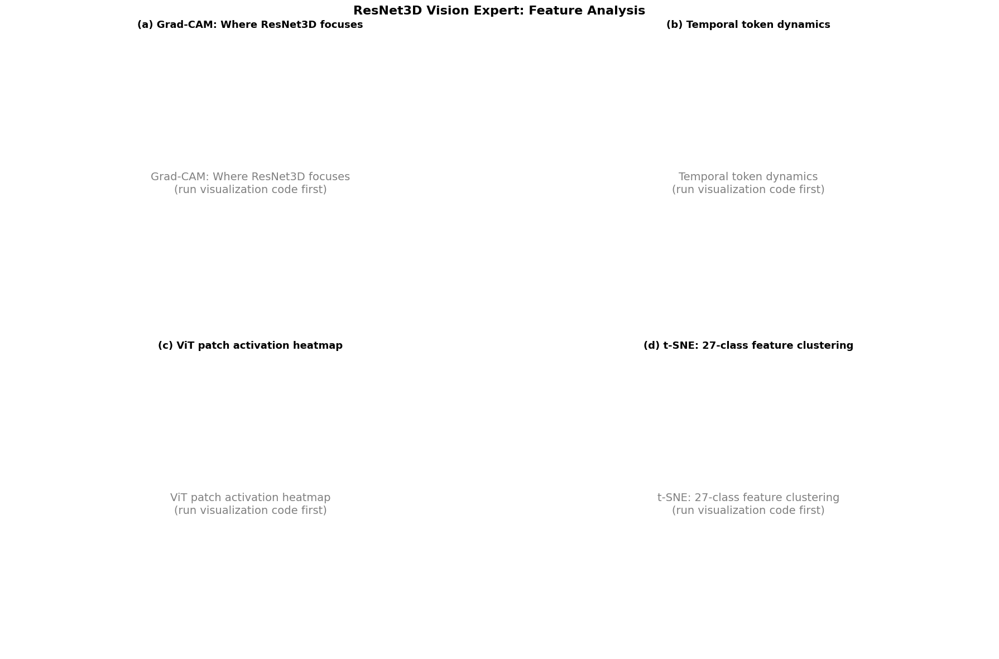

✅ Saved: fig_analysis_combined.png


In [ ]:
# ============================================================
# Slide 6图: 4张分析图拼成一张 (2×2)
# (a) Grad-CAM  (b) Cosine similarity
# (c) Token activation  (d) t-SNE
# 需要之前生成的图片文件
# ============================================================

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# 检查哪些图已经存在
fig_dir = "./"  # 或者你保存图片的目录
pogmoe_dir = "./pogmoe_resnet3d_figures/"

# 可能的文件路径
candidates = {
    'gradcam': [f'{pogmoe_dir}figure1_gradcam.png',
                f'{pogmoe_dir}figure1_resnet3d_gradcam_compact.png',
                'fig_resnet3d_gradcam.png'],
    'temporal': [f'{pogmoe_dir}figure2_temporal.png',
                 f'{pogmoe_dir}figure2_resnet3d_temporal_dynamics_compact.png',
                 'fig_resnet3d_temporal.png',
                 'fig_frame_similarity.png'],
    'patch':    ['fig_patch_activation.png', 'fig_patch_anatomy_v2.png',
                 'fig_token_heatmap.png'],
    'tsne':     [f'{pogmoe_dir}figure3_tsne.png',
                 f'{pogmoe_dir}figure3_resnet3d_tsne_compact.png',
                 'fig_resnet3d_tsne.png'],
}

found = {}
for key, paths in candidates.items():
    for p in paths:
        if os.path.exists(p):
            found[key] = p
            break

print("Found figures:")
for k, v in found.items():
    print(f"  {k}: {v}")

missing = [k for k in candidates if k not in found]
if missing:
    print(f"\n⚠️ Missing: {missing}")
    print("  这些图需要先跑对应的可视化代码生成")
    print("  跳过缺失的图，用placeholder代替")

# 画2×2拼图
fig, axes = plt.subplots(2, 2, figsize=(18, 12))

panel_labels = ['(a)', '(b)', '(c)', '(d)']
panel_titles = [
    'Grad-CAM: Where ResNet3D focuses',
    'Temporal token dynamics',
    'ViT patch activation heatmap',
    't-SNE: 27-class feature clustering'
]
panel_keys = ['gradcam', 'temporal', 'patch', 'tsne']

for i, (ax, label, title, key) in enumerate(zip(
        axes.flat, panel_labels, panel_titles, panel_keys)):
    if key in found:
        img = mpimg.imread(found[key])
        ax.imshow(img)
    else:
        ax.text(0.5, 0.5, f'{title}\n(run visualization code first)',
                transform=ax.transAxes, ha='center', va='center',
                fontsize=14, color='gray')
    ax.set_title(f'{label} {title}', fontsize=13, fontweight='bold', pad=8)
    ax.axis('off')

fig.suptitle('ResNet3D Vision Expert: Feature Analysis',
             fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()
plt.savefig('fig_analysis_combined.png', dpi=200, bbox_inches='tight')
plt.show()
print("✅ Saved: fig_analysis_combined.png")

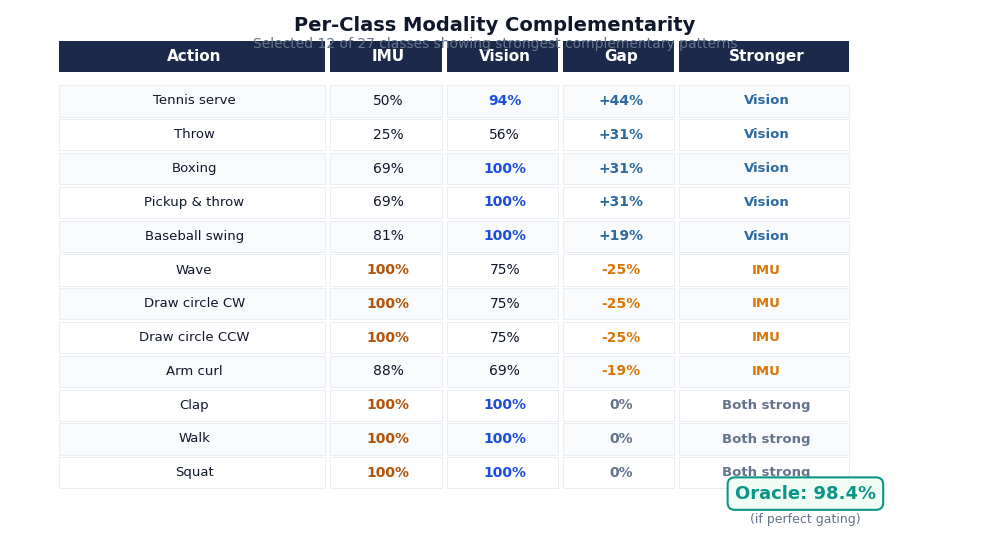

✅ Saved: fig_perclass_table.png


In [ ]:
# ============================================================
# Slide 4: Per-class complementarity table (精选12类)
# 选最互补的 + 两个都强的 + 两个都弱的
# ============================================================

import matplotlib.pyplot as plt
import numpy as np

action_data = [
    # (name, imu_acc, vis_acc) — 选最有说服力的12类
    # Vision远超IMU的
    ("Tennis serve",   50, 94),
    ("Throw",          25, 56),
    ("Boxing",         69, 100),
    ("Pickup & throw", 69, 100),
    ("Baseball swing", 81, 100),
    # IMU远超Vision的
    ("Wave",          100, 75),
    ("Draw circle CW",100, 75),
    ("Draw circle CCW",100, 75),
    ("Arm curl",       88, 69),
    # 两个都强的
    ("Clap",          100, 100),
    ("Walk",          100, 100),
    ("Squat",         100, 100),
]

fig, ax = plt.subplots(figsize=(10, 5.5))
ax.axis('off')

# 表头
col_labels = ['Action', 'IMU', 'Vision', 'Gap', 'Stronger']
col_widths = [0.28, 0.12, 0.12, 0.12, 0.18]
col_x = [0.05]
for w in col_widths[:-1]:
    col_x.append(col_x[-1] + w)

# 颜色
header_color = '#1B2A4A'
row_colors = ['#F8FAFC', '#FFFFFF']
vision_color = '#2D6A9F'
imu_color = '#D97706'
same_color = '#64748B'

# 画表头
for j, (label, x, w) in enumerate(zip(col_labels, col_x, col_widths)):
    rect = plt.Rectangle((x, 0.88), w - 0.005, 0.06,
                          facecolor=header_color, edgecolor='none')
    ax.add_patch(rect)
    ax.text(x + w/2, 0.91, label, ha='center', va='center',
            fontsize=11, color='white', fontweight='bold')

# 画数据行
for i, (name, imu, vis) in enumerate(action_data):
    y = 0.82 - i * 0.065
    bg = row_colors[i % 2]
    gap = vis - imu

    if gap > 5:
        stronger = 'Vision'
        gap_color = vision_color
    elif gap < -5:
        stronger = 'IMU'
        gap_color = imu_color
    else:
        stronger = 'Both strong'
        gap_color = same_color

    # 行背景
    for j, (x, w) in enumerate(zip(col_x, col_widths)):
        rect = plt.Rectangle((x, y - 0.025), w - 0.005, 0.06,
                              facecolor=bg, edgecolor='#E2E8F0', linewidth=0.5)
        ax.add_patch(rect)

    # 文字
    ax.text(col_x[0] + col_widths[0]/2, y + 0.005, name,
            ha='center', va='center', fontsize=9.5, color='#0F172A')

    # IMU数值 + 颜色条
    imu_text_color = '#B45309' if imu >= 90 else '#0F172A'
    ax.text(col_x[1] + col_widths[1]/2, y + 0.005, f'{imu}%',
            ha='center', va='center', fontsize=10, color=imu_text_color,
            fontweight='bold' if imu >= 90 else 'normal')

    # Vision数值
    vis_text_color = '#1D4ED8' if vis >= 90 else '#0F172A'
    ax.text(col_x[2] + col_widths[2]/2, y + 0.005, f'{vis}%',
            ha='center', va='center', fontsize=10, color=vis_text_color,
            fontweight='bold' if vis >= 90 else 'normal')

    # Gap
    gap_str = f'+{gap}%' if gap > 0 else f'{gap}%' if gap < 0 else '0%'
    ax.text(col_x[3] + col_widths[3]/2, y + 0.005, gap_str,
            ha='center', va='center', fontsize=10, color=gap_color, fontweight='bold')

    # Stronger
    ax.text(col_x[4] + col_widths[4]/2, y + 0.005, stronger,
            ha='center', va='center', fontsize=9.5, color=gap_color, fontweight='bold')

# Title
ax.text(0.5, 0.97, 'Per-Class Modality Complementarity',
        ha='center', va='center', fontsize=14, fontweight='bold', color='#0F172A',
        transform=ax.transAxes)
ax.text(0.5, 0.935, 'Selected 12 of 27 classes showing strongest complementary patterns',
        ha='center', va='center', fontsize=10, color='#64748B',
        transform=ax.transAxes)

# Oracle callout
ax.text(0.82, 0.07, 'Oracle: 98.4%', ha='center', va='center',
        fontsize=13, color='#0D9488', fontweight='bold',
        bbox=dict(boxstyle='round,pad=0.4', facecolor='#F0FDF4', edgecolor='#0D9488', linewidth=1.5))
ax.text(0.82, 0.02, '(if perfect gating)', ha='center', va='center',
        fontsize=9, color='#64748B')

ax.set_xlim(0, 1)
ax.set_ylim(0, 1)

plt.tight_layout()
plt.savefig('fig_perclass_table.png', dpi=200, bbox_inches='tight')
plt.show()
print("✅ Saved: fig_perclass_table.png")

Loading data and model...
Downloading: "https://download.pytorch.org/models/r3d_18-b3b3357e.pth" to /root/.cache/torch/hub/checkpoints/r3d_18-b3b3357e.pth


100%|██████████| 127M/127M [00:00<00:00, 213MB/s]


Model loaded (acc=89.3%)

(a) Grad-CAM...


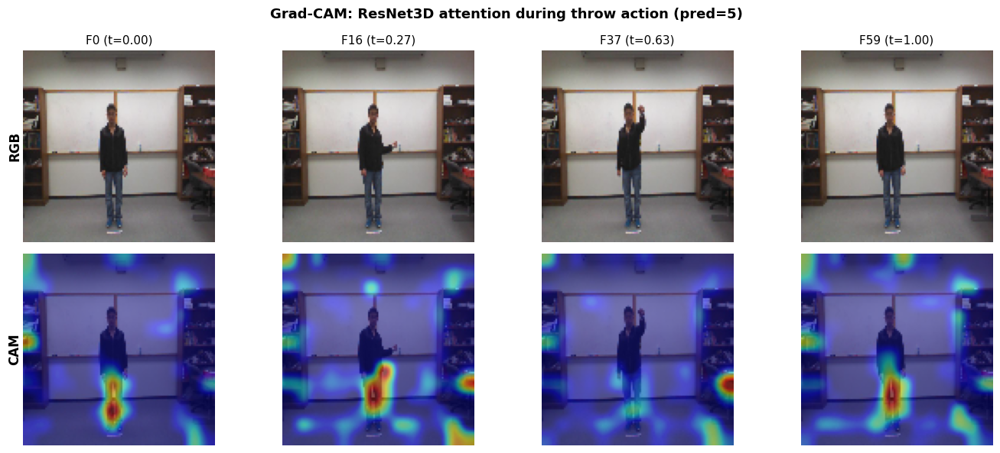

  ✅ Saved: /content/drive/MyDrive/utd_mhad/figures/fig_gradcam.png

(b) Temporal dynamics...


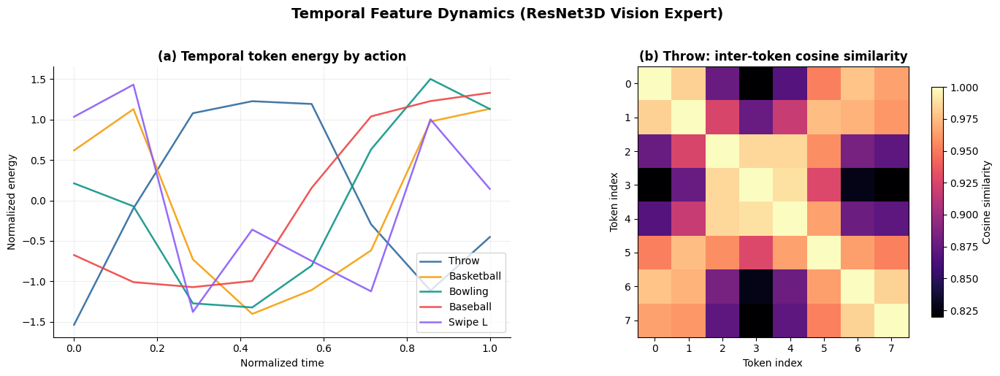

  ✅ Saved: /content/drive/MyDrive/utd_mhad/figures/fig_temporal.png

(c) Token activation...


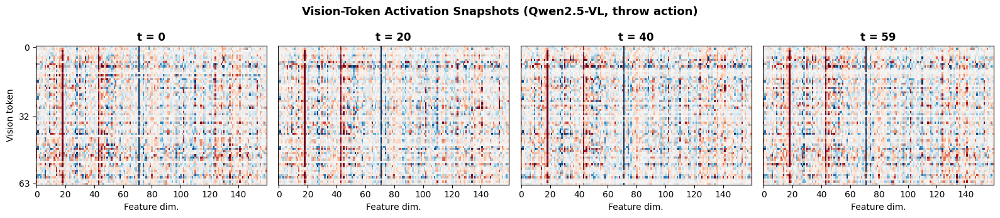

  ✅ Saved: /content/drive/MyDrive/utd_mhad/figures/fig_token_activation.png

(d) t-SNE... (约1-2分钟)
  200/861
  400/861
  600/861
  800/861


/tmp/ipykernel_1860/3739313906.py:239: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab20', 27)


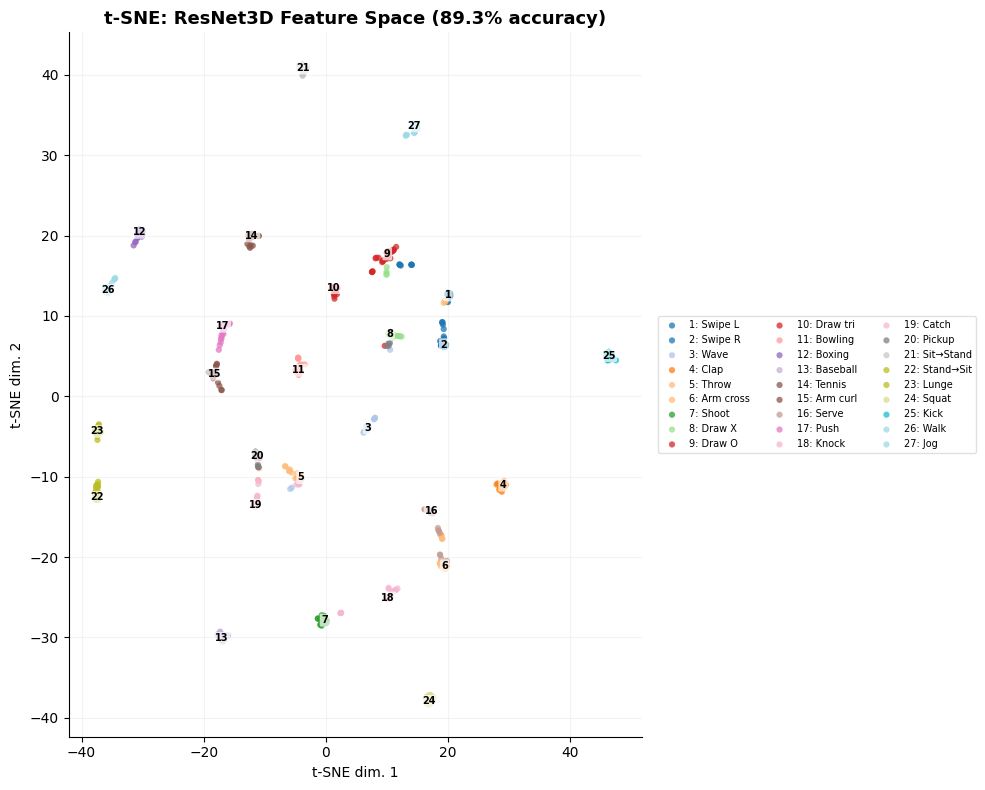

  ✅ Saved: /content/drive/MyDrive/utd_mhad/figures/fig_tsne.png

拼接2×2合图...


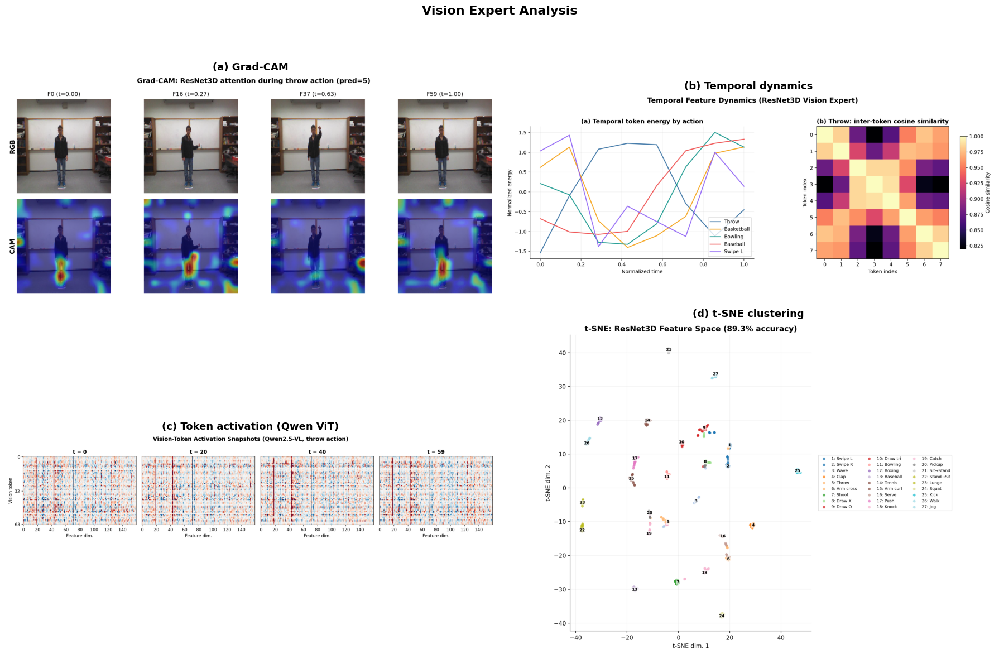


✅ All figures saved to: /content/drive/MyDrive/utd_mhad/figures/


In [ ]:
# ============================================================
# Slide 6: 一键生成4张分析图 (保存到Drive)
# 需要: rgb_data + resnet3d模型
# ============================================================

import torch
import torch.nn as nn
import torchvision
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image as PILImage
from sklearn.manifold import TSNE
import os

SAVE_DIR = "/content/drive/MyDrive/utd_mhad/figures/"
DATA_ROOT = "/content/drive/MyDrive/utd_mhad"
os.makedirs(SAVE_DIR, exist_ok=True)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# ── 加载数据和模型 ──
print("Loading data and model...")
rgb_data = torch.load(f"{DATA_ROOT}/rgb_frames_112.pt", map_location='cpu', weights_only=False)

class ResNet3DExpert(nn.Module):
    def __init__(self, d_model=256, dropout=0.3):
        super().__init__()
        backbone = torchvision.models.video.r3d_18(
            weights=torchvision.models.video.R3D_18_Weights.DEFAULT)
        self.features = nn.Sequential(
            backbone.stem, backbone.layer1, backbone.layer2,
            backbone.layer3, backbone.layer4)
        self.spatial_pool = nn.AdaptiveAvgPool3d((None, 1, 1))
        self.proj = nn.Sequential(nn.Linear(512, d_model), nn.GELU(), nn.Dropout(dropout))
        self.cls_token = nn.Parameter(torch.randn(1, 1, d_model) * 0.02)
        self.pos_embed = nn.Parameter(torch.randn(1, 65, d_model) * 0.02)
        enc_layer = nn.TransformerEncoderLayer(
            d_model=d_model, nhead=8, dim_feedforward=d_model*4,
            dropout=dropout, activation='gelu', batch_first=True)
        self.temporal_transformer = nn.TransformerEncoder(enc_layer, num_layers=2)
        self.head = nn.Sequential(nn.LayerNorm(d_model), nn.Dropout(dropout), nn.Linear(d_model, 27))
    def forward(self, x, return_tokens=False):
        B = x.shape[0]
        feat = self.spatial_pool(self.features(x)).squeeze(-1).squeeze(-1).permute(0, 2, 1)
        T_out = feat.shape[1]
        feat = self.proj(feat)
        feat = torch.cat([self.cls_token.expand(B,-1,-1), feat], dim=1)
        feat = feat + self.pos_embed[:, :T_out+1, :]
        feat = self.temporal_transformer(feat)
        if return_tokens:
            return feat[:, 1:, :]
        return self.head(feat[:, 0, :])

model = ResNet3DExpert().to(device)
ckpt = torch.load(f"{DATA_ROOT}/resnet3d_vision_expert.pt", map_location=device, weights_only=False)
model.load_state_dict(ckpt['model_state'])
model.eval()
print(f"Model loaded (acc={ckpt['best_acc']:.1%})")

def to_uint8(frame):
    f = frame.numpy() if torch.is_tensor(frame) else frame
    if f.max() <= 1.0:
        f = f * 255.0
    return np.clip(f, 0, 255).astype(np.uint8)

# ============================================================
# 图(a): Grad-CAM (layer3, 14×14)
# ============================================================
print("\n(a) Grad-CAM...")

activation, gradient = {}, {}
def fwd_hook(m, inp, out): activation["v"] = out.detach()
def bwd_hook(m, gi, go): gradient["v"] = go[0].detach()

h1 = model.features[3].register_forward_hook(fwd_hook)
h2 = model.features[3].register_full_backward_hook(bwd_hook)

key = (5, 1, 1)
frames = rgb_data[key].float().permute(3, 0, 1, 2).unsqueeze(0).to(device)
frames.requires_grad_(True)
output = model(frames)
pred = output.argmax(1).item()
model.zero_grad()
output[0, pred].backward()

grads = gradient["v"]
acts = activation["v"]
cam = torch.relu((grads.mean(dim=[2,3,4], keepdim=True) * acts).sum(dim=1, keepdim=True))
cam = cam.squeeze().detach().cpu().numpy()
h1.remove(); h2.remove()

T_cam = cam.shape[0]
cam_to_frame = np.linspace(0, 59, T_cam, dtype=int)
cam_indices = np.linspace(0, T_cam-1, 4, dtype=int)

fig, axes = plt.subplots(2, 4, figsize=(14, 6))
for i, ci in enumerate(cam_indices):
    fi = cam_to_frame[ci]
    orig = to_uint8(rgb_data[key][fi])
    cam_s = cam[ci]
    cam_n = (cam_s - cam_s.min()) / (cam_s.max() - cam_s.min() + 1e-8)
    cam_r = np.array(PILImage.fromarray(cam_n.astype(np.float32)).resize((112,112), PILImage.BICUBIC))

    axes[0,i].imshow(orig); axes[0,i].axis('off')
    axes[0,i].set_title(f'F{fi} (t={fi/59:.2f})', fontsize=11)
    axes[1,i].imshow(orig)
    axes[1,i].imshow(cam_r, cmap='jet', alpha=0.5, vmin=0, vmax=1)
    axes[1,i].axis('off')

axes[0,0].text(-0.08, 0.5, 'RGB', transform=axes[0,0].transAxes,
               rotation=90, va='center', fontsize=12, fontweight='bold')
axes[1,0].text(-0.08, 0.5, 'CAM', transform=axes[1,0].transAxes,
               rotation=90, va='center', fontsize=12, fontweight='bold')
fig.suptitle(f'Grad-CAM: ResNet3D attention during throw action (pred={pred+1})',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(f'{SAVE_DIR}fig_gradcam.png', dpi=200, bbox_inches='tight')
plt.show()
print(f"  ✅ Saved: {SAVE_DIR}fig_gradcam.png")

# ============================================================
# 图(b): Temporal dynamics (energy + cosine similarity)
# ============================================================
print("\n(b) Temporal dynamics...")

action_list = {5: "Throw", 6: "Basketball", 12: "Bowling", 14: "Baseball", 1: "Swipe L"}
colors_map = {"Throw": "#2D6A9F", "Basketball": "#F59E0B", "Bowling": "#0D9488",
              "Baseball": "#EF4444", "Swipe L": "#8B5CF6"}

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# 左: temporal energy
for act, name in action_list.items():
    k = (act, 1, 1)
    if k not in rgb_data: continue
    x = rgb_data[k].float().permute(3,0,1,2).unsqueeze(0).to(device)
    with torch.no_grad():
        tok = model(x, return_tokens=True).squeeze().cpu()
    energy = tok.norm(dim=1).numpy()
    e_norm = (energy - energy.mean()) / (energy.std() + 1e-8)
    t = np.linspace(0, 1, len(e_norm))
    axes[0].plot(t, e_norm, label=name, color=colors_map[name], linewidth=1.8, alpha=0.9)

axes[0].set_title('(a) Temporal token energy by action', fontsize=12, fontweight='bold')
axes[0].set_xlabel('Normalized time'); axes[0].set_ylabel('Normalized energy')
axes[0].legend(fontsize=10); axes[0].grid(True, alpha=0.2)
axes[0].spines['top'].set_visible(False); axes[0].spines['right'].set_visible(False)

# 右: cosine similarity
k = (5, 1, 1)
x = rgb_data[k].float().permute(3,0,1,2).unsqueeze(0).to(device)
with torch.no_grad():
    tok = model(x, return_tokens=True).squeeze().cpu()
tok_n = tok / (tok.norm(dim=1, keepdim=True) + 1e-8)
sim = (tok_n @ tok_n.T).numpy()

im = axes[1].imshow(sim, cmap='magma', vmin=np.percentile(sim,3), vmax=np.percentile(sim,99.5))
axes[1].set_title('(b) Throw: inter-token cosine similarity', fontsize=12, fontweight='bold')
axes[1].set_xlabel('Token index'); axes[1].set_ylabel('Token index')
axes[1].set_aspect('equal')
plt.colorbar(im, ax=axes[1], shrink=0.85, label='Cosine similarity')

fig.suptitle('Temporal Feature Dynamics (ResNet3D Vision Expert)', fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(f'{SAVE_DIR}fig_temporal.png', dpi=200, bbox_inches='tight')
plt.show()
print(f"  ✅ Saved: {SAVE_DIR}fig_temporal.png")

# ============================================================
# 图(c): Qwen ViT token activation (如果有缓存)
# ============================================================
print("\n(c) Token activation...")

qwen_path = f"{DATA_ROOT}/vision_tokens_qwen25.pt"
if os.path.exists(qwen_path):
    from matplotlib.colors import TwoSlopeNorm
    vision_cache = torch.load(qwen_path, map_location='cpu', weights_only=False)
    tokens = vision_cache[(5, 1, 1)]  # throw

    fig, axes = plt.subplots(1, 4, figsize=(16, 3.5))
    times = [0, 20, 40, 59]
    for i, t in enumerate(times):
        data = tokens[t, :, :160].numpy()
        vmax = np.percentile(np.abs(data), 98)
        norm = TwoSlopeNorm(vmin=-vmax, vcenter=0, vmax=vmax)
        axes[i].imshow(data, aspect='auto', cmap='RdBu_r', norm=norm, interpolation='nearest')
        axes[i].set_title(f't = {t}', fontsize=12, fontweight='bold')
        axes[i].set_xlabel('Feature dim.')
        if i == 0:
            axes[i].set_ylabel('Vision token')
            axes[i].set_yticks([0, 32, 63])
        else:
            axes[i].set_yticks([])

    fig.suptitle('Vision-Token Activation Snapshots (Qwen2.5-VL, throw action)',
                 fontsize=13, fontweight='bold')
    plt.tight_layout()
    plt.savefig(f'{SAVE_DIR}fig_token_activation.png', dpi=200, bbox_inches='tight')
    plt.show()
    print(f"  ✅ Saved: {SAVE_DIR}fig_token_activation.png")
else:
    print(f"  ⚠️ Qwen tokens not found at {qwen_path}, skipping")

# ============================================================
# 图(d): t-SNE
# ============================================================
print("\n(d) t-SNE... (约1-2分钟)")

features_list, labels_list = [], []
with torch.no_grad():
    for i, ((action, subject, trial), frames) in enumerate(rgb_data.items()):
        x = frames.float().permute(3,0,1,2).unsqueeze(0).to(device)
        tok = model(x, return_tokens=True).squeeze().cpu()
        features_list.append(tok.mean(dim=0).numpy())
        labels_list.append(action)
        if (i+1) % 200 == 0: print(f"  {i+1}/{len(rgb_data)}")

features_np = np.array(features_list)
labels_np = np.array(labels_list)

try:
    tsne = TSNE(n_components=2, perplexity=30, random_state=42,
                init='pca', learning_rate='auto', max_iter=1000)
except TypeError:
    tsne = TSNE(n_components=2, perplexity=30, random_state=42,
                init='pca', learning_rate='auto', n_iter=1000)

embedded = tsne.fit_transform(features_np)

action_short = {
    1:'Swipe L', 2:'Swipe R', 3:'Wave', 4:'Clap', 5:'Throw',
    6:'Arm cross', 7:'Shoot', 8:'Draw X', 9:'Draw O',
    10:'Draw tri', 11:'Bowling', 12:'Boxing', 13:'Baseball',
    14:'Tennis', 15:'Arm curl', 16:'Serve', 17:'Push',
    18:'Knock', 19:'Catch', 20:'Pickup', 21:'Sit→Stand',
    22:'Stand→Sit', 23:'Lunge', 24:'Squat', 25:'Kick',
    26:'Walk', 27:'Jog'}

fig, ax = plt.subplots(figsize=(10, 8))
cmap = plt.cm.get_cmap('tab20', 27)

for act in range(1, 28):
    mask = labels_np == act
    if mask.sum() == 0: continue
    ax.scatter(embedded[mask,0], embedded[mask,1], s=20, alpha=0.75,
               color=cmap(act-1), edgecolors='none',
               label=f'{act}: {action_short.get(act)}')
    cx, cy = np.median(embedded[mask,0]), np.median(embedded[mask,1])
    ax.text(cx, cy, str(act), fontsize=7, fontweight='bold', ha='center', va='center',
            bbox=dict(boxstyle='round,pad=0.15', facecolor='white', edgecolor='none', alpha=0.7))

ax.set_title('t-SNE: ResNet3D Feature Space (89.3% accuracy)', fontsize=13, fontweight='bold')
ax.set_xlabel('t-SNE dim. 1'); ax.set_ylabel('t-SNE dim. 2')
ax.legend(fontsize=7, ncol=3, loc='center left', bbox_to_anchor=(1.02, 0.5),
          frameon=True, framealpha=0.9, edgecolor='#ddd')
ax.grid(True, alpha=0.15)
ax.spines['top'].set_visible(False); ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.savefig(f'{SAVE_DIR}fig_tsne.png', dpi=200, bbox_inches='tight')
plt.show()
print(f"  ✅ Saved: {SAVE_DIR}fig_tsne.png")

# ── 最后拼成2×2 ──
print("\n拼接2×2合图...")
import matplotlib.image as mpimg

fig, axes = plt.subplots(2, 2, figsize=(18, 12))
panels = [
    (f'{SAVE_DIR}fig_gradcam.png', '(a) Grad-CAM'),
    (f'{SAVE_DIR}fig_temporal.png', '(b) Temporal dynamics'),
    (f'{SAVE_DIR}fig_token_activation.png', '(c) Token activation (Qwen ViT)'),
    (f'{SAVE_DIR}fig_tsne.png', '(d) t-SNE clustering'),
]

for ax, (path, title) in zip(axes.flat, panels):
    if os.path.exists(path):
        ax.imshow(mpimg.imread(path))
    else:
        ax.text(0.5, 0.5, f'{title}\n(not generated)', transform=ax.transAxes,
                ha='center', va='center', fontsize=14, color='gray')
    ax.set_title(title, fontsize=13, fontweight='bold')
    ax.axis('off')

fig.suptitle('Vision Expert Analysis', fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()
plt.savefig(f'{SAVE_DIR}fig_analysis_combined.png', dpi=200, bbox_inches='tight')
plt.show()
print(f"\n✅ All figures saved to: {SAVE_DIR}")

Using cached t-SNE result


/tmp/ipykernel_1860/1723606204.py:35: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab20', 27)


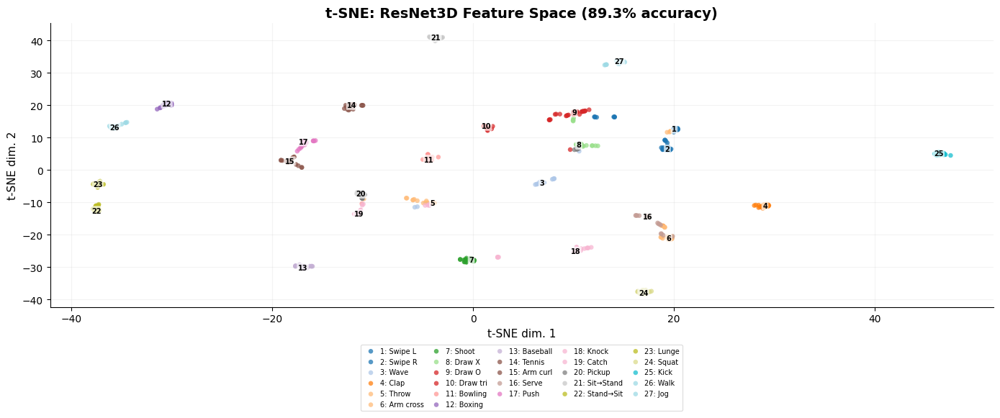

✅ Saved: /content/drive/MyDrive/utd_mhad/figures/fig_tsne_wide.png


In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

SAVE_DIR = "/content/drive/MyDrive/utd_mhad/figures/"

# features_np 和 labels_np 应该还在内存里
# 如果不在，需要重新跑提取特征的循环

# 如果embedded还在内存里直接用，否则重新算
try:
    _ = embedded.shape
    print("Using cached t-SNE result")
except:
    print("Recomputing t-SNE...")
    try:
        tsne = TSNE(n_components=2, perplexity=30, random_state=42,
                    init='pca', learning_rate='auto', max_iter=1000)
    except TypeError:
        tsne = TSNE(n_components=2, perplexity=30, random_state=42,
                    init='pca', learning_rate='auto', n_iter=1000)
    embedded = tsne.fit_transform(features_np)

action_short = {
    1:'Swipe L', 2:'Swipe R', 3:'Wave', 4:'Clap', 5:'Throw',
    6:'Arm cross', 7:'Shoot', 8:'Draw X', 9:'Draw O',
    10:'Draw tri', 11:'Bowling', 12:'Boxing', 13:'Baseball',
    14:'Tennis', 15:'Arm curl', 16:'Serve', 17:'Push',
    18:'Knock', 19:'Catch', 20:'Pickup', 21:'Sit→Stand',
    22:'Stand→Sit', 23:'Lunge', 24:'Squat', 25:'Kick',
    26:'Walk', 27:'Jog'}

fig, ax = plt.subplots(figsize=(14, 6))
cmap = plt.cm.get_cmap('tab20', 27)

for act in range(1, 28):
    mask = labels_np == act
    if mask.sum() == 0: continue
    ax.scatter(embedded[mask,0], embedded[mask,1], s=22, alpha=0.75,
               color=cmap(act-1), edgecolors='none',
               label=f'{act}: {action_short.get(act)}')
    cx, cy = np.median(embedded[mask,0]), np.median(embedded[mask,1])
    ax.text(cx, cy, str(act), fontsize=7, fontweight='bold', ha='center', va='center',
            bbox=dict(boxstyle='round,pad=0.15', facecolor='white', edgecolor='none', alpha=0.7))

ax.set_title('t-SNE: ResNet3D Feature Space (89.3% accuracy)',
             fontsize=14, fontweight='bold')
ax.set_xlabel('t-SNE dim. 1', fontsize=11)
ax.set_ylabel('t-SNE dim. 2', fontsize=11)
ax.legend(fontsize=7, ncol=5, loc='upper center', bbox_to_anchor=(0.5, -0.12),
          frameon=True, framealpha=0.9, edgecolor='#ddd',
          handletextpad=0.3, columnspacing=0.8)
ax.grid(True, alpha=0.15)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.savefig(f'{SAVE_DIR}fig_tsne_wide.png', dpi=200, bbox_inches='tight')
plt.show()
print(f"✅ Saved: {SAVE_DIR}fig_tsne_wide.png")

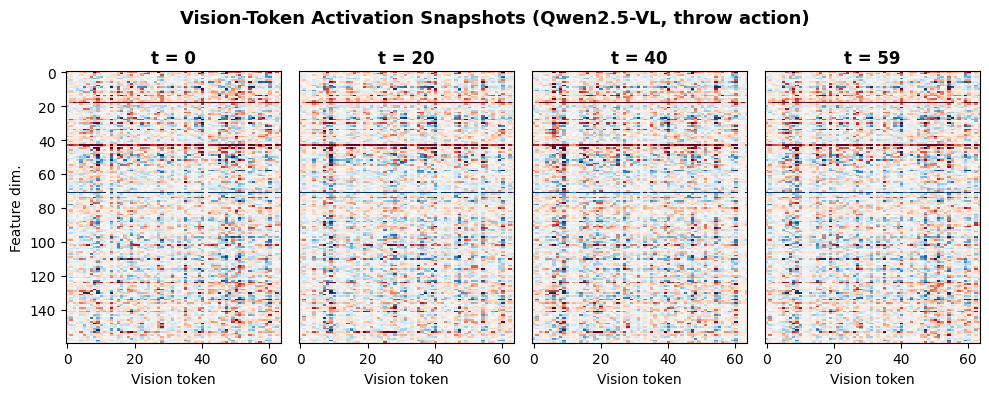

✅ Saved: /content/drive/MyDrive/utd_mhad/figures/fig_token_activation_tall.png


In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

SAVE_DIR = "/content/drive/MyDrive/utd_mhad/figures/"
DATA_ROOT = "/content/drive/MyDrive/utd_mhad"

vision_cache = torch.load(f"{DATA_ROOT}/vision_tokens_qwen25.pt",
                           map_location='cpu', weights_only=False)
tokens = vision_cache[(5, 1, 1)]

fig, axes = plt.subplots(1, 4, figsize=(10, 4))
times = [0, 20, 40, 59]

for i, t in enumerate(times):
    data = tokens[t, :, :160].numpy()  # (64, 160)
    # 转置: x轴=64 tokens (短), y轴=160 dims (长)
    data_T = data.T  # (160, 64)
    vmax = np.percentile(np.abs(data_T), 98)
    norm = TwoSlopeNorm(vmin=-vmax, vcenter=0, vmax=vmax)
    axes[i].imshow(data_T, aspect='auto', cmap='RdBu_r', norm=norm, interpolation='nearest')
    axes[i].set_title(f't = {t}', fontsize=12, fontweight='bold')
    axes[i].set_xlabel('Vision token', fontsize=10)
    if i == 0:
        axes[i].set_ylabel('Feature dim.', fontsize=10)
    else:
        axes[i].set_yticks([])

fig.suptitle('Vision-Token Activation Snapshots (Qwen2.5-VL, throw action)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(f'{SAVE_DIR}fig_token_activation_tall.png', dpi=200, bbox_inches='tight')
plt.show()
print(f"✅ Saved: {SAVE_DIR}fig_token_activation_tall.png")